In [1]:
# SETUP

import os
import traceback
import numpy as np
import time
import matplotlib.pyplot as plt
#from cuda import cuda, nvrtc

from hyperbolicTSNE.util import find_last_embedding
from hyperbolicTSNE.visualization import plot_poincare, animate
from hyperbolicTSNE import load_data, Datasets, SequentialOptimizer, initialization, HyperbolicTSNE
from hyperbolicTSNE.quality_evaluation_ import hyperbolic_nearest_neighbor_preservation


data_home = "datasets"
log_path = "temp/poincaregpu/"  # path for saving embedding snapshots

only_animate = False
seed = 42
dataset = Datasets.MNIST  # the Datasets handler provides access to several data sets used throughout the repository
perp = 15  # we use a perplexity of 30 in this example
logging = False

Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.


In [2]:
def run_mult(count = 5, num_points = 1000, exact=False, use_uniform_grid=False, uniform_grid_n=10):
    precisions = []
    recalls = []
    runtimes = []

    for i in range(count):
        p, r, t = run(num_points, exact, use_uniform_grid, uniform_grid_n)
        precisions.append(p)
        recalls.append(r)
        runtimes.append(t)

    return np.mean(precisions, axis=0), np.mean(recalls, axis=0), np.mean(runtimes, axis=0)

def run(num_points = 1000, exact=False, use_uniform_grid=False, uniform_grid_n=10, seed=None):
    global logging
    global log_path

    if (seed == None):
        seed = np.random.randint(100)

    dataX, dataLabels, D, V, _ = load_data(
        dataset, 
        data_home=data_home, 
        random_state=seed, 
        to_return="X_labels_D_V",
        hd_params={"perplexity": perp}, 
        sample=num_points, 
        knn_method="hnswlib"  # we use an approximation of high-dimensional neighbors to speed up computations
    )

    print("Loading data")

    start_time = time.time()


    end_time = time.time()

    execution_time = end_time - start_time
    print("Data loading:", execution_time, "seconds")

    exaggeration_factor = 12  # Just like regular t-SNE, we use early exaggeration with a factor of 12
    learning_rate = (dataX.shape[0] * 1) / (exaggeration_factor * 1000)  # We adjust the learning rate to the hyperbolic setting
    ex_iterations = 250  # The embedder is to execute 250 iterations of early exaggeration, ...
    main_iterations = 750  # ... followed by 750 iterations of non-exaggerated gradient descent.



    # ============= RUNNING =============

    opt_config = dict(
        learning_rate_ex=learning_rate,  # learning rate during exaggeration
        learning_rate_main=learning_rate,  # learning rate main optimization 
        exaggeration=exaggeration_factor, 
        exaggeration_its=ex_iterations, 
        gradientDescent_its=main_iterations, 
        vanilla=False,  # if vanilla is set to true, regular gradient descent without any modifications is performed; for  vanilla set to false, the optimization makes use of momentum and gains
        momentum_ex=0.5,  # Set momentum during early exaggeration to 0.5
        momentum=0.8,  # Set momentum during non-exaggerated gradient descent to 0.8
        exact=exact,  # To use the quad tree for acceleration (like Barnes-Hut in the Euclidean setting) or to evaluate the gradient exactly
        area_split=False,  # To build or not build the polar quad tree based on equal area splitting or - alternatively - on equal length splitting
        n_iter_check=10,  # Needed for early stopping criterion
        size_tol=0.999,  # Size of the embedding to be used as early stopping criterion
        uniform_grid_n = uniform_grid_n,
        use_uniform_grid = use_uniform_grid
    )

    opt_params = SequentialOptimizer.sequence_poincare(**opt_config)

    #print("Sequence defined")

    # Start: configure logging
    if logging:
        logging_dict = {
            "log_path": log_path
        }
        opt_params["logging_dict"] = logging_dict

        log_path = opt_params["logging_dict"]["log_path"]
        # Delete old log path
        if os.path.exists(log_path) and not only_animate:
            import shutil
            shutil.rmtree(log_path)
    # End: logging

    # Compute an initial embedding of the data via PCA
    X_embedded = initialization(
        n_samples=dataX.shape[0],
        n_components=2,
        X=dataX,
        random_state=seed,
        method="pca"
    )

    actual_num_samples = X_embedded.shape[0]

    # Initialize the embedder
    htsne = HyperbolicTSNE(
        init=X_embedded, 
        n_components=2, 
        metric="precomputed", 
        verbose=True, 
        opt_method=SequentialOptimizer, 
        opt_params=opt_params
    )

    start_time = time.time()

    try:
        hyperbolicEmbedding = htsne.fit_transform((D, V))
    except ValueError:
        print("Error!")
        hyperbolicEmbedding = find_last_embedding(log_path)
        traceback.print_exc()

    end_time = time.time()

    execution_time = end_time - start_time
    if exact:
        if use_uniform_grid:
            print(f"[GPU Exact, d={dataset}, n={actual_num_samples}, seed={seed}] Execution time:", execution_time, "seconds")
        else:
            print(f"[CPU Exact, d={dataset}, n={actual_num_samples}, seed={seed}] Execution time:", execution_time, "seconds")
    elif use_uniform_grid:
        print(f"[UGrid, d={dataset}, n={actual_num_samples}, grid_n={uniform_grid_n}, seed={seed}] Execution time:", execution_time, "seconds")
    else:
        print(f"[QTree, d={dataset}, n={actual_num_samples}, seed={seed}] Execution time:", execution_time, "seconds")

        
    _, precisions, recalls, _ = hyperbolic_nearest_neighbor_preservation(
        dataX,
        hyperbolicEmbedding,
        k_start=1,
        k_max=30,
        D_X=None,
        exact_nn=True,
        consider_order=False,
        strict=False,
        to_return="full"
    )

    print(f"Precision: {precisions}, recall: {recalls}")

    # Create a rendering of the embedding and save it to a file
    if not os.path.exists("results"):
        os.mkdir("results")
    fig = plot_poincare(hyperbolicEmbedding, dataLabels)
    fig.show()
    fig.savefig(f"results/{dataset.name}-inexact.png")

    return precisions, recalls, execution_time

In [15]:
# RUNNING AMAZON DATASET TEST
num_points = 0
grid_n = 100

dataset = Datasets.AMAZON
p, r, t = run(num_points, False, True, grid_n)

Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 173.06184 grad_norm: 3.46852e-02:  74%|███████▎  | 184/250 [4:55:55<1:47:57, 98.14s/it]                                                                                                                                                                                                                                                                                                              

Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.13771 grad_norm: 7.17045e-01: 100%|██████████| 250/250 [01:15<00:00,  3.33it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.66764 grad_norm: 2.26985e-01:  41%|████      | 309/750 [01:39<02:22,  3.10it/s]


4
[GPU Exact, n=10000, seed=84] Execution time: 174.95304369926453 seconds
Precision: [0.5006, 0.4864, 0.4706333333333333, 0.458075, 0.44606, 0.43385, 0.42424285714285714, 0.41475, 0.4065888888888889, 0.39865000000000006, 0.39180909090909083, 0.3847833333333333, 0.3782692307692308, 0.3719071428571428, 0.36565333333333333, 0.360225, 0.35465882352941175, 0.3494611111111111, 0.3438894736842105, 0.338845, 0.33428095238095235, 0.3295727272727272, 0.32516521739130433, 0.3209125, 0.31664000000000003, 0.3126, 0.30842592592592594, 0.3042285714285714, 0.30042068965517243, 0.29673999999999995], recall: [0.01668666666666667, 0.03242666666666666, 0.04706333333333333, 0.06107666666666667, 0.07434333333333333, 0.08677, 0.09899000000000001, 0.1106, 0.12197666666666666, 0.13288333333333335, 0.14366333333333334, 0.15391333333333332, 0.16391666666666668, 0.17355666666666666, 0.18282666666666667, 0.19212, 0.20097333333333334, 0.20967666666666665, 0.21779666666666667, 0.22589666666666666, 0.233996666666666

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.14222 grad_norm: 7.16904e-01: 100%|██████████| 250/250 [01:12<00:00,  3.43it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.81372 grad_norm: 2.04585e-01:  36%|███▌      | 269/750 [01:22<02:27,  3.26it/s]


4
[GPU Exact, n=10000, seed=61] Execution time: 155.38188314437866 seconds
Precision: [0.5183, 0.49495, 0.4772666666666666, 0.463575, 0.4511, 0.4390333333333333, 0.4286, 0.4192875, 0.4111888888888889, 0.40234000000000003, 0.3946999999999999, 0.3876166666666667, 0.38072307692307694, 0.3741285714285715, 0.3678333333333334, 0.3618375, 0.35573529411764704, 0.3506777777777778, 0.34574210526315785, 0.34082499999999993, 0.3362952380952381, 0.3320727272727273, 0.32764782608695653, 0.3234541666666666, 0.319444, 0.3157230769230769, 0.3117481481481481, 0.30813214285714285, 0.3041379310344827, 0.30045333333333335], recall: [0.017276666666666666, 0.03299666666666667, 0.04772666666666667, 0.06180999999999999, 0.07518333333333332, 0.08780666666666666, 0.10000666666666667, 0.11181000000000002, 0.12335666666666666, 0.13411333333333333, 0.14472333333333337, 0.15504666666666667, 0.16498000000000002, 0.17459333333333335, 0.1839166666666667, 0.19298, 0.20158333333333334, 0.21040666666666671, 0.218969999999

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.11712 grad_norm: 7.15543e-01: 100%|██████████| 250/250 [01:13<00:00,  3.39it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.62976 grad_norm: 1.31083e+00:  43%|████▎     | 319/750 [01:38<02:12,  3.25it/s]


4
[GPU Exact, n=10000, seed=62] Execution time: 171.90459561347961 seconds
Precision: [0.5296, 0.5102, 0.4942666666666667, 0.482225, 0.46981999999999996, 0.4569166666666667, 0.44577142857142854, 0.435525, 0.4258888888888889, 0.41636999999999996, 0.4083636363636363, 0.40051666666666663, 0.39321538461538463, 0.3865357142857142, 0.3800133333333333, 0.373875, 0.3679823529411765, 0.36238888888888887, 0.3568315789473684, 0.352045, 0.3471714285714286, 0.3422590909090909, 0.3374826086956522, 0.3331541666666667, 0.32874400000000004, 0.3245192307692308, 0.32041851851851855, 0.31665, 0.3127034482758621, 0.3089533333333333], recall: [0.017653333333333333, 0.034013333333333326, 0.04942666666666667, 0.06429666666666665, 0.07830333333333334, 0.09138333333333334, 0.10401333333333335, 0.11614000000000001, 0.12776666666666667, 0.13879, 0.14973333333333333, 0.1602066666666667, 0.17039333333333334, 0.18038333333333334, 0.19000666666666666, 0.1994, 0.20852333333333337, 0.21743333333333334, 0.22599333333333

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.13546 grad_norm: 7.15491e-01: 100%|██████████| 250/250 [01:11<00:00,  3.51it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.75934 grad_norm: 1.21019e+00:  39%|███▊      | 289/750 [01:24<02:14,  3.42it/s]


4
[GPU Exact, n=10000, seed=98] Execution time: 155.6262664794922 seconds
Precision: [0.5117, 0.49575, 0.4768333333333333, 0.464725, 0.4521, 0.4409333333333333, 0.43068571428571434, 0.42115, 0.4127333333333333, 0.40374, 0.3954363636363636, 0.3876666666666667, 0.38091538461538466, 0.3748214285714285, 0.3680333333333333, 0.36156875, 0.35609411764705884, 0.35045, 0.3448210526315789, 0.339825, 0.33470952380952373, 0.33044090909090906, 0.3257304347826087, 0.32119583333333335, 0.31683600000000006, 0.3127961538461539, 0.30900370370370367, 0.3049107142857142, 0.3010758620689656, 0.29760000000000003], recall: [0.017056666666666668, 0.033049999999999996, 0.047683333333333335, 0.061963333333333336, 0.07535, 0.08818666666666666, 0.10049333333333334, 0.11230666666666668, 0.12382, 0.13458, 0.14499333333333334, 0.15506666666666669, 0.16506333333333334, 0.17491666666666666, 0.18401666666666666, 0.19283666666666668, 0.20178666666666667, 0.21027000000000004, 0.21838666666666667, 0.22655, 0.2342966666666

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.17782 grad_norm: 7.12104e-01: 100%|██████████| 250/250 [01:09<00:00,  3.62it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.63979 grad_norm: 1.57963e+00:  43%|████▎     | 319/750 [01:33<02:06,  3.40it/s]


4
[GPU Exact, n=10000, seed=48] Execution time: 162.83776998519897 seconds
Precision: [0.5137, 0.4921, 0.4755666666666667, 0.46315, 0.45108000000000004, 0.4398666666666667, 0.4298857142857143, 0.4200375, 0.4114111111111111, 0.40335999999999994, 0.39603636363636363, 0.3892083333333333, 0.3824538461538462, 0.3763357142857143, 0.3702533333333333, 0.36475, 0.35984705882352935, 0.3550722222222223, 0.35014736842105265, 0.34565, 0.3408095238095238, 0.3361818181818182, 0.33177826086956524, 0.327325, 0.322956, 0.31908461538461536, 0.31499629629629633, 0.31120357142857147, 0.3074758620689655, 0.30378999999999995], recall: [0.017123333333333334, 0.032806666666666665, 0.047556666666666664, 0.061753333333333334, 0.07518, 0.08797333333333335, 0.10030666666666668, 0.11201000000000001, 0.12342333333333333, 0.13445333333333334, 0.14521333333333336, 0.15568333333333334, 0.16573000000000002, 0.17562333333333335, 0.18512666666666666, 0.19453333333333334, 0.2039133333333333, 0.21304333333333333, 0.22176000

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.13188 grad_norm: 7.11145e-01: 100%|██████████| 250/250 [00:40<00:00,  6.15it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.51648 grad_norm: 7.83953e-01:  47%|████▋     | 349/750 [00:57<01:06,  6.06it/s]


4
[UGrid, n=10000, grid_n=100, seed=23] Execution time: 98.23325109481812 seconds
Precision: [0.5699, 0.5502, 0.5344666666666666, 0.51695, 0.5022800000000001, 0.4890833333333333, 0.4777142857142857, 0.46645, 0.4574333333333333, 0.44755, 0.438190909090909, 0.4303583333333334, 0.42213076923076925, 0.41400714285714296, 0.4065333333333333, 0.39955, 0.3928882352941176, 0.3863611111111111, 0.37998947368421054, 0.37383, 0.3681047619047619, 0.3630590909090909, 0.3576782608695652, 0.35245, 0.3472800000000001, 0.3421384615384615, 0.336862962962963, 0.3319642857142857, 0.3272517241379311, 0.32281333333333334], recall: [0.018996666666666665, 0.03668, 0.053446666666666656, 0.06892666666666666, 0.08371333333333333, 0.09781666666666668, 0.11146666666666667, 0.12438666666666667, 0.13723, 0.14918333333333336, 0.16067000000000004, 0.17214333333333334, 0.18292333333333335, 0.19320333333333337, 0.20326666666666665, 0.21309333333333333, 0.22263666666666668, 0.23181666666666664, 0.24065999999999999, 0.24922

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.13166 grad_norm: 7.14048e-01: 100%|██████████| 250/250 [00:49<00:00,  5.08it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.73059 grad_norm: 8.61967e-01:  37%|███▋      | 279/750 [00:46<01:19,  5.94it/s]


4
[UGrid, n=10000, grid_n=100, seed=89] Execution time: 96.19801926612854 seconds
Precision: [0.5493, 0.52995, 0.5128666666666666, 0.497575, 0.48386, 0.47095, 0.45964285714285713, 0.44945, 0.44008888888888886, 0.4304, 0.4221727272727272, 0.41425, 0.4062846153846154, 0.39877857142857137, 0.3913066666666667, 0.38456875, 0.3781647058823529, 0.37212222222222224, 0.36616315789473686, 0.36035500000000004, 0.3544285714285714, 0.34906363636363635, 0.3437260869565217, 0.3386916666666667, 0.33375600000000005, 0.3292, 0.32467037037037033, 0.32063214285714287, 0.3165, 0.3122566666666667], recall: [0.01831, 0.03532999999999999, 0.05128666666666667, 0.06634333333333332, 0.08064333333333333, 0.09419000000000001, 0.10725, 0.11985333333333333, 0.13202666666666668, 0.1434666666666667, 0.15479666666666672, 0.16570000000000001, 0.17605666666666667, 0.18609666666666666, 0.19565333333333335, 0.20510333333333333, 0.21429333333333334, 0.22327333333333335, 0.23190333333333332, 0.24023666666666668, 0.2481, 0.25

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.14707 grad_norm: 7.15201e-01: 100%|██████████| 250/250 [00:44<00:00,  5.57it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.58062 grad_norm: 9.64696e-01:  44%|████▍     | 329/750 [00:54<01:09,  6.06it/s]


4
[UGrid, n=10000, grid_n=100, seed=97] Execution time: 99.2111804485321 seconds
Precision: [0.5532, 0.5288, 0.5097, 0.49545, 0.48131999999999997, 0.4706666666666666, 0.45955714285714283, 0.4502125, 0.44074444444444444, 0.43113, 0.4223818181818181, 0.4149333333333333, 0.4067461538461539, 0.3996214285714285, 0.39288666666666666, 0.386275, 0.3797705882352941, 0.3733722222222222, 0.367921052631579, 0.36227000000000004, 0.3565904761904761, 0.35160909090909087, 0.34637826086956525, 0.3414125, 0.33677200000000007, 0.33240769230769235, 0.3278, 0.3236678571428571, 0.31934827586206893, 0.31514333333333333], recall: [0.01844, 0.03525333333333333, 0.050969999999999994, 0.06606, 0.08022, 0.09413333333333335, 0.10723000000000002, 0.12005666666666666, 0.13222333333333336, 0.14371, 0.15487333333333334, 0.16597333333333333, 0.17625666666666667, 0.18649, 0.19644333333333333, 0.20601333333333333, 0.21520333333333333, 0.22402333333333335, 0.23301666666666665, 0.24151333333333336, 0.24961333333333333, 0.2

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.17387 grad_norm: 7.14504e-01: 100%|██████████| 250/250 [00:46<00:00,  5.36it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.72281 grad_norm: 1.64507e+00:  39%|███▊      | 289/750 [00:42<01:07,  6.87it/s]


4
[UGrid, n=10000, grid_n=100, seed=71] Execution time: 88.79041600227356 seconds
Precision: [0.5371, 0.5136, 0.4994, 0.48575, 0.47113999999999995, 0.45851666666666663, 0.44774285714285716, 0.4380125, 0.4285777777777777, 0.4195, 0.4107818181818181, 0.4024833333333333, 0.3944538461538462, 0.38709999999999994, 0.38050000000000006, 0.37484375, 0.36823529411764705, 0.3622944444444445, 0.35699473684210525, 0.3520000000000001, 0.3466285714285714, 0.3421590909090909, 0.3373347826086956, 0.33274166666666666, 0.32838, 0.3240923076923077, 0.3198407407407407, 0.31585714285714284, 0.3121, 0.30819666666666673], recall: [0.01790333333333333, 0.03424, 0.04994, 0.06476666666666667, 0.07852333333333333, 0.09170333333333336, 0.10447333333333333, 0.11680333333333333, 0.12857333333333335, 0.13983333333333334, 0.15062, 0.16099333333333335, 0.17093000000000003, 0.18064666666666668, 0.19025000000000003, 0.1999166666666667, 0.2086666666666667, 0.2173766666666667, 0.22609666666666667, 0.2346666666666667, 0.242

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.12731 grad_norm: 7.15058e-01: 100%|██████████| 250/250 [00:46<00:00,  5.38it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.69241 grad_norm: 1.13624e+02:  39%|███▊      | 289/750 [00:50<01:21,  5.67it/s]


4
[UGrid, n=10000, grid_n=100, seed=87] Execution time: 97.40558123588562 seconds
Precision: [0.5464, 0.5276, 0.5093666666666667, 0.4924, 0.47841999999999996, 0.4636833333333333, 0.45174285714285706, 0.4401875, 0.4300666666666666, 0.4208700000000001, 0.4119545454545454, 0.40370833333333334, 0.3960923076923077, 0.38895714285714283, 0.3823533333333333, 0.37579375, 0.36983529411764704, 0.3639555555555556, 0.35799473684210525, 0.35205, 0.3468809523809524, 0.3415636363636363, 0.3367173913043479, 0.33177499999999993, 0.32687600000000006, 0.3222923076923077, 0.3181851851851851, 0.31395357142857144, 0.30968620689655174, 0.30601000000000006], recall: [0.01821333333333333, 0.035173333333333334, 0.050936666666666665, 0.06565333333333333, 0.07973666666666666, 0.09273666666666666, 0.10540666666666669, 0.11738333333333335, 0.12902, 0.14029, 0.15105, 0.16148333333333334, 0.17164000000000001, 0.18151333333333333, 0.19117666666666666, 0.20042333333333331, 0.20957333333333336, 0.21837333333333336, 0.226

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.14955 grad_norm: 7.13194e-01: 100%|██████████| 250/250 [01:37<00:00,  2.55it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.59893 grad_norm: 9.35201e-01:  44%|████▍     | 329/750 [01:43<02:11,  3.19it/s]


4
[QTree, n=10000, seed=46] Execution time: 201.07593727111816 seconds
Precision: [0.5048, 0.4849, 0.4699, 0.455475, 0.4433, 0.4305, 0.4205857142857143, 0.411175, 0.4024111111111111, 0.39411, 0.38765454545454536, 0.381175, 0.37473076923076926, 0.36865714285714285, 0.3626466666666667, 0.35760625, 0.3525882352941176, 0.3473333333333334, 0.34275263157894736, 0.338375, 0.33426666666666666, 0.33013181818181814, 0.32604347826086955, 0.321775, 0.318, 0.31448076923076923, 0.31077777777777776, 0.3072071428571429, 0.3038137931034483, 0.30023999999999995], recall: [0.016826666666666667, 0.032326666666666656, 0.04699, 0.06072999999999999, 0.07388333333333333, 0.08610000000000001, 0.09813666666666666, 0.10964666666666667, 0.12072333333333336, 0.13137000000000001, 0.14214000000000002, 0.15247000000000002, 0.16238333333333335, 0.17204, 0.18132333333333334, 0.19072333333333333, 0.1998, 0.20840000000000006, 0.21707666666666664, 0.2255833333333333, 0.23398666666666668, 0.24209666666666668, 0.24996666666

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.14448 grad_norm: 7.10977e-01: 100%|██████████| 250/250 [01:43<00:00,  2.42it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.72837 grad_norm: 1.36837e+00:  40%|███▉      | 299/750 [01:51<02:47,  2.69it/s]


4
[QTree, n=10000, seed=1] Execution time: 214.74515080451965 seconds
Precision: [0.5014, 0.478, 0.4587666666666666, 0.44625, 0.4341400000000001, 0.4233833333333333, 0.4144, 0.40595, 0.3971, 0.38961999999999997, 0.3829272727272727, 0.3759416666666667, 0.3693923076923077, 0.36338571428571426, 0.35798, 0.35220625, 0.34702941176470586, 0.34169999999999995, 0.3366894736842105, 0.331965, 0.32713809523809523, 0.32280454545454546, 0.3186913043478261, 0.31469583333333334, 0.3107160000000001, 0.3070461538461538, 0.3034481481481482, 0.2998571428571428, 0.296151724137931, 0.2929966666666667], recall: [0.016713333333333334, 0.03186666666666666, 0.04587666666666666, 0.0595, 0.07235666666666667, 0.08467666666666668, 0.09669333333333335, 0.10825333333333333, 0.11913000000000001, 0.12987333333333337, 0.14040666666666665, 0.1503766666666667, 0.16007000000000002, 0.16958, 0.17899, 0.18784333333333333, 0.19665, 0.20502000000000004, 0.21323666666666669, 0.22130999999999998, 0.22899666666666668, 0.23672333

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.13783 grad_norm: 7.17162e-01: 100%|██████████| 250/250 [01:51<00:00,  2.25it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.63633 grad_norm: 2.04876e+00:  43%|████▎     | 319/750 [02:02<02:45,  2.60it/s]


4
[QTree, n=10000, seed=20] Execution time: 233.98175954818726 seconds
Precision: [0.5085, 0.49125, 0.4723666666666667, 0.459475, 0.4475, 0.4372666666666667, 0.4255714285714286, 0.4157, 0.4076444444444444, 0.39996000000000004, 0.39326363636363637, 0.38695, 0.3805461538461539, 0.37429285714285715, 0.36799333333333334, 0.362575, 0.35683529411764703, 0.35199444444444444, 0.3465263157894737, 0.34159, 0.3373523809523809, 0.3329272727272727, 0.32879130434782616, 0.3250291666666666, 0.32108400000000004, 0.3170192307692308, 0.3130555555555556, 0.3093214285714285, 0.3054586206896552, 0.30173333333333335], recall: [0.016949999999999996, 0.03275, 0.04723666666666666, 0.06126333333333332, 0.07458333333333332, 0.08745333333333333, 0.09930000000000001, 0.11085333333333333, 0.12229333333333334, 0.13332000000000002, 0.14419666666666667, 0.15478, 0.16490333333333335, 0.17467, 0.18399666666666667, 0.19337333333333334, 0.20220666666666667, 0.21119666666666667, 0.2194666666666667, 0.2277266666666667, 0.23

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.18986 grad_norm: 7.13258e-01: 100%|██████████| 250/250 [01:46<00:00,  2.34it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.58303 grad_norm: 5.52342e-01:  44%|████▍     | 329/750 [02:02<02:36,  2.68it/s]


4
[QTree, n=10000, seed=12] Execution time: 229.48897433280945 seconds
Precision: [0.5209, 0.50255, 0.4877333333333333, 0.4751, 0.46208, 0.4503, 0.4384285714285714, 0.4298375, 0.42148888888888886, 0.41329, 0.40476363636363627, 0.39734166666666665, 0.3907153846153847, 0.3841428571428571, 0.37810666666666665, 0.3719625, 0.3658764705882353, 0.36049444444444445, 0.3557157894736842, 0.35013, 0.34510952380952375, 0.3403272727272727, 0.3356521739130435, 0.3311333333333333, 0.32658800000000004, 0.3223538461538462, 0.3181444444444444, 0.31426785714285715, 0.3104551724137931, 0.30679666666666666], recall: [0.01736333333333333, 0.033503333333333336, 0.04877333333333333, 0.06334666666666666, 0.07701333333333335, 0.09005999999999999, 0.1023, 0.11462333333333335, 0.12644666666666668, 0.13776333333333335, 0.1484133333333333, 0.15893666666666667, 0.16931000000000002, 0.17926666666666669, 0.18905333333333332, 0.19838, 0.20733000000000001, 0.21629666666666666, 0.2252866666666667, 0.23342000000000002, 0.

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.16721 grad_norm: 7.13640e-01: 100%|██████████| 250/250 [01:50<00:00,  2.26it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.62795 grad_norm: 2.07470e-01:  43%|████▎     | 319/750 [02:04<02:48,  2.56it/s]


4
[QTree, n=10000, seed=45] Execution time: 235.3939914703369 seconds
Precision: [0.5309, 0.5173, 0.49803333333333333, 0.485725, 0.47353999999999996, 0.4600333333333333, 0.44931428571428567, 0.438125, 0.4280333333333333, 0.41907, 0.4105363636363636, 0.4024583333333334, 0.39533076923076926, 0.3885785714285714, 0.3823, 0.37614375, 0.3701058823529412, 0.36421111111111115, 0.35850526315789477, 0.35302, 0.3474666666666667, 0.34205, 0.33692608695652176, 0.3321583333333333, 0.32764400000000005, 0.3232192307692308, 0.31868888888888885, 0.31436785714285714, 0.3103689655172414, 0.3062166666666667], recall: [0.017696666666666666, 0.03448666666666666, 0.04980333333333333, 0.06476333333333333, 0.07892333333333333, 0.09200666666666667, 0.10484, 0.11683333333333334, 0.12841000000000002, 0.13969, 0.15053000000000002, 0.16098333333333334, 0.17131000000000002, 0.18133666666666667, 0.19115, 0.20060999999999998, 0.2097266666666667, 0.21852666666666667, 0.22705333333333333, 0.23534666666666668, 0.243226666

C:\Users\Milan\AppData\Local\Temp\ipykernel_30172\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


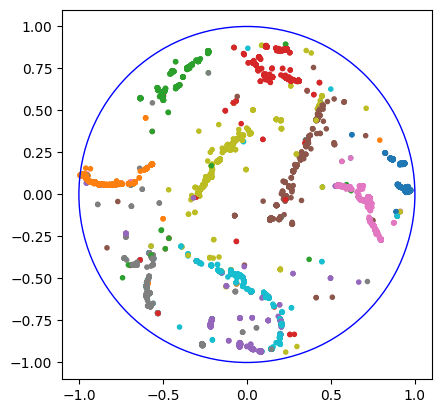

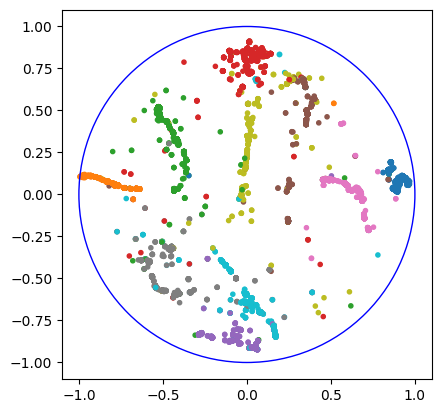

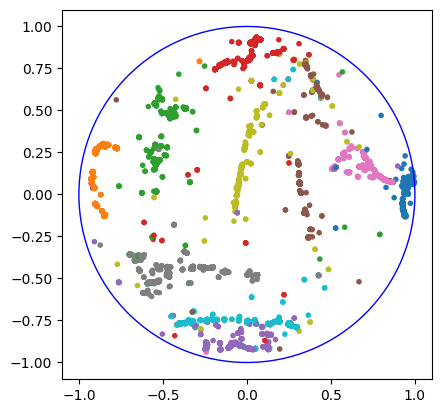

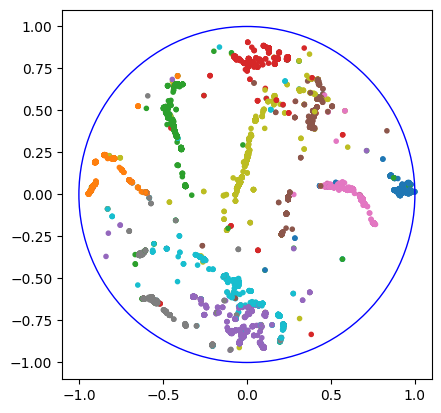

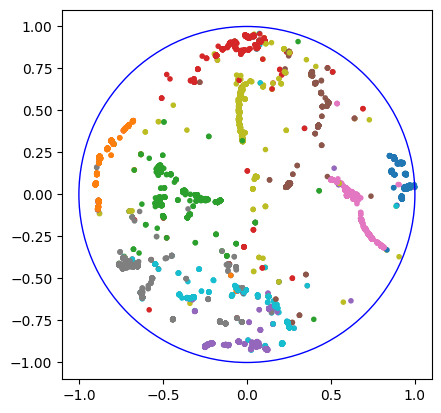

...

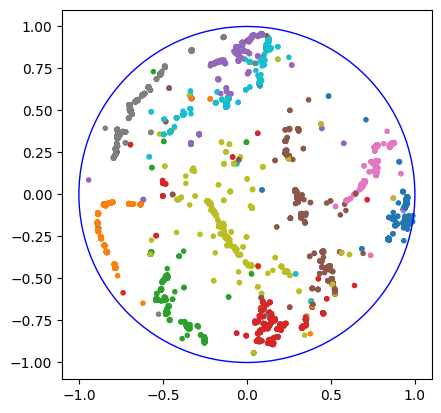

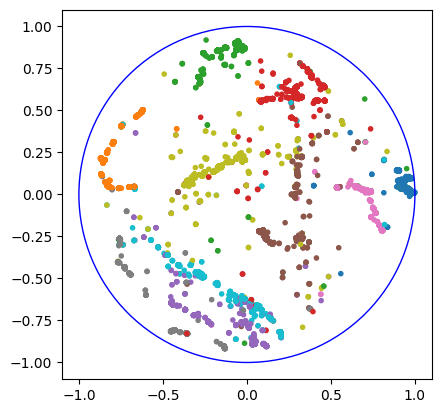

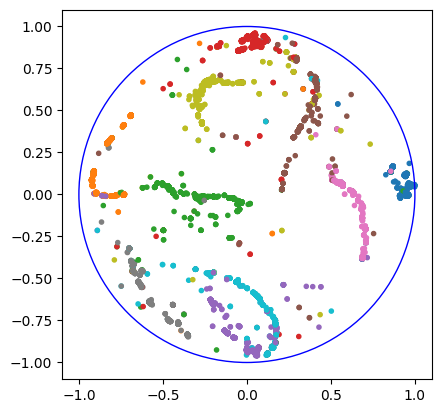

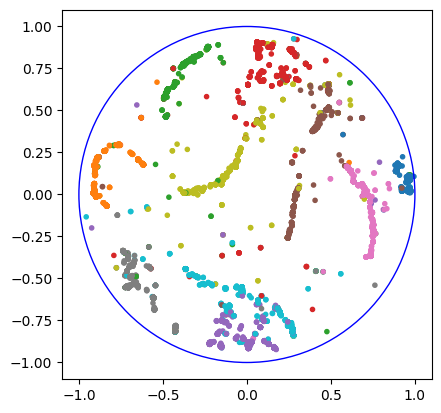

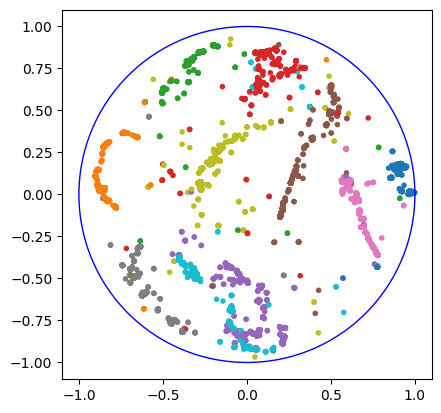

In [5]:
point_counts = [10000]#[1000, 4000, 10000, 40000]
#u_grid_ns = [24]
grid_n = 100

exact_cpu_precisions = []
exact_cpu_recalls = []
exact_cpu_runtimes = []

exact_gpu_precisions = []
exact_gpu_recalls = []
exact_gpu_runtimes = []

ugrid_gpu_precisions = []
ugrid_gpu_recalls = []
ugrid_gpu_runtimes = []

qtree_cpu_precisions = []
qtree_cpu_recalls = []
qtree_cpu_runtimes = []

for num_points in point_counts:
    if (num_points <= 4000 and False):
        p, r, t = run(num_points, True, False, 0) # Running exact CPU
        exact_cpu_precisions.append(p)
        exact_cpu_recalls.append(r)
        exact_cpu_runtimes.append(t)

    p, r, t = run_mult(5, num_points, True, True, 0) # Running exact GPU
    exact_gpu_precisions.append(p)
    exact_gpu_recalls.append(r)
    exact_gpu_runtimes.append(t)

    p, r, t = run_mult(5, num_points, False, True, grid_n) # Running approx. using uniform grid
    ugrid_gpu_precisions.append(p)
    ugrid_gpu_recalls.append(r)
    ugrid_gpu_runtimes.append(t)

    p, r, t = run_mult(5, num_points, False, False, 0) # Running approx. using quadtree
    qtree_cpu_precisions.append(p)
    qtree_cpu_recalls.append(r)
    qtree_cpu_runtimes.append(t)

#for u_grid_n in u_grid_ns:
#    p, r = run(1000, False, True, u_grid_n) # Running approx. using uniform grid
#    ugrid_gpu_precisions.append(p)
#    ugrid_gpu_recalls.append(r)

Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 129.99539 grad_norm: 2.13938e-01: 100%|██████████| 250/250 [2:49:19<00:00, 40.64s/it]  


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 6.73893 grad_norm: 5.20499e-01:  29%|██▉       | 219/750 [2:39:03<6:25:40, 43.58s/it]

4
[GPU Exact, d=Datasets.C_ELEGANS, n=89701, seed=14] Execution time: 19703.586235046387 seconds


Precision: [0.3956589112718922, 0.3743993935407632, 0.35868793733254556, 0.34495434833502414, 0.33365737282750474, 0.3241323954025039, 0.31567572904904706, 0.30792438211391177, 0.30078569667871907, 0.2940680705900715, 0.2881573226608399, 0.2827105234798572, 0.27757172761130355, 0.27266458249390435, 0.2680698468616106, 0.26370037680739344, 0.25952297731614243, 0.2556103053477665, 0.25187714271800055, 0.24819567228904915, 0.24474484278722802, 0.2413579052022324, 0.23809002177766425, 0.23485013173394576, 0.23186274400508358, 0.2289958177294996, 0.22623018778022622, 0.2235458435723761, 0.22102586793135354, 0.21853453881970844], recall: [0.013188630375729739, 0.024959959569384214, 0.03586879373325455, 0.04599391311133655, 0.055609562137917457, 0.06482647908050077, 0.0736576701114443, 0.0821131685637098, 0.09023570900361572, 0.09802269019669049, 0.1056576849756413, 0.11308420939194286, 0.12028108196489823, 0.12724347183048873, 0.1340349234308053, 0.1406402009639432, 0.1470630204791474, 0.153

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 130.00134 grad_norm: 2.14285e-01: 100%|██████████| 250/250 [09:06<00:00,  2.19s/it]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 6.77158 grad_norm: 2.55990e-01:  28%|██▊       | 209/750 [07:32<19:31,  2.17s/it]

4
[UGrid, d=Datasets.C_ELEGANS, n=89701, grid_n=100, seed=39] Execution time: 999.2805840969086 seconds


Precision: [0.4144212439103243, 0.39339026320776804, 0.3768371218455387, 0.36363028282850807, 0.3518667573382683, 0.3414621910569559, 0.33198387659318973, 0.3239902565188794, 0.3163101117416008, 0.30937559224534844, 0.3027168036030813, 0.2966958748137331, 0.29119219149430636, 0.28596830422339614, 0.2809392686071876, 0.2761173231067658, 0.27158396161889464, 0.2673623110853465, 0.2633233567190179, 0.25950602557385094, 0.255762397934726, 0.25225217920951526, 0.248831504471619, 0.24550729646269273, 0.2423272873212116, 0.23932972190516696, 0.23641753033844537, 0.2335803709785048, 0.230800871400734, 0.22816245080879813], recall: [0.013814041463677476, 0.026226017547184535, 0.03768371218455387, 0.04848403771046774, 0.058644459556378044, 0.06829243821139118, 0.07746290453841095, 0.08639740173836785, 0.09489303352248024, 0.10312519741511615, 0.11099616132112981, 0.11867834992549323, 0.1261832829808661, 0.13345187530425154, 0.1404696343035938, 0.14726257232360845, 0.15389757825070696, 0.16041738

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 129.98998 grad_norm: 2.13384e-01: 100%|██████████| 250/250 [15:10<00:00,  3.64s/it]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 6.78784 grad_norm: 5.48436e-02:  28%|██▊       | 209/750 [12:33<32:30,  3.61s/it]

4
[QTree, d=Datasets.C_ELEGANS, n=89701, seed=31] Execution time: 1663.7944524288177 seconds


Precision: [0.39962765186564253, 0.3798062451923613, 0.3631843569190979, 0.34949721853714005, 0.3377487430463429, 0.32782057427825034, 0.318980358556283, 0.31126185884215335, 0.3039901698110637, 0.29727316306395696, 0.29124839998743296, 0.28546504498277614, 0.2801469497381472, 0.2749276564841609, 0.2701359702418777, 0.26569868228893767, 0.26139717768245746, 0.25727757277572777, 0.25343260269937723, 0.24973188704696717, 0.24615800322871592, 0.24277828057050138, 0.2394660909698549, 0.2363384094566021, 0.2332963958038372, 0.23035803562776508, 0.22758324259979756, 0.22486729722713716, 0.2221937325113432, 0.21969840544326893], recall: [0.013320921728854752, 0.025320416346157417, 0.03631843569190979, 0.04659962913828534, 0.056291457174390463, 0.06556411485565007, 0.07442875032979938, 0.08300316235790757, 0.09119705094331909, 0.09909105435465232, 0.10679107999539211, 0.11418601799311047, 0.12139701155319711, 0.12829957302594178, 0.13506798512093884, 0.14170596388743345, 0.14812506735339256, 0

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 102.79215 grad_norm: 7.78705e-01: 100%|██████████| 250/250 [01:53<00:00,  2.20it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.28308 grad_norm: 1.78617e+00:  51%|█████     | 379/750 [02:58<02:54,  2.12it/s]


4
[GPU Exact, d=Datasets.MYELOID8000, n=8000, seed=33] Execution time: 292.314001083374 seconds
Precision: [0.747, 0.7353125, 0.7247083333333333, 0.71275, 0.7004499999999999, 0.6896041666666666, 0.6782142857142857, 0.667234375, 0.6540138888888889, 0.6407750000000001, 0.627590909090909, 0.6162604166666666, 0.6039711538461539, 0.5930892857142858, 0.5822416666666668, 0.5716640625, 0.5606029411764706, 0.5494583333333333, 0.539203947368421, 0.52913125, 0.5194761904761905, 0.5103011363636363, 0.5011195652173913, 0.49199999999999994, 0.48332, 0.47500480769230774, 0.46671759259259255, 0.4584955357142857, 0.4508189655172414, 0.44315000000000004], recall: [0.0249, 0.049020833333333326, 0.07247083333333333, 0.09503333333333333, 0.11674166666666667, 0.13792083333333335, 0.15825000000000003, 0.17792916666666667, 0.19620416666666668, 0.21359166666666668, 0.23011666666666666, 0.24650416666666666, 0.2617208333333333, 0.276775, 0.2911208333333334, 0.3048875, 0.31767499999999993, 0.32967499999999994, 0.

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 102.78046 grad_norm: 7.81668e-01: 100%|██████████| 250/250 [00:39<00:00,  6.40it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.26049 grad_norm: 2.73548e-01:  51%|█████     | 379/750 [00:49<00:48,  7.72it/s]


4
[UGrid, d=Datasets.MYELOID8000, n=8000, grid_n=100, seed=95] Execution time: 88.20150089263916 seconds
Precision: [0.77625, 0.764, 0.7539166666666667, 0.7405, 0.7288, 0.718, 0.705875, 0.692765625, 0.6782083333333334, 0.6649750000000001, 0.652125, 0.6390520833333334, 0.62675, 0.6146607142857142, 0.6029666666666667, 0.59203125, 0.5805294117647058, 0.5688055555555557, 0.5581842105263158, 0.54675, 0.5355892857142858, 0.5252102272727273, 0.515570652173913, 0.5056927083333334, 0.49594000000000005, 0.48623557692307695, 0.4774212962962963, 0.4684375, 0.4594870689655173, 0.4509375], recall: [0.025875, 0.050933333333333324, 0.07539166666666665, 0.09873333333333335, 0.12146666666666667, 0.14360000000000003, 0.16470416666666668, 0.1847375, 0.20346250000000002, 0.22165833333333335, 0.2391125, 0.25562083333333335, 0.2715916666666667, 0.2868416666666667, 0.3014833333333333, 0.31575, 0.32896666666666663, 0.3412833333333333, 0.35351666666666665, 0.3645, 0.37491250000000004, 0.3851541666666667, 0.3952

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 102.80479 grad_norm: 7.78970e-01: 100%|██████████| 250/250 [01:13<00:00,  3.39it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.16915 grad_norm: 1.05632e+00:  56%|█████▌    | 419/750 [01:36<01:16,  4.35it/s]


4
[QTree, d=Datasets.MYELOID8000, n=8000, seed=91] Execution time: 170.06750440597534 seconds
Precision: [0.74275, 0.73425, 0.726375, 0.716625, 0.706125, 0.6950833333333334, 0.6831607142857142, 0.671046875, 0.6575416666666667, 0.645225, 0.6328977272727273, 0.62109375, 0.60875, 0.5978839285714286, 0.5873333333333333, 0.5758671875, 0.5651544117647058, 0.5545625, 0.5443552631578947, 0.53383125, 0.5238571428571429, 0.5140852272727272, 0.505, 0.4956458333333334, 0.48689000000000004, 0.47824519230769225, 0.4699305555555555, 0.4615491071428572, 0.45371120689655176, 0.44604583333333336], recall: [0.024758333333333334, 0.04895, 0.07263750000000001, 0.09555, 0.1176875, 0.13901666666666665, 0.1594041666666667, 0.17894583333333333, 0.19726249999999998, 0.21507500000000002, 0.2320625, 0.2484375, 0.2637916666666667, 0.2790125, 0.29366666666666663, 0.3071291666666666, 0.3202541666666667, 0.33273749999999996, 0.34475833333333333, 0.35588749999999997, 0.36669999999999997, 0.3769958333333333, 0.38716666

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 110.67444 grad_norm: 6.05069e-01: 100%|██████████| 250/250 [14:03<00:00,  3.37s/it]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 5.41779 grad_norm: 8.68457e-01:  35%|███▍      | 259/750 [14:46<28:01,  3.42s/it]


4
[GPU Exact, d=Datasets.PLANARIA, n=21612, seed=97] Execution time: 1730.5009994506836 seconds
Precision: [0.30529335554321674, 0.2698732185822691, 0.24609784687519276, 0.22917823431426984, 0.21791597260781048, 0.20935128632241348, 0.2013299489701488, 0.19548746066999814, 0.19069652662101305, 0.18622987229317048, 0.182617401107129, 0.17907489666234808, 0.1758531585016871, 0.17274133417942414, 0.17042383860818067, 0.16793621599111605, 0.16564327007871443, 0.16371306064532049, 0.16177172525984587, 0.16023968165833796, 0.15850100913954326, 0.15692460417613108, 0.15522173671631703, 0.15361450428774137, 0.15210623727558764, 0.15057873830777774, 0.1491832383929367, 0.14777669813066815, 0.14647832940831085, 0.14522641742241965], recall: [0.010176445184773892, 0.017991547905484608, 0.02460978468751928, 0.030557097908569312, 0.03631932876796841, 0.041870257264482694, 0.04697698809303473, 0.0521299895119995, 0.05720895798630391, 0.06207662409772349, 0.06695971373928064, 0.07162995866493922, 0.0

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 110.67886 grad_norm: 6.03748e-01: 100%|██████████| 250/250 [01:55<00:00,  2.16it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 5.36076 grad_norm: 9.44220e+00:  36%|███▌      | 269/750 [01:58<03:31,  2.27it/s]


4
[UGrid, d=Datasets.PLANARIA, n=21612, grid_n=100, seed=47] Execution time: 234.13350009918213 seconds
Precision: [0.31797149731630575, 0.28352304275402557, 0.2603800357825899, 0.2442046085508051, 0.2319174532667037, 0.22269263989141833, 0.21523095634700293, 0.208154034795484, 0.20274230365846135, 0.19802887284841755, 0.1940504433563845, 0.19056157073230923, 0.18751690656188158, 0.18437838766822662, 0.18137454500586095, 0.17868256061447343, 0.17624740068153855, 0.17419334937380468, 0.17199752574106003, 0.16994725152692952, 0.1681274953068401, 0.16625443777026228, 0.1645261489188776, 0.16288597384169287, 0.1611974828798816, 0.15969226498099345, 0.15822142705355735, 0.15667056661643003, 0.15510699675148543, 0.15359368252205566], recall: [0.010599049910543525, 0.018901536183601703, 0.026038003578258993, 0.032560614473440684, 0.03865290887778394, 0.044538527978283664, 0.050220556480967356, 0.05550774261212906, 0.06082269109753839, 0.06600962428280585, 0.07115182923067431, 0.07622462829292

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 110.67371 grad_norm: 6.02633e-01: 100%|██████████| 250/250 [04:11<00:00,  1.01s/it]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 5.31210 grad_norm: 1.85672e-01:  39%|███▊      | 289/750 [03:35<05:44,  1.34it/s]


4
[QTree, d=Datasets.PLANARIA, n=21612, seed=86] Execution time: 467.3595414161682 seconds
Precision: [0.31066074403109384, 0.2740375717194151, 0.2523598001110494, 0.23541319637238572, 0.22287617990005554, 0.21298352766981307, 0.20552074244467358, 0.19965759763094576, 0.19396631501017952, 0.18975569128262076, 0.18559975098009523, 0.18204392621383186, 0.17923091160181667, 0.17635705031596205, 0.17386328582886054, 0.17147013233388858, 0.16928503772414016, 0.16725276081189464, 0.16515434894843994, 0.16346011475106423, 0.1616760529864361, 0.1599595342654754, 0.15829370156676242, 0.156660651489913, 0.1550601517675366, 0.1536575122083173, 0.15227822677387734, 0.1508883953359245, 0.14962472955637673, 0.14835739404034795], recall: [0.010355358134369793, 0.018269171447961006, 0.02523598001110494, 0.031388426182984756, 0.03714602998334258, 0.042596705533962616, 0.047954839903757165, 0.053242026034918864, 0.058189894503053854, 0.06325189709420692, 0.06805324202603492, 0.07281757048553272, 0.07766

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 127.92390 grad_norm: 2.78268e-01: 100%|██████████| 250/250 [1:51:20<00:00, 26.72s/it]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 6.39503 grad_norm: 1.00540e-01:  37%|███▋      | 279/750 [2:09:10<3:38:04, 27.78s/it]

4
[GPU Exact, d=Datasets.MNIST, n=70000, seed=45] Execution time: 14431.413712024689 seconds


Precision: [0.3682714285714286, 0.34730714285714287, 0.33009047619047616, 0.3157964285714286, 0.3039057142857143, 0.29265, 0.28362857142857145, 0.2753964285714286, 0.2682619047619048, 0.2615428571428572, 0.2553922077922078, 0.24973214285714285, 0.24439340659340658, 0.2391612244897959, 0.23443047619047622, 0.22990714285714287, 0.22567310924369746, 0.22162777777777776, 0.21782556390977445, 0.21424285714285718, 0.21087006802721087, 0.2076175324675324, 0.20458136645962732, 0.20167202380952381, 0.19891314285714287, 0.19614065934065938, 0.19356137566137563, 0.19098928571428572, 0.1884758620689655, 0.18619333333333332], recall: [0.012275714285714286, 0.023153809523809528, 0.03300904761904762, 0.04210619047619048, 0.05065095238095237, 0.05852999999999999, 0.06617999999999999, 0.07343904761904763, 0.08047857142857143, 0.08718095238095237, 0.09364380952380952, 0.09989285714285714, 0.10590380952380953, 0.11160857142857142, 0.11721523809523811, 0.12261714285714287, 0.12788142857142856, 0.132976666

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 127.92384 grad_norm: 2.77751e-01: 100%|██████████| 250/250 [05:38<00:00,  1.35s/it]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 6.41763 grad_norm: 3.33763e-01:  36%|███▌      | 269/750 [04:30<08:03,  1.01s/it]

4
[UGrid, d=Datasets.MNIST, n=70000, grid_n=100, seed=44] Execution time: 608.6817154884338 seconds


Precision: [0.4056, 0.3811285714285714, 0.3616761904761905, 0.34530357142857143, 0.3313571428571429, 0.31922380952380947, 0.30813673469387753, 0.2987214285714286, 0.2899333333333334, 0.28229571428571426, 0.2750532467532467, 0.2685642857142857, 0.26251648351648355, 0.2566714285714285, 0.25137142857142863, 0.24622678571428572, 0.24143361344537811, 0.23697460317460317, 0.23268872180451128, 0.2287485714285714, 0.22490952380952384, 0.22119610389610386, 0.21772484472049689, 0.2143845238095238, 0.2112428571428572, 0.20819120879120878, 0.20519100529100526, 0.20241989795918364, 0.19971871921182263, 0.19709333333333331], recall: [0.013519999999999999, 0.025408571428571426, 0.036167619047619046, 0.04604047619047619, 0.05522619047619047, 0.06384476190476189, 0.07189857142857142, 0.07965904761904762, 0.08697999999999999, 0.09409857142857142, 0.10085285714285715, 0.10742571428571428, 0.11375714285714285, 0.11978000000000001, 0.12568571428571432, 0.13132095238095243, 0.13681238095238096, 0.1421847619

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 127.91891 grad_norm: 2.78228e-01: 100%|██████████| 250/250 [11:43<00:00,  2.81s/it]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 6.36297 grad_norm: 8.33354e-02:  39%|███▊      | 289/750 [13:04<20:50,  2.71s/it]


4
[QTree, d=Datasets.MNIST, n=70000, seed=67] Execution time: 1487.8173441886902 seconds
Precision: [0.37765714285714286, 0.35573571428571427, 0.3386619047619048, 0.32309642857142856, 0.3106314285714286, 0.2996880952380952, 0.28984081632653064, 0.2810875, 0.2732857142857143, 0.2661042857142857, 0.25972077922077913, 0.2534535714285714, 0.24793516483516484, 0.24245510204081636, 0.23762190476190476, 0.23305892857142857, 0.22873445378151258, 0.2247515873015873, 0.22092556390977444, 0.2173535714285714, 0.2138959183673469, 0.2106077922077922, 0.2074726708074534, 0.20438511904761902, 0.20142971428571432, 0.19861428571428572, 0.19597037037037035, 0.1934852040816326, 0.1910039408866995, 0.18867857142857142], recall: [0.01258857142857143, 0.023715714285714288, 0.03386619047619047, 0.04307952380952381, 0.05177190476190475, 0.059937619047619045, 0.06762952380952379, 0.07495666666666666, 0.08198571428571429, 0.08870142857142857, 0.09523095238095239, 0.10138142857142857, 0.10743857142857144, 0.11314

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


[[0.3956589112718922, 0.3743993935407632, 0.35868793733254556, 0.34495434833502414, 0.33365737282750474, 0.3241323954025039, 0.31567572904904706, 0.30792438211391177, 0.30078569667871907, 0.2940680705900715, 0.2881573226608399, 0.2827105234798572, 0.27757172761130355, 0.27266458249390435, 0.2680698468616106, 0.26370037680739344, 0.25952297731614243, 0.2556103053477665, 0.25187714271800055, 0.24819567228904915, 0.24474484278722802, 0.2413579052022324, 0.23809002177766425, 0.23485013173394576, 0.23186274400508358, 0.2289958177294996, 0.22623018778022622, 0.2235458435723761, 0.22102586793135354, 0.21853453881970844], [0.747, 0.7353125, 0.7247083333333333, 0.71275, 0.7004499999999999, 0.6896041666666666, 0.6782142857142857, 0.667234375, 0.6540138888888889, 0.6407750000000001, 0.627590909090909, 0.6162604166666666, 0.6039711538461539, 0.5930892857142858, 0.5822416666666668, 0.5716640625, 0.5606029411764706, 0.5494583333333333, 0.539203947368421, 0.52913125, 0.5194761904761905, 0.51030113636

Gradient Descent error: 130.00264 grad_norm: 2.14374e-01: 100%|██████████| 250/250 [11:43<00:00,  2.82s/it]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 6.78412 grad_norm: 1.24898e-01:  28%|██▊       | 209/750 [09:10<23:45,  2.63s/it]

4
[UGrid, d=Datasets.C_ELEGANS, n=89701, grid_n=140, seed=18] Execution time: 1254.771047115326 seconds


Precision: [0.41206898473818576, 0.39084291145026256, 0.37449972687038047, 0.36014927369817507, 0.34880993522926174, 0.3384596232669275, 0.32968576556719387, 0.3215376640171236, 0.31407676614530494, 0.3072998071370442, 0.30087533229081254, 0.29494747364392077, 0.2895431231793145, 0.28424113762069864, 0.2792231970658075, 0.2746471611241792, 0.2700225651625629, 0.26592172266133535, 0.262036039027905, 0.25817214969732777, 0.2544479782303218, 0.2509817971016843, 0.24754122754678223, 0.2442480202747647, 0.24107958662668202, 0.2380635495873899, 0.23515778964436168, 0.23233297287655655, 0.22955766071880945, 0.22695696443369268], recall: [0.01373563282460619, 0.026056194096684162, 0.03744997268703805, 0.04801990315975666, 0.05813498920487693, 0.06769192465338553, 0.07692667863234523, 0.08574337707123296, 0.0942230298435915, 0.1024332690456814, 0.11032095517329796, 0.1179789894575683, 0.12546868671103628, 0.13264586422299268, 0.13961159853290375, 0.14647848593289559, 0.15301278692545237, 0.1595

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 130.00383 grad_norm: 2.14529e-01: 100%|██████████| 250/250 [05:50<00:00,  1.40s/it]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 6.77787 grad_norm: 4.03452e-01:  28%|██▊       | 209/750 [05:17<13:42,  1.52s/it]

4
[UGrid, d=Datasets.C_ELEGANS, n=89701, grid_n=70, seed=61] Execution time: 668.1979510784149 seconds


Precision: [0.40593750348379615, 0.3853357264690472, 0.36858377647220575, 0.3553444220242807, 0.3431489058092998, 0.3333259012348432, 0.32452417316577137, 0.3167606827125673, 0.3093610996532926, 0.30264211101325517, 0.29637756141362565, 0.2903395725800158, 0.2848025877423543, 0.279684730382047, 0.27486278488162524, 0.2703119251736324, 0.2659600489731572, 0.26194864667679907, 0.2582139845885658, 0.2544202405770281, 0.25082005243876354, 0.24736827703349817, 0.2440688218782884, 0.2407944170076142, 0.23773469638019648, 0.2348417348919016, 0.2319673549202763, 0.22922502854722113, 0.22655765572136397, 0.22400084725922786], recall: [0.013531250116126535, 0.025689048431269807, 0.03685837764722058, 0.04737925626990409, 0.05719148430154995, 0.06666518024696863, 0.07572230707201331, 0.08446951539001796, 0.09280832989598778, 0.10088070367108508, 0.10867177251832942, 0.11613582903200635, 0.12341445468835352, 0.1305195408449553, 0.13743139244081262, 0.14416636009260397, 0.15071069441812243, 0.157169

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 102.77467 grad_norm: 7.82742e-01: 100%|██████████| 250/250 [00:43<00:00,  5.70it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.19052 grad_norm: 4.80302e+02:  53%|█████▎    | 399/750 [00:53<00:46,  7.48it/s]


4
[UGrid, d=Datasets.MYELOID8000, n=8000, grid_n=140, seed=46] Execution time: 97.25099992752075 seconds
Precision: [0.794375, 0.7871875, 0.776375, 0.7658125, 0.7522000000000001, 0.7403958333333334, 0.727, 0.712609375, 0.6989444444444444, 0.6861499999999999, 0.6724318181818183, 0.6581354166666666, 0.6445865384615386, 0.6313482142857143, 0.6182166666666667, 0.605265625, 0.5914926470588234, 0.5789305555555556, 0.5664473684210526, 0.55469375, 0.543047619047619, 0.5318181818181817, 0.520804347826087, 0.510703125, 0.500495, 0.49100480769230775, 0.48147685185185185, 0.47228571428571425, 0.4633836206896552, 0.4545916666666666], recall: [0.026479166666666665, 0.05247916666666666, 0.0776375, 0.10210833333333331, 0.12536666666666668, 0.14807916666666668, 0.16963333333333333, 0.19002916666666667, 0.20968333333333333, 0.22871666666666665, 0.24655833333333332, 0.2632541666666667, 0.27932083333333335, 0.29462916666666666, 0.3091083333333334, 0.32280833333333336, 0.3351791666666667, 0.347358333333333

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 102.77773 grad_norm: 7.81391e-01: 100%|██████████| 250/250 [00:34<00:00,  7.23it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.20399 grad_norm: 1.21173e+02:  53%|█████▎    | 399/750 [00:53<00:47,  7.45it/s]


4
[UGrid, d=Datasets.MYELOID8000, n=8000, grid_n=70, seed=60] Execution time: 88.14549970626831 seconds
Precision: [0.7795, 0.7695625, 0.758625, 0.74846875, 0.73685, 0.725, 0.7112678571428571, 0.699375, 0.6869861111111112, 0.6732250000000001, 0.6595227272727272, 0.6460625, 0.6328365384615384, 0.6197857142857143, 0.60745, 0.59453125, 0.5820882352941176, 0.5703055555555555, 0.5589736842105264, 0.5478, 0.5361904761904761, 0.5249545454545455, 0.5140434782608695, 0.5043541666666667, 0.49485500000000004, 0.48527403846153844, 0.476, 0.4669866071428571, 0.4584267241379311, 0.44992083333333327], recall: [0.02598333333333333, 0.05130416666666666, 0.07586250000000001, 0.09979583333333335, 0.12280833333333334, 0.145, 0.1659625, 0.1865, 0.20609583333333334, 0.22440833333333332, 0.24182499999999998, 0.258425, 0.27422916666666663, 0.28923333333333334, 0.303725, 0.3170833333333334, 0.32985000000000003, 0.3421833333333333, 0.35401666666666665, 0.36519999999999997, 0.37533333333333335, 0.384966666666666

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 110.67249 grad_norm: 6.03771e-01: 100%|██████████| 250/250 [02:12<00:00,  1.89it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 5.32191 grad_norm: 1.91992e-01:  37%|███▋      | 279/750 [02:16<03:51,  2.04it/s]


4
[UGrid, d=Datasets.PLANARIA, n=21612, grid_n=140, seed=60] Execution time: 269.4565010070801 seconds
Precision: [0.32375532111789745, 0.2873866370534888, 0.26244678882102535, 0.24584721451045716, 0.23420322043309275, 0.22497532235177986, 0.2171346606382697, 0.21061794373496207, 0.20545170378596256, 0.20085137886359436, 0.1971926370871401, 0.1935614473440681, 0.19016856732014978, 0.18717114830385234, 0.18425257572953296, 0.18193306959096797, 0.1797176949624936, 0.177481131881465, 0.17536310237002833, 0.17357255228576718, 0.17171897446744755, 0.1698908855349721, 0.16827004321270791, 0.16664931519526188, 0.1650453451786045, 0.16347755520437365, 0.16190936448200932, 0.16042013696094762, 0.15884534134931425, 0.15748349682275278], recall: [0.01079184403726325, 0.01915910913689925, 0.026244678882102534, 0.03277962860139429, 0.03903387007218212, 0.04499506447035597, 0.05066475414892961, 0.056164784995989876, 0.06163551113578876, 0.0669504596211981, 0.07230396693195137, 0.07742457893762725, 0

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 110.68664 grad_norm: 6.02308e-01: 100%|██████████| 250/250 [01:27<00:00,  2.87it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 5.38322 grad_norm: 1.41822e+01:  35%|███▍      | 259/750 [01:29<02:49,  2.89it/s]


4
[UGrid, d=Datasets.PLANARIA, n=21612, grid_n=70, seed=76] Execution time: 176.7454981803894 seconds
Precision: [0.3181565796779567, 0.27820192485656114, 0.2556141649700783, 0.23824727003516566, 0.22661484360540443, 0.2169396631501018, 0.20933476111155178, 0.20338816398297244, 0.19809982108705043, 0.19366555617249676, 0.18933504955159589, 0.18579569991979766, 0.18272612081607084, 0.1798471748499511, 0.17686470479363317, 0.17429842217286692, 0.17221097211788655, 0.17004699035515247, 0.1680767020271389, 0.16623635017582825, 0.16456025312216316, 0.16292926488651086, 0.16131336053239345, 0.15961425751125916, 0.15803072367203408, 0.1563856974045758, 0.15481282689315265, 0.15342832024536632, 0.1519956984306292, 0.1506215682645444], recall: [0.010605219322598556, 0.01854679499043741, 0.025561416497007838, 0.03176630267135542, 0.03776914060090073, 0.04338793263002036, 0.04884477759269542, 0.05423684372879264, 0.05942994632611511, 0.06455518539083224, 0.06942285150225184, 0.07431827996791905, 

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 127.92182 grad_norm: 2.78444e-01: 100%|██████████| 250/250 [07:43<00:00,  1.86s/it]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 6.37747 grad_norm: 3.41853e-01:  37%|███▋      | 279/750 [05:59<10:07,  1.29s/it]

4
[UGrid, d=Datasets.MNIST, n=70000, grid_n=140, seed=15] Execution time: 823.8975665569305 seconds


Precision: [0.40055714285714283, 0.37661428571428573, 0.35731428571428564, 0.3416, 0.32813428571428577, 0.31723095238095234, 0.3069081632653061, 0.29778035714285717, 0.2895873015873016, 0.28156857142857145, 0.2746077922077922, 0.26830952380952383, 0.2623868131868132, 0.2568326530612245, 0.2516590476190476, 0.24664642857142857, 0.2421378151260504, 0.2378690476190476, 0.23378195488721804, 0.22979357142857143, 0.22595238095238093, 0.22234740259740254, 0.2189298136645963, 0.21562261904761906, 0.21253028571428578, 0.20952142857142858, 0.20667037037037034, 0.2038198979591837, 0.2010847290640394, 0.1985847619047619], recall: [0.013351904761904761, 0.025107619047619045, 0.03573142857142857, 0.045546666666666666, 0.05468904761904761, 0.06344619047619046, 0.07161190476190477, 0.07940809523809524, 0.08687619047619048, 0.0938561904761905, 0.10068952380952383, 0.10732380952380953, 0.1137009523809524, 0.11985523809523813, 0.1258295238095238, 0.1315447619047619, 0.1372114285714286, 0.1427214285714285

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 127.92064 grad_norm: 2.77885e-01: 100%|██████████| 250/250 [04:03<00:00,  1.03it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 6.45870 grad_norm: 1.65795e-01:  35%|███▍      | 259/750 [03:35<06:48,  1.20it/s]

4
[UGrid, d=Datasets.MNIST, n=70000, grid_n=70, seed=84] Execution time: 458.48613452911377 seconds


Precision: [0.39358571428571426, 0.36970714285714285, 0.35096190476190475, 0.335025, 0.32143714285714287, 0.3094, 0.2985857142857143, 0.2890392857142857, 0.2804222222222222, 0.2727028571428571, 0.26548051948051943, 0.2589619047619047, 0.2528109890109891, 0.24735612244897962, 0.2420704761904762, 0.23719732142857142, 0.23256722689075632, 0.2283420634920635, 0.22419022556390975, 0.22019714285714287, 0.21652244897959183, 0.21294220779220774, 0.20959254658385093, 0.20632916666666665, 0.2031902857142857, 0.20024725274725277, 0.19752328042328043, 0.19484132653061226, 0.19228866995073893, 0.18973714285714285], recall: [0.013119523809523808, 0.024647142857142854, 0.035096190476190475, 0.04467000000000001, 0.053572857142857144, 0.061880000000000004, 0.06967, 0.07707714285714287, 0.08412666666666667, 0.09090095238095239, 0.09734285714285715, 0.10358476190476192, 0.10955142857142856, 0.11543285714285714, 0.1210352380952381, 0.1265052380952381, 0.13178809523809526, 0.1370052380952381, 0.14198714285

C:\Users\Milan\AppData\Local\Temp\ipykernel_6812\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


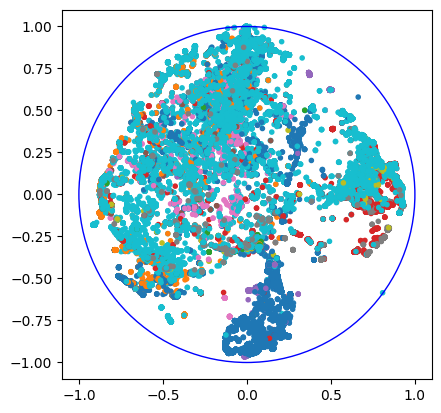

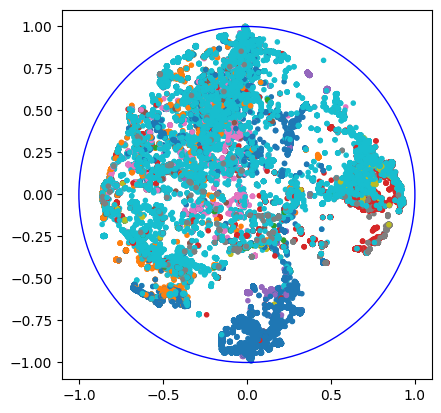

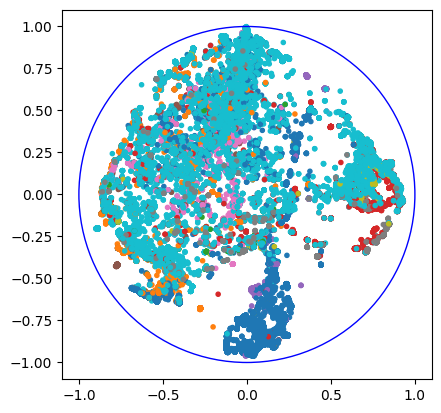

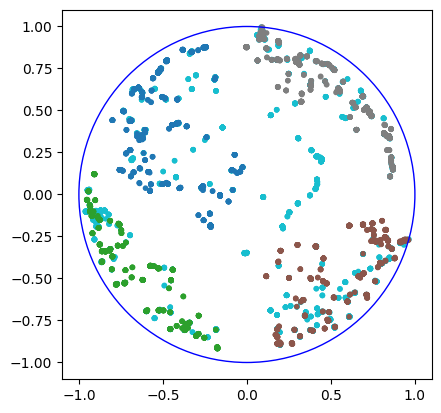

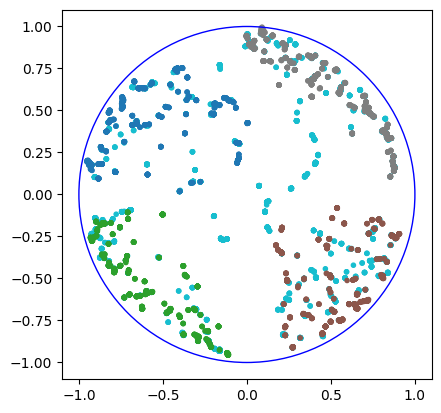

...

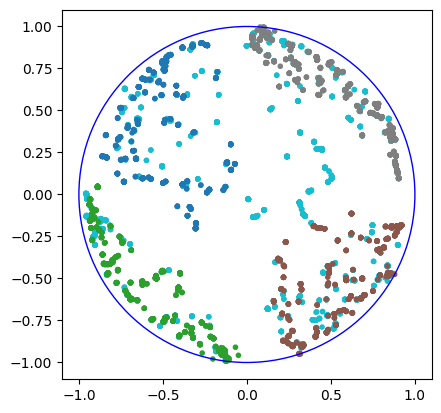

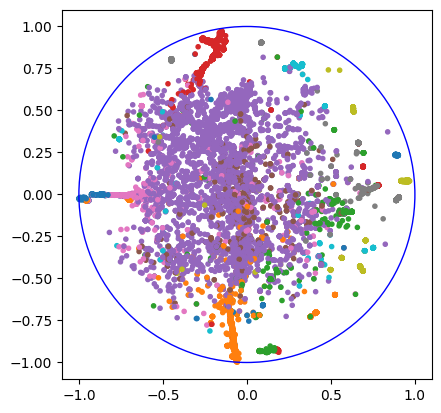

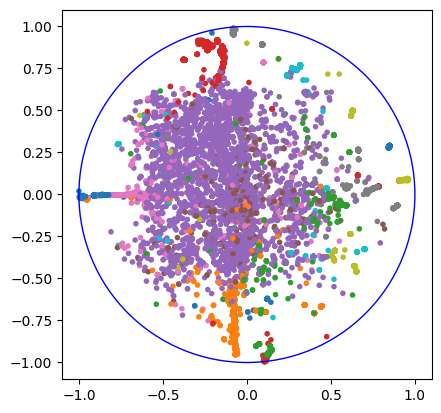

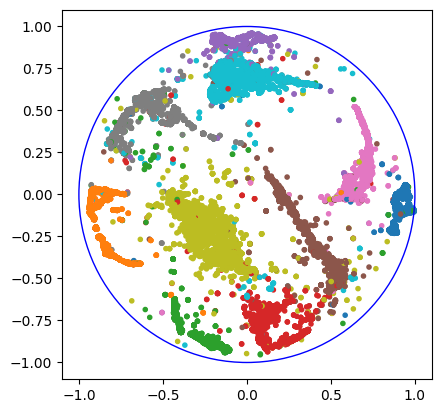

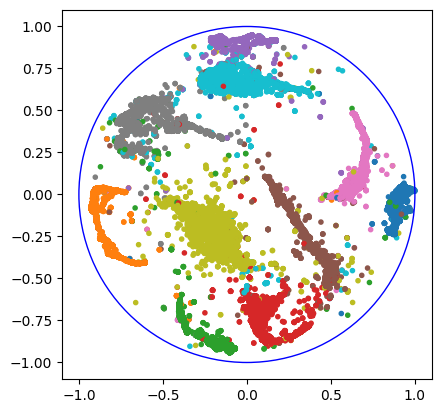

In [4]:
# DIFFERENT DATASETS TEST
datasets = [Datasets.C_ELEGANS, Datasets.MYELOID8000, Datasets.PLANARIA, Datasets.MNIST]
#u_grid_ns = [24]
grid_n = 100
num_points = 0 # Use all points

exact_cpu_precisions = []
exact_cpu_recalls = []
exact_cpu_runtimes = []

exact_gpu_precisions = []
exact_gpu_recalls = []
exact_gpu_runtimes = []

ugrid_gpu_precisions = []
ugrid_gpu_recalls = []
ugrid_gpu_runtimes = []

ugrid_gpu_n140_precisions = []
ugrid_gpu_n140_recalls = []
ugrid_gpu_n140_runtimes = []

ugrid_gpu_n70_precisions = []
ugrid_gpu_n70_recalls = []
ugrid_gpu_n70_runtimes = []

qtree_cpu_precisions = []
qtree_cpu_recalls = []
qtree_cpu_runtimes = []

for ds in datasets:
    # Setting the globally using dataset
    dataset = ds

    p, r, t = run(num_points, True, True, 0) # Running exact GPU
    exact_gpu_precisions.append(p)
    exact_gpu_recalls.append(r)
    exact_gpu_runtimes.append(t)

    p, r, t = run(num_points, False, True, grid_n) # Running approx. using uniform grid
    ugrid_gpu_precisions.append(p)
    ugrid_gpu_recalls.append(r)
    ugrid_gpu_runtimes.append(t)

    p, r, t = run(num_points, False, False, 0) # Running approx. using quadtree
    qtree_cpu_precisions.append(p)
    qtree_cpu_recalls.append(r)
    qtree_cpu_runtimes.append(t)
    
print(exact_gpu_precisions)
print(exact_gpu_recalls)
print(exact_gpu_runtimes)
      
print(ugrid_gpu_precisions)
print(ugrid_gpu_recalls)
print(ugrid_gpu_runtimes)
      
print(qtree_cpu_precisions)
print(qtree_cpu_recalls)
print(qtree_cpu_runtimes)

for ds in datasets:
    # Setting the globally using dataset
    dataset = ds

    p, r, t = run(num_points, False, True, 140) # Running approx. using uniform grid
    ugrid_gpu_n140_precisions.append(p)
    ugrid_gpu_n140_recalls.append(r)
    ugrid_gpu_n140_runtimes.append(t)

    p, r, t = run(num_points, False, True, 70) # Running approx. using uniform grid
    ugrid_gpu_n70_precisions.append(p)
    ugrid_gpu_n70_recalls.append(r)
    ugrid_gpu_n70_runtimes.append(t)

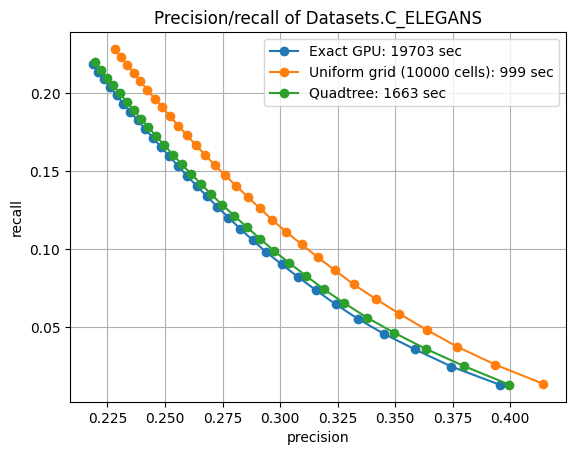

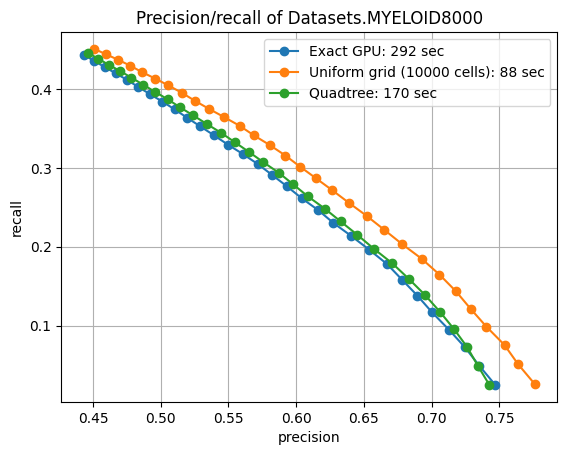

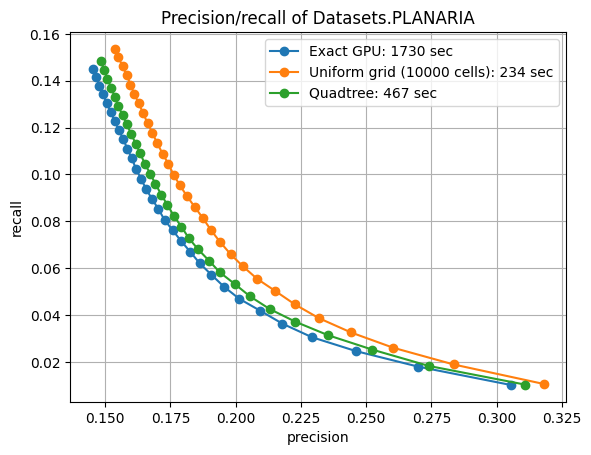

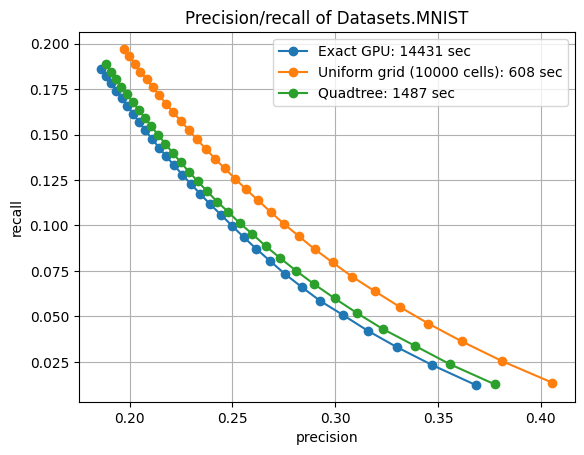

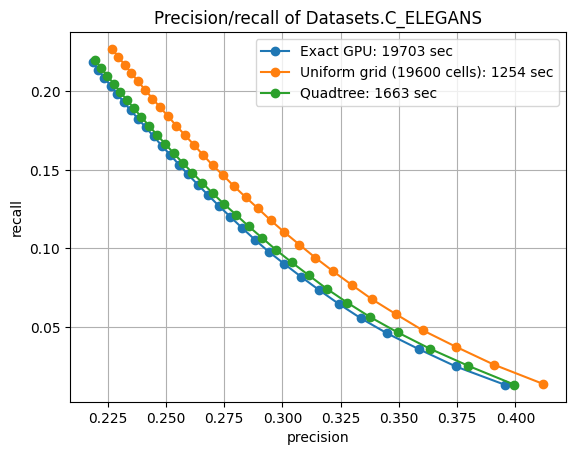

...

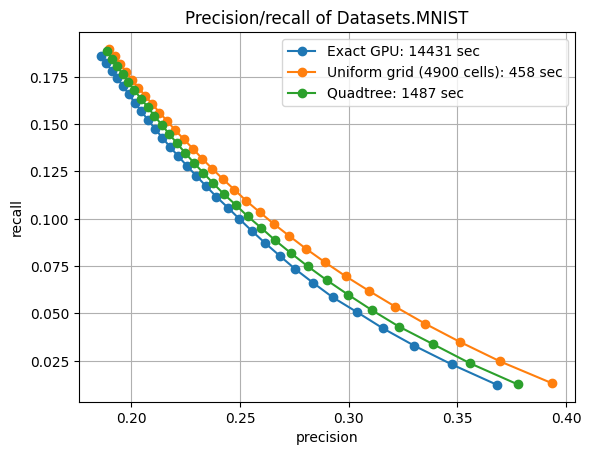

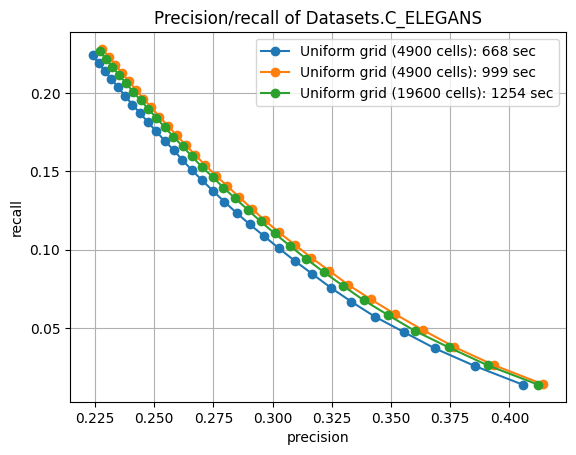

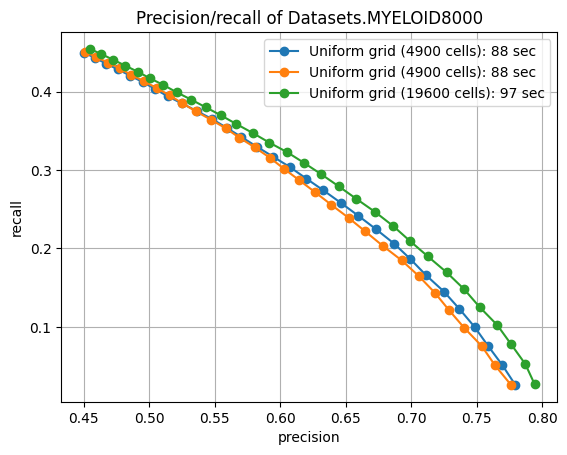

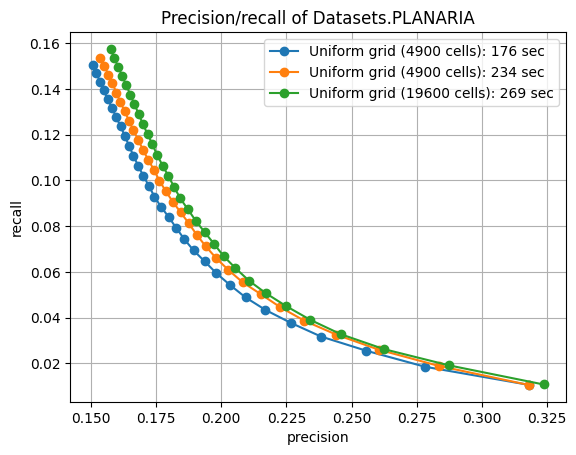

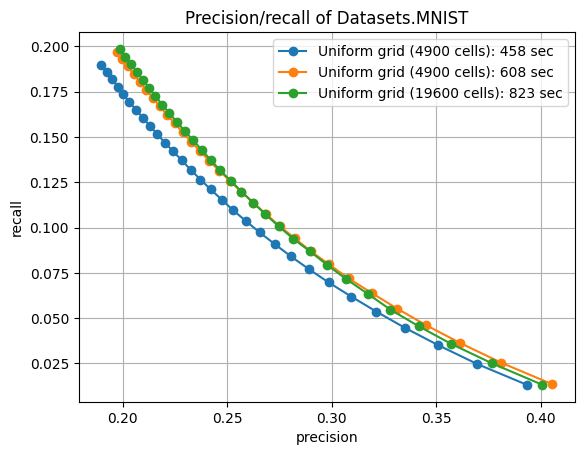

In [9]:
# DIFFERENT DATASETS TEST RESULTS

for i in range(len(datasets)):
    data = [exact_gpu_recalls[i], ugrid_gpu_recalls[i], qtree_cpu_recalls[i]]
    x_axis = [exact_gpu_precisions[i], ugrid_gpu_precisions[i], qtree_cpu_precisions[i]]
    labels = [f"Exact GPU: {int(exact_gpu_runtimes[i])} sec", f"Uniform grid ({grid_n*grid_n} cells): {int(ugrid_gpu_runtimes[i])} sec", f"Quadtree: {int(qtree_cpu_runtimes[i])} sec"]
    plot_points_separate(data, labels, f"Precision/recall of {datasets[i]}", "precision", "recall", x_axis)

for i in range(len(datasets)):
    data = [exact_gpu_recalls[i], ugrid_gpu_n140_recalls[i], qtree_cpu_recalls[i]]
    x_axis = [exact_gpu_precisions[i], ugrid_gpu_n140_precisions[i], qtree_cpu_precisions[i]]
    labels = [f"Exact GPU: {int(exact_gpu_runtimes[i])} sec", f"Uniform grid ({140*140} cells): {int(ugrid_gpu_n140_runtimes[i])} sec", f"Quadtree: {int(qtree_cpu_runtimes[i])} sec"]
    plot_points_separate(data, labels, f"Precision/recall of {datasets[i]}", "precision", "recall", x_axis)
    
for i in range(len(datasets)):
    data = [exact_gpu_recalls[i], ugrid_gpu_n70_recalls[i], qtree_cpu_recalls[i]]
    x_axis = [exact_gpu_precisions[i], ugrid_gpu_n70_precisions[i], qtree_cpu_precisions[i]]
    labels = [f"Exact GPU: {int(exact_gpu_runtimes[i])} sec", f"Uniform grid ({70*70} cells): {int(ugrid_gpu_n70_runtimes[i])} sec", f"Quadtree: {int(qtree_cpu_runtimes[i])} sec"]
    plot_points_separate(data, labels, f"Precision/recall of {datasets[i]}", "precision", "recall", x_axis)

for i in range(len(datasets)):
    data = [ugrid_gpu_n70_recalls[i], ugrid_gpu_recalls[i], ugrid_gpu_n140_recalls[i]]
    x_axis = [ugrid_gpu_n70_precisions[i], ugrid_gpu_precisions[i], ugrid_gpu_n140_precisions[i]]
    labels = [f"Uniform grid ({70*70} cells): {int(ugrid_gpu_n70_runtimes[i])} sec", f"Uniform grid ({100*100} cells): {int(ugrid_gpu_runtimes[i])} sec", f"Uniform grid ({140*140} cells): {int(ugrid_gpu_n140_runtimes[i])} sec"]
    plot_points_separate(data, labels, f"Precision/recall of {datasets[i]}", "precision", "recall", x_axis)

Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 78.09456 grad_norm: 2.21123e+00: 100%|██████████| 250/250 [00:09<00:00, 27.61it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 2.49646 grad_norm: 2.36636e+03:  64%|██████▍   | 479/750 [00:11<00:06, 42.39it/s]


4
[UGrid, n=1000, grid_n=100, seed=72] Execution time: 20.366252183914185 seconds
Precision: [0.87, 0.857, 0.8313333333333333, 0.807, 0.7824000000000001, 0.7656666666666667, 0.7492857142857142, 0.726375, 0.7095555555555555, 0.6975, 0.6836363636363636, 0.66625, 0.653, 0.6353571428571428, 0.621, 0.607375, 0.596764705882353, 0.5855555555555555, 0.5734736842105264, 0.5622999999999999, 0.5514761904761905, 0.5401363636363635, 0.5299565217391303, 0.5198333333333334, 0.5105200000000001, 0.5022307692307693, 0.4939259259259259, 0.48557142857142854, 0.4774137931034483, 0.47023333333333334], recall: [0.029, 0.05713333333333333, 0.08313333333333334, 0.1076, 0.13040000000000002, 0.15313333333333332, 0.17483333333333334, 0.1937, 0.21286666666666668, 0.2325, 0.25066666666666665, 0.2665, 0.2829666666666667, 0.2965, 0.3105, 0.32393333333333335, 0.3381666666666666, 0.35133333333333333, 0.3632, 0.3748666666666667, 0.3860333333333333, 0.39609999999999995, 0.40629999999999994, 0.41586666666666666, 0.4254333

C:\Users\Milan\AppData\Local\Temp\ipykernel_14316\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 77.92649 grad_norm: 2.18116e+00: 100%|██████████| 250/250 [00:08<00:00, 27.88it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 2.34481 grad_norm: 1.06194e+01:  79%|███████▊  | 589/750 [00:19<00:05, 30.02it/s]


4
[QTree, n=1000, seed=87] Execution time: 28.601064682006836 seconds
Precision: [0.839, 0.8165, 0.801, 0.7845, 0.7678, 0.7475, 0.7292857142857142, 0.716875, 0.7008888888888889, 0.6886000000000001, 0.6738181818181818, 0.6569166666666666, 0.6434615384615384, 0.6319285714285714, 0.62, 0.6066875, 0.5962352941176471, 0.5867222222222221, 0.5754736842105262, 0.56335, 0.5524285714285715, 0.541090909090909, 0.5300869565217391, 0.5215416666666667, 0.51232, 0.5012692307692308, 0.49214814814814817, 0.48325, 0.47558620689655173, 0.4678333333333334], recall: [0.027966666666666664, 0.05443333333333332, 0.08009999999999999, 0.10460000000000001, 0.12796666666666667, 0.1495, 0.1701666666666667, 0.19116666666666668, 0.21026666666666666, 0.22953333333333334, 0.24706666666666666, 0.26276666666666665, 0.2788333333333333, 0.2949, 0.31, 0.32356666666666667, 0.33786666666666665, 0.3520333333333333, 0.36446666666666666, 0.3755666666666667, 0.3867, 0.39679999999999993, 0.4064, 0.41723333333333334, 0.42693333333

C:\Users\Milan\AppData\Local\Temp\ipykernel_14316\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 88.94409 grad_norm: 1.38423e+00: 100%|██████████| 250/250 [00:15<00:00, 16.60it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 3.24388 grad_norm: 3.27792e+00:  59%|█████▊    | 439/750 [00:18<00:13, 23.41it/s]


4
[UGrid, n=2500, grid_n=100, seed=46] Execution time: 33.82567286491394 seconds
Precision: [0.7784, 0.7534, 0.7294666666666667, 0.7091, 0.69056, 0.6733333333333333, 0.6575428571428572, 0.6437, 0.6292, 0.6164799999999999, 0.6037454545454545, 0.591, 0.5793846153846154, 0.5681428571428571, 0.5564533333333332, 0.546225, 0.5376470588235294, 0.5288888888888889, 0.5189052631578946, 0.5092800000000001, 0.49910476190476183, 0.491090909090909, 0.48358260869565217, 0.4747166666666667, 0.466, 0.45738461538461544, 0.4481481481481481, 0.4398142857142857, 0.4321241379310345, 0.4244133333333333], recall: [0.02594666666666667, 0.05022666666666666, 0.07294666666666666, 0.09454666666666665, 0.11509333333333331, 0.13466666666666666, 0.15342666666666666, 0.17165333333333335, 0.18876, 0.20549333333333333, 0.22137333333333337, 0.2364, 0.2510666666666667, 0.26513333333333333, 0.2782266666666666, 0.29131999999999997, 0.3046666666666667, 0.3173333333333333, 0.32864, 0.33952, 0.34937333333333337, 0.360133333333

C:\Users\Milan\AppData\Local\Temp\ipykernel_14316\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 88.87059 grad_norm: 1.36844e+00: 100%|██████████| 250/250 [00:21<00:00, 11.50it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 3.44931 grad_norm: 4.27134e+00:  47%|████▋     | 349/750 [00:27<00:31, 12.83it/s]


4
[QTree, n=2500, seed=1] Execution time: 48.95487332344055 seconds
Precision: [0.7112, 0.6844, 0.6613333333333334, 0.6456, 0.62792, 0.615, 0.600742857142857, 0.58885, 0.5772888888888889, 0.5663600000000001, 0.5558181818181818, 0.5473666666666667, 0.536923076923077, 0.5257999999999999, 0.5156266666666667, 0.50645, 0.4984941176470588, 0.4891777777777777, 0.4819157894736842, 0.47413999999999995, 0.4655619047619048, 0.4576545454545455, 0.4510260869565217, 0.446, 0.439792, 0.4333384615384615, 0.4271111111111111, 0.4208142857142857, 0.41457931034482765, 0.40789333333333333], recall: [0.023706666666666668, 0.04562666666666666, 0.06613333333333332, 0.08607999999999999, 0.10465333333333333, 0.123, 0.14017333333333332, 0.15702666666666668, 0.17318666666666668, 0.18878666666666669, 0.2038, 0.21894666666666662, 0.2326666666666667, 0.2453733333333333, 0.25781333333333334, 0.27010666666666666, 0.28248, 0.29350666666666664, 0.30521333333333334, 0.31609333333333334, 0.3258933333333333, 0.335613333333

C:\Users\Milan\AppData\Local\Temp\ipykernel_14316\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 97.07398 grad_norm: 9.92585e-01: 100%|██████████| 250/250 [00:25<00:00,  9.83it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.19808 grad_norm: 1.98677e+00:  36%|███▌      | 269/750 [00:24<00:44, 10.84it/s]


4
[UGrid, n=5000, grid_n=100, seed=20] Execution time: 50.26075744628906 seconds
Precision: [0.6304, 0.6045, 0.5797333333333333, 0.5629, 0.5508400000000001, 0.5374, 0.5241428571428571, 0.5115, 0.5006888888888889, 0.49062000000000006, 0.4815454545454545, 0.4724666666666666, 0.46336923076923087, 0.45517142857142856, 0.4466266666666666, 0.4391625, 0.4314823529411765, 0.42431111111111114, 0.4163684210526316, 0.41013999999999995, 0.40385714285714286, 0.3976909090909091, 0.39210434782608694, 0.3861666666666667, 0.38072, 0.3755846153846154, 0.37034074074074075, 0.36489285714285713, 0.35997241379310346, 0.355], recall: [0.021013333333333332, 0.0403, 0.057973333333333335, 0.07505333333333333, 0.09180666666666666, 0.10747999999999999, 0.1223, 0.1364, 0.15020666666666666, 0.16354000000000002, 0.17656666666666665, 0.1889866666666667, 0.20079333333333335, 0.21241333333333332, 0.2233133333333333, 0.23421999999999998, 0.24450666666666665, 0.2545866666666667, 0.2637, 0.27342666666666665, 0.2827, 0.291

C:\Users\Milan\AppData\Local\Temp\ipykernel_14316\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 97.10135 grad_norm: 9.93206e-01: 100%|██████████| 250/250 [00:42<00:00,  5.88it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 3.92203 grad_norm: 5.20037e+00:  49%|████▉     | 369/750 [00:56<00:58,  6.53it/s]


4
[QTree, n=5000, seed=12] Execution time: 99.06589150428772 seconds
Precision: [0.6554, 0.6249, 0.6033333333333334, 0.5889, 0.5728, 0.5573, 0.545142857142857, 0.5324, 0.5202888888888889, 0.50954, 0.4994, 0.4894666666666666, 0.48027692307692305, 0.4708142857142857, 0.4622266666666666, 0.45385, 0.4456823529411764, 0.43802222222222226, 0.430778947368421, 0.42389000000000004, 0.4174, 0.4106181818181818, 0.4044521739130435, 0.398475, 0.39216, 0.3862769230769231, 0.38082222222222223, 0.3755928571428572, 0.37073793103448277, 0.3659266666666667], recall: [0.021846666666666667, 0.041659999999999996, 0.06033333333333333, 0.07851999999999998, 0.09546666666666666, 0.11145999999999999, 0.1272, 0.14197333333333334, 0.15608666666666668, 0.16984666666666667, 0.18311333333333332, 0.19578666666666664, 0.20811999999999997, 0.21971333333333332, 0.2311133333333333, 0.24205333333333334, 0.25255333333333335, 0.26281333333333334, 0.27282666666666666, 0.28259333333333336, 0.29218, 0.30112, 0.31008, 0.31878, 0

C:\Users\Milan\AppData\Local\Temp\ipykernel_14316\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.17447 grad_norm: 7.14527e-01: 100%|██████████| 250/250 [00:44<00:00,  5.58it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.62304 grad_norm: 1.89337e-01:  41%|████      | 309/750 [00:53<01:16,  5.78it/s]


4
[UGrid, n=10000, grid_n=100, seed=45] Execution time: 98.28913831710815 seconds
Precision: [0.5911, 0.56545, 0.5435333333333334, 0.526975, 0.513, 0.4974666666666667, 0.48495714285714286, 0.4732125, 0.46127777777777773, 0.45059000000000005, 0.4399272727272726, 0.4299583333333334, 0.4204692307692309, 0.41224285714285713, 0.4042266666666666, 0.3964625, 0.38941764705882354, 0.3829222222222222, 0.3763947368421052, 0.369805, 0.36387619047619046, 0.3583, 0.35232173913043485, 0.34699583333333334, 0.341932, 0.33676538461538463, 0.33173703703703705, 0.3273285714285714, 0.32254827586206897, 0.3179133333333333], recall: [0.01970333333333333, 0.03769666666666667, 0.05435333333333333, 0.07026333333333333, 0.0855, 0.09949333333333334, 0.11315666666666668, 0.12619, 0.13838333333333336, 0.15019666666666667, 0.16130666666666665, 0.17198333333333335, 0.18220333333333336, 0.19238000000000002, 0.2021133333333333, 0.21144666666666673, 0.22067000000000003, 0.22975333333333334, 0.23838333333333334, 0.246536

C:\Users\Milan\AppData\Local\Temp\ipykernel_14316\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 105.13550 grad_norm: 7.14711e-01: 100%|██████████| 250/250 [01:21<00:00,  3.08it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 4.60061 grad_norm: 1.28096e+00:  44%|████▍     | 329/750 [01:35<02:02,  3.45it/s]


4
[QTree, n=10000, seed=44] Execution time: 176.55992937088013 seconds
Precision: [0.5183, 0.5018, 0.4851666666666667, 0.470025, 0.4561, 0.4446833333333334, 0.43372857142857135, 0.424425, 0.41566666666666663, 0.40676999999999996, 0.3991272727272727, 0.39175, 0.3856538461538462, 0.3789214285714285, 0.37296, 0.3666, 0.36092941176470583, 0.3553222222222222, 0.35024736842105264, 0.34525000000000006, 0.3404904761904762, 0.3359954545454545, 0.3316826086956522, 0.327875, 0.32358800000000004, 0.31931923076923074, 0.31524444444444444, 0.3114607142857143, 0.30761724137931035, 0.30395999999999995], recall: [0.01727666666666667, 0.03345333333333333, 0.048516666666666666, 0.06266999999999999, 0.07601666666666665, 0.08893666666666666, 0.10120333333333333, 0.11318000000000002, 0.1247, 0.13559000000000002, 0.14634666666666668, 0.1567, 0.1671166666666667, 0.17683000000000001, 0.18648, 0.19552000000000003, 0.20452666666666666, 0.21319333333333335, 0.22182333333333334, 0.23016666666666669, 0.238343333333

C:\Users\Milan\AppData\Local\Temp\ipykernel_14316\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 115.83849 grad_norm: 4.59520e-01: 100%|██████████| 250/250 [01:26<00:00,  2.90it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 5.39045 grad_norm: 1.78079e-01:  41%|████      | 309/750 [01:27<02:05,  3.51it/s]


4
[UGrid, n=25000, grid_n=100, seed=67] Execution time: 174.2816059589386 seconds
Precision: [0.46972, 0.44748, 0.4288533333333333, 0.4135, 0.39985600000000004, 0.3868666666666667, 0.3759199999999999, 0.3667, 0.35748, 0.349236, 0.34146545454545457, 0.33424666666666664, 0.3277538461538462, 0.3213228571428571, 0.3150426666666667, 0.3092925, 0.30429882352941173, 0.2988244444444445, 0.2942526315789474, 0.28963999999999995, 0.2852685714285714, 0.28112363636363635, 0.27708173913043477, 0.2731533333333333, 0.26925760000000004, 0.2656876923076923, 0.26213629629629626, 0.2588357142857143, 0.2555627586206896, 0.25251866666666667], recall: [0.015657333333333332, 0.029831999999999997, 0.04288533333333333, 0.05513333333333332, 0.06664266666666667, 0.07737333333333334, 0.08771466666666668, 0.09778666666666667, 0.10724400000000002, 0.116412, 0.125204, 0.13369866666666666, 0.1420266666666667, 0.1499506666666667, 0.15752133333333335, 0.164956, 0.17243599999999998, 0.17929466666666666, 0.18636, 0.193093

C:\Users\Milan\AppData\Local\Temp\ipykernel_14316\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 115.82635 grad_norm: 4.59654e-01: 100%|██████████| 250/250 [03:30<00:00,  1.19it/s]


[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 5.33624 grad_norm: 5.07302e-01:  44%|████▍     | 329/750 [04:20<05:32,  1.26it/s]


4
[QTree, n=25000, seed=18] Execution time: 470.62010312080383 seconds
Precision: [0.43724, 0.416, 0.40216, 0.38851, 0.37555200000000005, 0.36455999999999994, 0.3562571428571429, 0.347665, 0.3397511111111111, 0.33253200000000005, 0.32581454545454547, 0.3187966666666667, 0.3125476923076923, 0.30704, 0.30148800000000003, 0.2966325, 0.2917576470588235, 0.2872422222222222, 0.28300631578947366, 0.278914, 0.27512571428571425, 0.2713745454545454, 0.26771304347826086, 0.2639566666666667, 0.2602896, 0.2570415384615385, 0.25381925925925924, 0.2507128571428571, 0.24775310344827584, 0.24473066666666665], recall: [0.014574666666666666, 0.027733333333333336, 0.040215999999999995, 0.05180133333333333, 0.062592, 0.072912, 0.08312666666666665, 0.09271066666666666, 0.10192533333333333, 0.11084400000000001, 0.11946533333333333, 0.12751866666666667, 0.13543733333333335, 0.14328533333333335, 0.15074400000000002, 0.15820399999999998, 0.16532933333333336, 0.17234533333333338, 0.17923733333333333, 0.185942666

C:\Users\Milan\AppData\Local\Temp\ipykernel_14316\222973768.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V
[gradient_descent] Warning!: because of logging, the cf will be computed at every iteration


Gradient Descent error: 124.53885 grad_norm: 3.17764e-01:  45%|████▌     | 113/250 [01:16<01:33,  1.47it/s]


KeyboardInterrupt: 

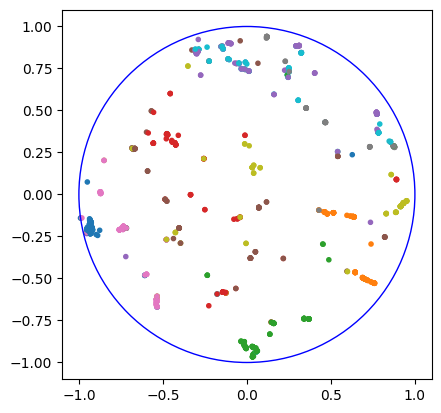

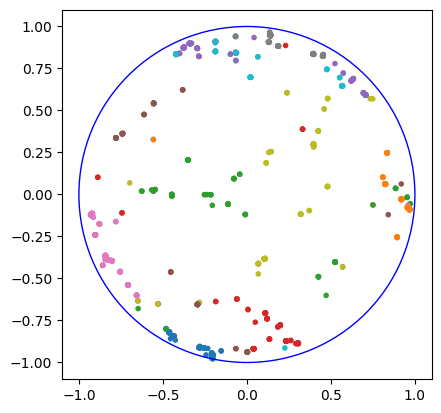

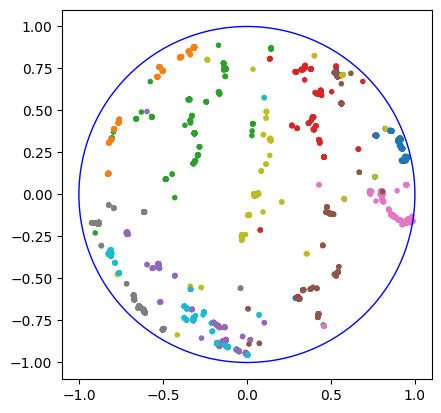

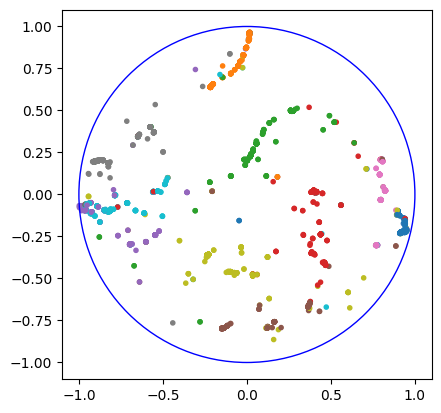

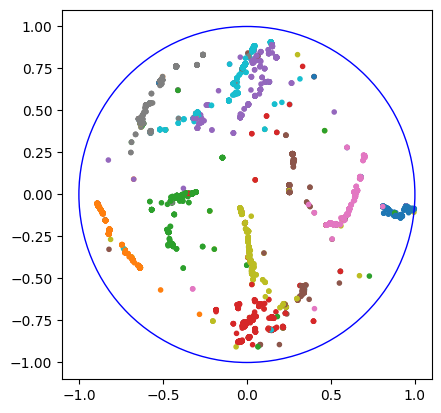

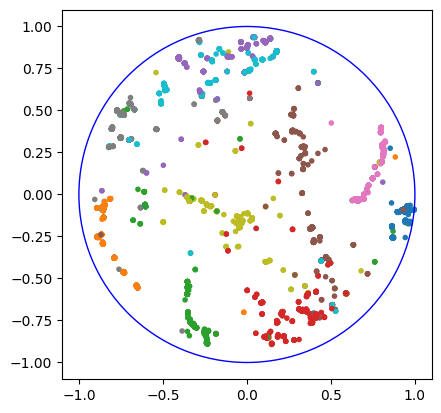

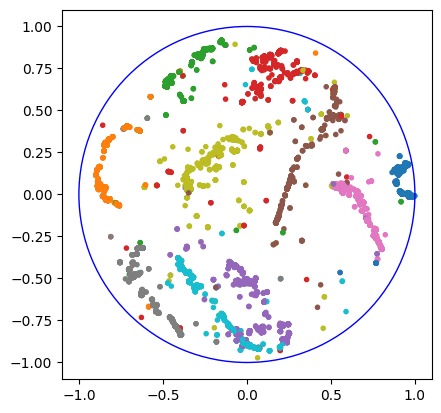

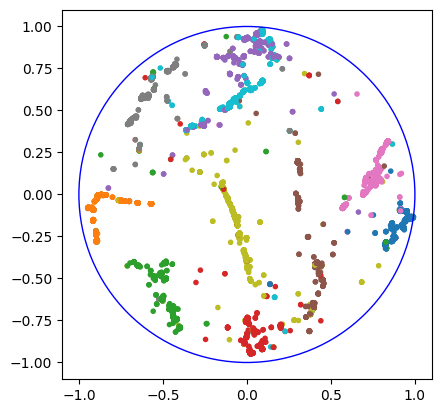

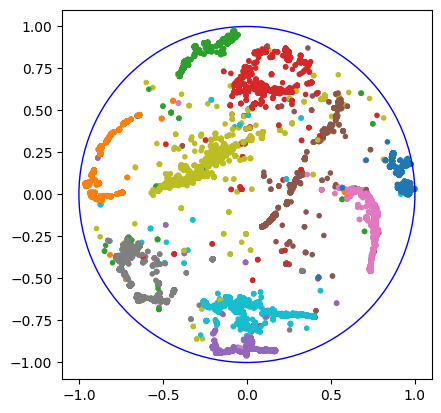

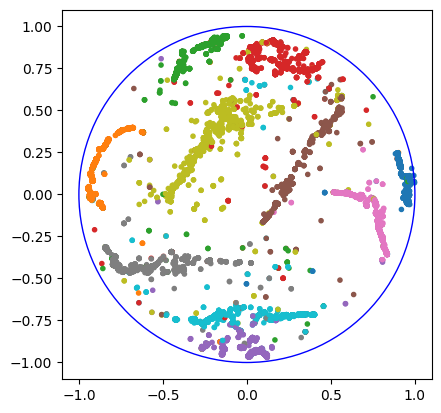

In [3]:
point_counts = [1000, 2500, 5000, 10000, 25000, 50000]
#u_grid_ns = [24]
grid_n = 100

exact_cpu_precisions = []
exact_cpu_recalls = []
exact_cpu_runtimes = []

exact_gpu_precisions = []
exact_gpu_recalls = []
exact_gpu_runtimes = []

ugrid_gpu_precisions = []
ugrid_gpu_recalls = []
ugrid_gpu_runtimes = []

qtree_cpu_precisions = []
qtree_cpu_recalls = []
qtree_cpu_runtimes = []

for i in range(3):
    for num_points in point_counts:
        #p, r, t = run(num_points, True, True, 0) # Running exact GPU
        #exact_gpu_precisions.append(p)
        #exact_gpu_recalls.append(r)
        #exact_gpu_runtimes.append(t)

        p, r, t = run(num_points, False, True, grid_n) # Running approx. using uniform grid
        ugrid_gpu_precisions.append(p)
        ugrid_gpu_recalls.append(r)
        ugrid_gpu_runtimes.append(t)

        p, r, t = run(num_points, False, False, 0) # Running approx. using quadtree
        qtree_cpu_precisions.append(p)
        qtree_cpu_recalls.append(r)
        qtree_cpu_runtimes.append(t)

[  48.09127188   77.51951504  154.27575636  322.84056473 2778.07939339
 7888.05410838   40.13604665   88.68009067  168.17294002  313.88594484
 1892.5030458  7863.4176023    48.55902028   72.61838484  167.37721682
  312.23759294 2618.78035593]
[ 24.58601761  39.34681344  61.46178293 102.53084993 257.82798171
 446.9368329   27.96259665  40.69764423  62.47417545  94.11736059
 269.44383168 429.17143488  27.72997022  42.71640372  61.95500946
  96.21698928 245.48129225]
[  23.06745648   54.2154386    82.80602551  178.14290905  399.33811617
 1003.94980383   26.31923509   43.72778058   91.13015866  161.16668892
  437.60242248 1018.46151543   21.17250061   52.16273451   91.66429925
  170.68089271  420.56240225]
[44.113659262657166, 83.09980285167694, 161.2243481874466, 318.3632547855377, 2335.2912195920944, 7875.735855340958]
[26.274307131767273, 40.022228837013245, 61.967979192733765, 98.32410526275635, 263.6359066963196, 438.0541338920593]
[24.69334578514099, 48.971609592437744, 86.9680920839

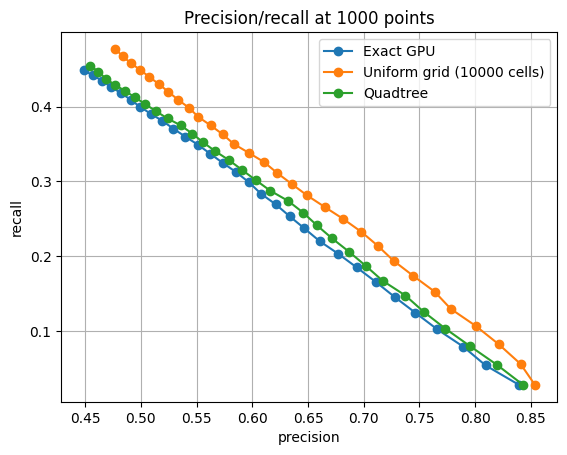

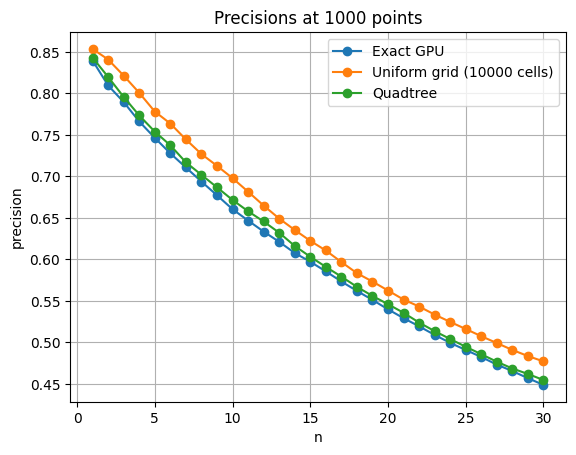

precisions:  [0.7002     0.6715     0.65286667 0.6353     0.62056    0.60846667
 0.5944     0.582875   0.57082222 0.55892    0.54712727 0.53633333
 0.5254     0.51664286 0.50768    0.4994125  0.49151765 0.48371111
 0.47573684 0.46806    0.46081905 0.45402727 0.44756522 0.44109167
 0.435056   0.42910769 0.42347407 0.41812857 0.41208276 0.40659333]


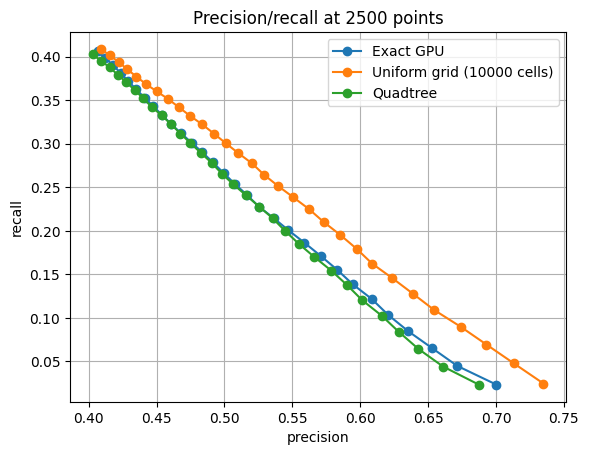

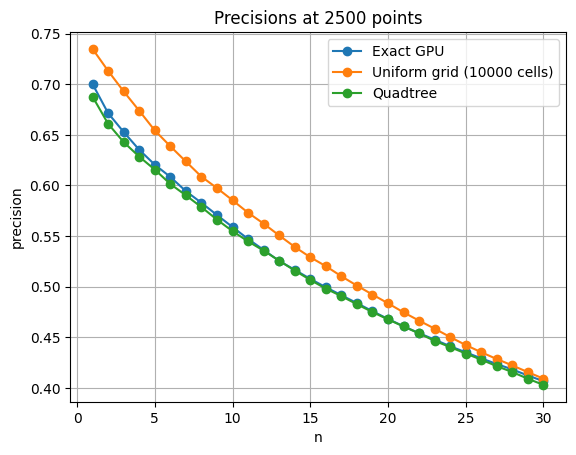

precisions:  [0.5945     0.5709     0.55436667 0.540075   0.5273     0.51545
 0.50392857 0.493175   0.48511111 0.47655    0.46877273 0.46140833
 0.45388462 0.44662143 0.43972667 0.43338125 0.42672941 0.42089444
 0.41449474 0.40843    0.40225714 0.39622727 0.3906913  0.38555417
 0.380564   0.37553077 0.37027778 0.3654     0.36073103 0.35600667]


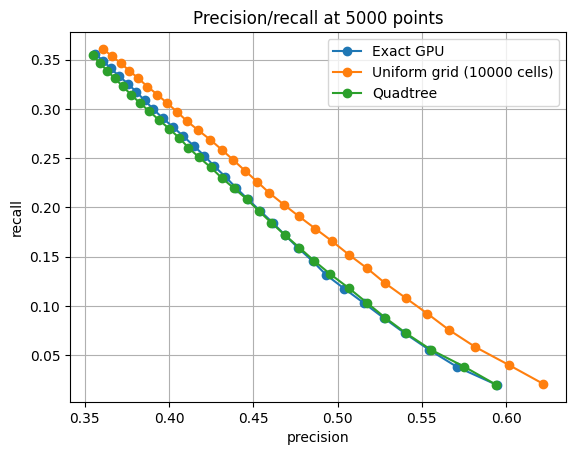

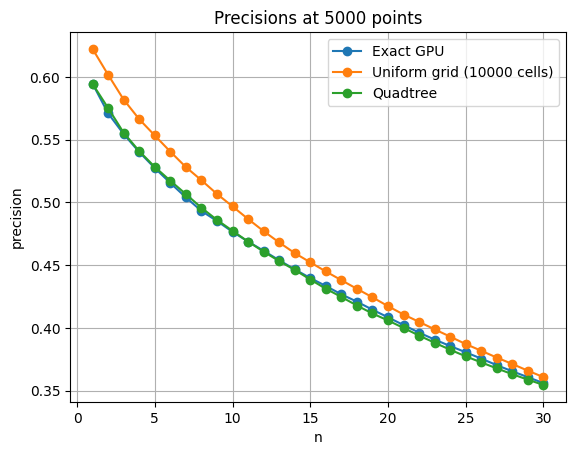

precisions:  [0.53195    0.5103     0.49225    0.476675   0.46312    0.45139167
 0.43980714 0.42905625 0.41944444 0.410165   0.4024     0.39445
 0.38803077 0.38118571 0.37491    0.3690375  0.36333529 0.357675
 0.35257895 0.3473525  0.34259762 0.33801591 0.33350652 0.329175
 0.32514    0.32118462 0.31731667 0.31330179 0.30931897 0.305505  ]


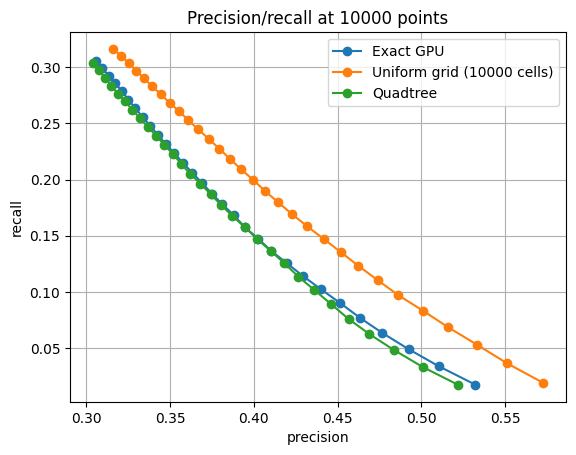

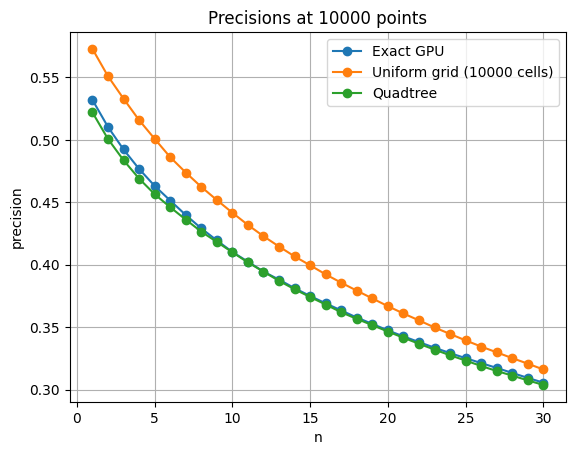

precisions:  [0.42928    0.41016    0.39294    0.379115   0.367384   0.35662333
 0.34678571 0.3385175  0.33081333 0.323568   0.31695273 0.31063667
 0.30486    0.29923571 0.29385467 0.28902375 0.28436235 0.27984333
 0.27557579 0.271492   0.26759524 0.26375727 0.26005565 0.25643667
 0.2531344  0.24983462 0.24664667 0.24374429 0.24074828 0.23795533]


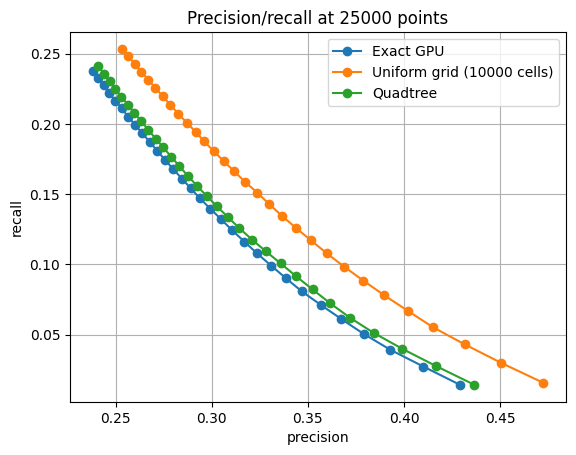

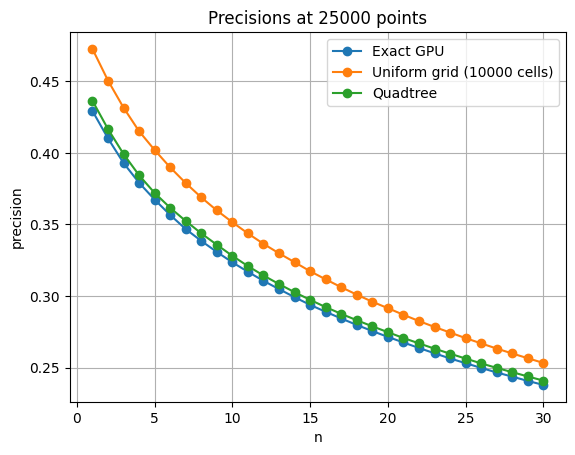

precisions:  [0.39206    0.37312    0.35593    0.3416975  0.329274   0.31853
 0.30866    0.2997775  0.29190333 0.284602   0.27790091 0.27162583
 0.26586308 0.2606     0.25561267 0.25087125 0.24647235 0.24212889
 0.23811316 0.2343005  0.23064381 0.22708409 0.22380739 0.220615
 0.2175908  0.21473615 0.21187593 0.20921786 0.20660034 0.20407167]


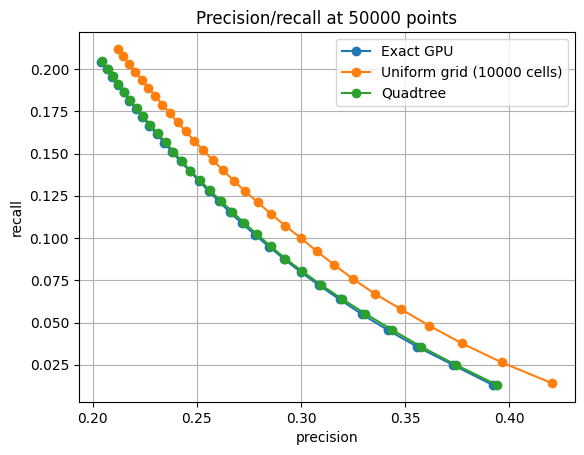

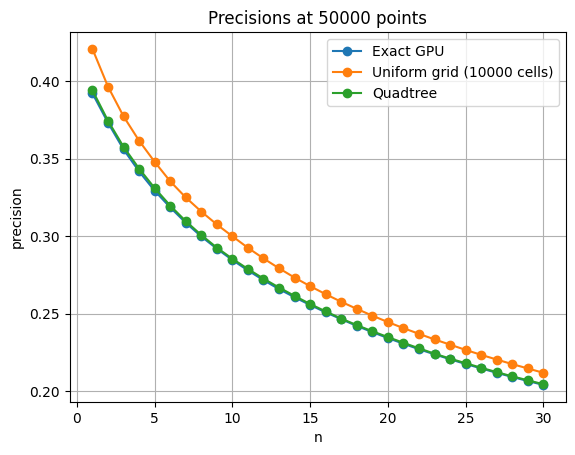

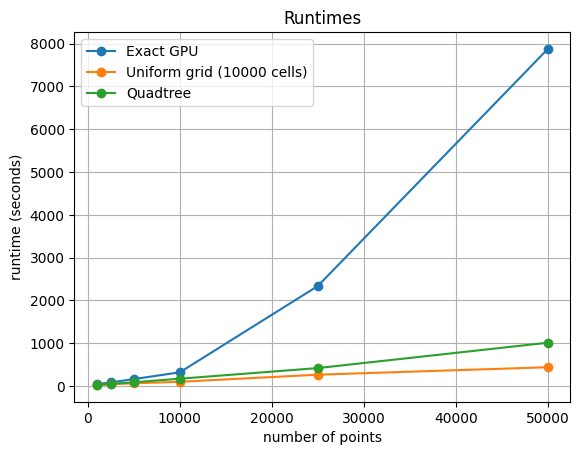

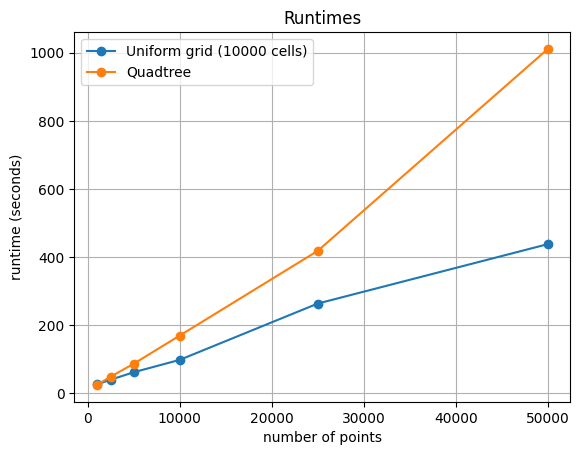

In [10]:

exact_gpu_precisions = [[0.86, 0.8245, 0.8053333333333333, 0.77875, 0.755, 0.7378333333333333, 0.7178571428571429, 0.700125, 0.6844444444444444, 0.6668, 0.6521818181818182, 0.6375, 0.6243846153846154, 0.6098571428571429, 0.5985333333333333, 0.585125, 0.5735294117647058, 0.5628333333333334, 0.5526315789473685, 0.5422, 0.5305714285714286, 0.5215909090909091, 0.5106086956521739, 0.5019583333333333, 0.49268, 0.48480769230769233, 0.47559259259259257, 0.4685714285714285, 0.4606551724137931, 0.4519333333333333], [0.7044, 0.6726, 0.6530666666666666, 0.6319, 0.61656, 0.6049333333333333, 0.5886857142857143, 0.57755, 0.5667555555555557, 0.55468, 0.5435636363636364, 0.5329333333333333, 0.5224615384615384, 0.5151142857142856, 0.5068799999999999, 0.498625, 0.4901411764705882, 0.4819555555555556, 0.4744, 0.46643999999999997, 0.4590666666666667, 0.4526, 0.4464695652173913, 0.4402833333333333, 0.43505599999999994, 0.42998461538461535, 0.42463703703703704, 0.4198142857142857, 0.41390344827586206, 0.40868000000000004], [0.5882, 0.5659, 0.5523333333333333, 0.5373, 0.5251600000000001, 0.5125666666666666, 0.5014571428571428, 0.490025, 0.4809111111111111, 0.4717, 0.4638727272727272, 0.4564833333333333, 0.4495538461538462, 0.44315714285714275, 0.43596, 0.429475, 0.42271764705882353, 0.4171888888888889, 0.4106421052631578, 0.40462000000000004, 0.39860952380952375, 0.3926181818181818, 0.3871478260869565, 0.38251666666666667, 0.377504, 0.37261538461538457, 0.36746666666666666, 0.3626785714285714, 0.35806206896551723, 0.3532866666666667], [0.537, 0.5101, 0.4916666666666666, 0.475675, 0.46316, 0.4516666666666667, 0.4406, 0.4296125, 0.4192, 0.4097, 0.4013181818181817, 0.39298333333333335, 0.3864461538461539, 0.37990714285714283, 0.37284666666666666, 0.36693125, 0.36108235294117647, 0.3554333333333333, 0.35020526315789474, 0.344955, 0.3403666666666667, 0.3354818181818181, 0.3309826086956522, 0.3266791666666667, 0.3226240000000001, 0.31850769230769227, 0.3144666666666666, 0.310275, 0.30609310344827584, 0.30210666666666663], [0.42176, 0.40632, 0.3890666666666666, 0.37537, 0.364248, 0.3544333333333334, 0.34473714285714285, 0.33681, 0.3296977777777778, 0.322604, 0.31626181818181814, 0.31042, 0.3049323076923077, 0.29960285714285717, 0.2942933333333333, 0.2895875, 0.2848635294117647, 0.28057777777777776, 0.27640210526315784, 0.27242799999999995, 0.2686552380952381, 0.26486727272727273, 0.2613078260869566, 0.25771666666666665, 0.25441600000000003, 0.25133846153846157, 0.2482133333333333, 0.24526857142857142, 0.24233241379310344, 0.23961066666666667], [0.3843, 0.36584, 0.35004, 0.33565, 0.324348, 0.31388333333333335, 0.3043142857142857, 0.2957325, 0.2881688888888889, 0.28111200000000003, 0.27461090909090907, 0.26854, 0.2629292307692308, 0.2577857142857143, 0.25295199999999995, 0.24840125, 0.24411529411764707, 0.23988222222222222, 0.2359336842105263, 0.23221799999999998, 0.2285552380952381, 0.22511363636363632, 0.22192695652173913, 0.21876583333333333, 0.2157736, 0.21297384615384618, 0.21022074074074076, 0.207605, 0.20496413793103452, 0.2025946666666667], [0.819, 0.7945, 0.7736666666666666, 0.7535, 0.7378000000000001, 0.7176666666666667, 0.7035714285714285, 0.687375, 0.67, 0.6541, 0.6413636363636362, 0.6295, 0.6179230769230769, 0.6055714285714285, 0.5958, 0.586, 0.5731764705882354, 0.5612222222222222, 0.5497368421052631, 0.53745, 0.5278095238095238, 0.5171363636363635, 0.5074347826086957, 0.49687499999999996, 0.48900000000000005, 0.48, 0.47081481481481485, 0.4623571428571429, 0.4531034482758621, 0.4456], [0.696, 0.6704, 0.6526666666666666, 0.6387, 0.62456, 0.612, 0.6001142857142857, 0.5882, 0.5748888888888889, 0.56316, 0.550690909090909, 0.5397333333333334, 0.5283384615384615, 0.5181714285714286, 0.5084799999999999, 0.5002, 0.4928941176470588, 0.4854666666666666, 0.4770736842105263, 0.46967999999999993, 0.46257142857142863, 0.4554545454545454, 0.4486608695652174, 0.4419, 0.43505600000000005, 0.42823076923076925, 0.422311111111111, 0.41644285714285706, 0.4102620689655172, 0.4045066666666667], [0.6008, 0.5759, 0.5564, 0.54285, 0.5294399999999999, 0.5183333333333334, 0.5064, 0.496325, 0.48931111111111114, 0.4814, 0.4736727272727273, 0.4663333333333333, 0.4582153846153846, 0.4500857142857143, 0.44349333333333335, 0.4372875, 0.4307411764705883, 0.4246, 0.4183473684210527, 0.41223999999999994, 0.4059047619047618, 0.39983636363636366, 0.39423478260869566, 0.3885916666666667, 0.383624, 0.3784461538461539, 0.37308888888888886, 0.36812142857142854, 0.3634, 0.35872666666666664], [0.5269, 0.5105, 0.4928333333333333, 0.477675, 0.46308, 0.4511166666666667, 0.4390142857142857, 0.4285, 0.4196888888888889, 0.41063, 0.4034818181818181, 0.3959166666666667, 0.38961538461538464, 0.38246428571428576, 0.3769733333333334, 0.37114375, 0.36558823529411766, 0.35991666666666666, 0.35495263157894735, 0.34975, 0.3448285714285714, 0.34055, 0.33603043478260874, 0.33167083333333336, 0.32765600000000006, 0.32386153846153853, 0.32016666666666665, 0.3163285714285714, 0.3125448275862069, 0.3089033333333333], [0.4368, 0.414, 0.3968133333333333, 0.38286, 0.37052, 0.35881333333333326, 0.34883428571428565, 0.340225, 0.33192888888888883, 0.324532, 0.3176436363636363, 0.31085333333333337, 0.3047876923076923, 0.29886857142857143, 0.293416, 0.28846, 0.28386117647058823, 0.27910888888888885, 0.27474947368421054, 0.27055599999999996, 0.2665352380952381, 0.26264727272727273, 0.2588034782608696, 0.2551566666666667, 0.25185280000000004, 0.24833076923076924, 0.24507999999999996, 0.24221999999999996, 0.2391641379310345, 0.23630000000000004], [0.39982, 0.3804, 0.36182, 0.347745, 0.33420000000000005, 0.32317666666666667, 0.3130057142857143, 0.3038225, 0.2956377777777778, 0.28809199999999996, 0.28119090909090905, 0.2747116666666667, 0.2687969230769231, 0.2634142857142857, 0.25827333333333335, 0.25334125, 0.24882941176470588, 0.2443755555555555, 0.24029263157894734, 0.23638300000000004, 0.2327323809523809, 0.22905454545454546, 0.22568782608695653, 0.22246416666666669, 0.21940800000000002, 0.21649846153846156, 0.21353111111111114, 0.2108307142857143, 0.2082365517241379, 0.20554866666666666], [0.871, 0.828, 0.7996666666666666, 0.77925, 0.7552000000000001, 0.7366666666666667, 0.7204285714285713, 0.705375, 0.6881111111111111, 0.6732, 0.6554545454545454, 0.6418333333333334, 0.627, 0.6111428571428571, 0.5972, 0.584125, 0.5703529411764706, 0.558, 0.5467894736842105, 0.5362, 0.5249047619047619, 0.515, 0.5065217391304347, 0.49583333333333335, 0.486, 0.4773076923076924, 0.4673703703703703, 0.4593928571428571, 0.45282758620689656, 0.44493333333333335], [0.6524, 0.6272, 0.6077333333333333, 0.5893, 0.57616, 0.5624, 0.5499428571428572, 0.5412, 0.5268444444444443, 0.5154, 0.5042545454545454, 0.4952333333333333, 0.48621538461538455, 0.47794285714285706, 0.46893333333333337, 0.460825, 0.45430588235294117, 0.4462, 0.4393684210526315, 0.4324, 0.42565714285714273, 0.4192727272727273, 0.4137391304347826, 0.4074333333333333, 0.401616, 0.39592307692307693, 0.3906666666666667, 0.3858, 0.38097931034482757, 0.37550666666666666], [0.6336, 0.6072, 0.5864666666666666, 0.56945, 0.55628, 0.5428666666666666, 0.5307142857142857, 0.519925, 0.5090888888888889, 0.4999, 0.4910909090909091, 0.4812333333333334, 0.4726461538461539, 0.4653, 0.45730666666666664, 0.44995, 0.44267058823529404, 0.43552222222222214, 0.4289894736842105, 0.422, 0.4154, 0.4089545454545455, 0.4024086956521739, 0.3967166666666667, 0.39085600000000004, 0.38478461538461545, 0.3795555555555556, 0.3739571428571428, 0.36817931034482765, 0.36334666666666665], [0.5258, 0.5137, 0.4937333333333333, 0.479325, 0.46586000000000005, 0.4540666666666666, 0.4444714285714285, 0.43475, 0.4255111111111111, 0.4163, 0.40824545454545447, 0.4006166666666667, 0.39297692307692306, 0.38585714285714284, 0.3790733333333334, 0.37289375, 0.3669235294117647, 0.3611111111111111, 0.35581052631578947, 0.350675, 0.34553809523809526, 0.34068181818181814, 0.3360347826086956, 0.33157083333333337, 0.3272280000000001, 0.3229923076923077, 0.31878148148148144, 0.3145178571428571, 0.3102620689655172, 0.3067166666666667], [0.4408, 0.42126, 0.40142666666666665, 0.38601, 0.3736000000000001, 0.36241333333333337, 0.35231428571428575, 0.34407, 0.33630222222222217, 0.3296239999999999, 0.32377090909090905, 0.31737, 0.3109415384615385, 0.3053571428571429, 0.30006133333333335, 0.2950225, 0.2903458823529412, 0.2857511111111111, 0.2814273684210526, 0.2775, 0.27369333333333334, 0.26984363636363634, 0.2660417391304348, 0.26244166666666674, 0.2591568, 0.2560061538461539, 0.2528340740740741, 0.24984999999999996, 0.24701793103448272, 0.24428933333333333]]
exact_gpu_recalls = [[0.028666666666666663, 0.054966666666666664, 0.08053333333333333, 0.10383333333333335, 0.12583333333333335, 0.14756666666666665, 0.1675, 0.1867, 0.20533333333333337, 0.22226666666666664, 0.23913333333333334, 0.255, 0.2705666666666666, 0.2846, 0.2992666666666666, 0.31206666666666666, 0.325, 0.33769999999999994, 0.35, 0.3614666666666667, 0.37139999999999995, 0.3825, 0.3914666666666667, 0.4015666666666667, 0.4105666666666666, 0.42016666666666663, 0.4280333333333333, 0.4373333333333333, 0.4453, 0.4519333333333333], [0.023479999999999997, 0.04484, 0.06530666666666667, 0.08425333333333333, 0.10275999999999999, 0.12098666666666666, 0.13735999999999998, 0.15401333333333334, 0.1700266666666667, 0.18489333333333333, 0.19930666666666666, 0.21317333333333335, 0.2264, 0.24038666666666667, 0.25343999999999994, 0.2659333333333333, 0.2777466666666667, 0.28917333333333334, 0.30045333333333335, 0.31096, 0.3213466666666666, 0.3319066666666667, 0.34229333333333334, 0.35222666666666663, 0.36254666666666674, 0.3726533333333334, 0.3821733333333333, 0.39182666666666666, 0.40010666666666667, 0.40868000000000004], [0.019606666666666665, 0.037726666666666665, 0.055233333333333336, 0.07164, 0.08752666666666667, 0.10251333333333332, 0.11700666666666666, 0.13067333333333334, 0.14427333333333334, 0.15723333333333334, 0.1700866666666667, 0.18259333333333333, 0.19480666666666666, 0.20680666666666667, 0.21798, 0.22905333333333333, 0.23953999999999998, 0.25031333333333333, 0.2600733333333334, 0.2697466666666667, 0.27902666666666665, 0.28792, 0.2968133333333333, 0.3060133333333333, 0.3145866666666667, 0.3229333333333333, 0.33071999999999996, 0.3385, 0.34612666666666664, 0.3532866666666667], [0.0179, 0.034006666666666664, 0.049166666666666664, 0.06342333333333333, 0.07719333333333332, 0.09033333333333333, 0.10280666666666666, 0.11456333333333335, 0.12575999999999998, 0.13656666666666667, 0.14715, 0.15719333333333335, 0.16746000000000003, 0.17729, 0.18642333333333333, 0.19569666666666666, 0.2046133333333333, 0.21326000000000003, 0.22179666666666667, 0.22996999999999998, 0.23825666666666667, 0.24602, 0.25375333333333333, 0.2613433333333333, 0.26885333333333333, 0.27604, 0.28302000000000005, 0.28959000000000007, 0.29589, 0.30210666666666663], [0.014058666666666665, 0.027087999999999997, 0.03890666666666666, 0.05004933333333333, 0.060708000000000005, 0.07088666666666665, 0.08043866666666667, 0.08981600000000002, 0.09890933333333335, 0.10753466666666667, 0.11596266666666666, 0.12416800000000001, 0.13213733333333333, 0.13981466666666667, 0.14714666666666665, 0.1544466666666667, 0.1614226666666667, 0.16834666666666667, 0.17505466666666666, 0.18161866666666665, 0.18805866666666668, 0.194236, 0.20033600000000001, 0.20617333333333335, 0.21201333333333333, 0.21782666666666667, 0.22339199999999998, 0.22891733333333333, 0.23425466666666664, 0.23961066666666667], [0.012809999999999998, 0.024389333333333332, 0.03500399999999999, 0.04475333333333333, 0.054058, 0.06277666666666666, 0.07100666666666666, 0.078862, 0.08645066666666666, 0.09370400000000001, 0.10069066666666669, 0.107416, 0.11393600000000002, 0.1203, 0.12647599999999998, 0.13248066666666666, 0.13833200000000004, 0.14392933333333335, 0.14942466666666668, 0.15481199999999998, 0.1599886666666667, 0.16508333333333336, 0.17014400000000002, 0.17501266666666668, 0.17981133333333335, 0.18457733333333337, 0.18919866666666668, 0.19376466666666667, 0.198132, 0.2025946666666667], [0.027299999999999998, 0.05296666666666666, 0.07736666666666668, 0.10046666666666666, 0.12296666666666668, 0.14353333333333335, 0.16416666666666668, 0.18330000000000002, 0.201, 0.21803333333333333, 0.23516666666666666, 0.2518, 0.26776666666666665, 0.2826, 0.2979, 0.3125333333333334, 0.3248, 0.33673333333333333, 0.3481666666666667, 0.3583, 0.3694666666666667, 0.37923333333333337, 0.3890333333333333, 0.3975, 0.4075, 0.416, 0.42373333333333335, 0.4315333333333333, 0.438, 0.4456], [0.0232, 0.04469333333333333, 0.06526666666666667, 0.08515999999999999, 0.10409333333333332, 0.1224, 0.14002666666666666, 0.15685333333333332, 0.17246666666666668, 0.18772, 0.20192, 0.21589333333333333, 0.22894666666666666, 0.24181333333333332, 0.25423999999999997, 0.26677333333333336, 0.27930666666666665, 0.29128000000000004, 0.3021466666666666, 0.31312, 0.3238, 0.334, 0.34397333333333335, 0.35352, 0.3625466666666667, 0.37113333333333337, 0.38008000000000003, 0.38867999999999997, 0.3965866666666667, 0.4045066666666667], [0.020026666666666665, 0.03839333333333333, 0.055639999999999995, 0.07238, 0.08824, 0.10366666666666666, 0.11816000000000002, 0.13235333333333332, 0.14679333333333333, 0.16046666666666667, 0.17368, 0.18653333333333333, 0.19856, 0.21004, 0.22174666666666668, 0.23321999999999998, 0.24408666666666667, 0.25476, 0.2649533333333333, 0.27482666666666666, 0.2841333333333333, 0.2932133333333333, 0.30224666666666666, 0.31087333333333333, 0.3196866666666667, 0.3279866666666667, 0.33577999999999997, 0.34358, 0.3512866666666667, 0.35872666666666664], [0.01756333333333333, 0.03403333333333334, 0.049283333333333325, 0.06369, 0.07718000000000001, 0.09022333333333334, 0.10243666666666668, 0.11426666666666667, 0.1259066666666667, 0.13687666666666667, 0.14794333333333334, 0.15836666666666668, 0.16883333333333334, 0.17848333333333335, 0.1884866666666667, 0.19794333333333333, 0.20716666666666664, 0.21595, 0.22480333333333333, 0.2331666666666667, 0.24138, 0.2497366666666667, 0.2576233333333333, 0.26533666666666667, 0.2730466666666667, 0.28068000000000004, 0.28815, 0.29524, 0.3021266666666667, 0.3089033333333333], [0.014559999999999998, 0.027599999999999996, 0.03968133333333333, 0.051048, 0.061753333333333334, 0.07176266666666667, 0.08139466666666666, 0.09072666666666668, 0.09957866666666669, 0.10817733333333333, 0.11646933333333336, 0.12434133333333335, 0.13207466666666667, 0.139472, 0.146708, 0.15384533333333333, 0.1608546666666667, 0.16746533333333333, 0.174008, 0.1803706666666667, 0.18657466666666667, 0.19260800000000003, 0.19841599999999998, 0.20412533333333335, 0.20987733333333333, 0.21522, 0.22057200000000002, 0.226072, 0.231192, 0.23630000000000004], [0.013327333333333333, 0.025359999999999997, 0.036182, 0.046366000000000004, 0.0557, 0.06463533333333332, 0.07303466666666668, 0.08101933333333335, 0.08869133333333333, 0.09603066666666665, 0.10310333333333335, 0.10988466666666667, 0.11647866666666669, 0.12292666666666668, 0.12913666666666668, 0.13511533333333334, 0.14100333333333337, 0.14662533333333333, 0.15218533333333334, 0.15758866666666665, 0.16291266666666668, 0.16797333333333336, 0.17302733333333334, 0.17797133333333334, 0.18284, 0.18763200000000002, 0.192178, 0.19677533333333336, 0.20129533333333333, 0.20554866666666666], [0.02903333333333333, 0.0552, 0.07996666666666667, 0.1039, 0.12586666666666668, 0.14733333333333337, 0.16810000000000003, 0.18810000000000002, 0.20643333333333333, 0.22440000000000002, 0.24033333333333334, 0.25673333333333337, 0.2717, 0.28520000000000006, 0.2986, 0.3115333333333334, 0.32319999999999993, 0.33479999999999993, 0.34629999999999994, 0.3574666666666667, 0.3674333333333333, 0.3776666666666667, 0.38833333333333336, 0.3966666666666666, 0.405, 0.4136666666666666, 0.4206333333333333, 0.42876666666666663, 0.43773333333333336, 0.44493333333333335], [0.021746666666666664, 0.041813333333333334, 0.060773333333333325, 0.07857333333333333, 0.09602666666666665, 0.11247999999999997, 0.12832000000000002, 0.14432, 0.15805333333333332, 0.1718, 0.18489333333333333, 0.19809333333333334, 0.21069333333333334, 0.22304000000000002, 0.23446666666666668, 0.24577333333333337, 0.25743999999999995, 0.26771999999999996, 0.2782666666666667, 0.28826666666666667, 0.29796000000000006, 0.30746666666666667, 0.3172, 0.3259466666666666, 0.33468000000000003, 0.34313333333333335, 0.3516, 0.36007999999999996, 0.36828, 0.37550666666666666], [0.02112, 0.040479999999999995, 0.05864666666666666, 0.07592666666666667, 0.09271333333333331, 0.10857333333333331, 0.12383333333333335, 0.13864666666666667, 0.15272666666666668, 0.16663333333333333, 0.18006666666666668, 0.19249333333333335, 0.20481333333333332, 0.21713999999999997, 0.22865333333333332, 0.23997333333333334, 0.2508466666666666, 0.26131333333333334, 0.27169333333333334, 0.2813333333333333, 0.29078000000000004, 0.2999, 0.3085133333333333, 0.31737333333333334, 0.3257133333333333, 0.33348, 0.3416, 0.34902666666666665, 0.35590666666666665, 0.36334666666666665], [0.01752666666666667, 0.03424666666666666, 0.04937333333333333, 0.06391000000000001, 0.07764333333333334, 0.09081333333333334, 0.10371, 0.11593333333333335, 0.12765333333333334, 0.13876666666666668, 0.14969000000000002, 0.16024666666666668, 0.17029000000000002, 0.18006666666666668, 0.1895366666666667, 0.19887666666666667, 0.20792333333333335, 0.2166666666666667, 0.22534666666666667, 0.23378333333333332, 0.24187666666666663, 0.24983333333333335, 0.2576266666666666, 0.26525666666666664, 0.27269, 0.2799266666666667, 0.2869033333333334, 0.29355, 0.29991999999999996, 0.3067166666666667], [0.014693333333333333, 0.028084, 0.04014266666666667, 0.051468, 0.06226666666666665, 0.07248266666666665, 0.08220666666666668, 0.09175199999999999, 0.10089066666666667, 0.10987466666666669, 0.118716, 0.126948, 0.13474133333333338, 0.1425, 0.15003066666666667, 0.15734533333333334, 0.16452933333333333, 0.17145066666666667, 0.17823733333333333, 0.185, 0.19158533333333336, 0.19788533333333336, 0.20396533333333333, 0.20995333333333333, 0.215964, 0.221872, 0.22755066666666665, 0.2331933333333333, 0.23878400000000002, 0.24428933333333333]]
exact_gpu_runtimes = [48.09127187728882, 77.51951503753662, 154.27575635910034, 322.8405647277832, 2778.079393386841, 7888.054108381271, 40.13604664802551, 88.68009066581726, 168.17294001579285, 313.88594484329224, 1892.503045797348, 7863.417602300644, 48.55902028083801, 72.61838483810425, 167.3772168159485, 312.23759293556213, 2618.7803559303284]
ugrid_gpu_precisions = [[0.853, 0.8365, 0.8156666666666665, 0.79825, 0.7772, 0.7641666666666668, 0.7492857142857142, 0.7335, 0.7204444444444444, 0.7063, 0.6901818181818181, 0.6734166666666667, 0.6571538461538462, 0.6445714285714286, 0.6321333333333333, 0.621875, 0.6093529411764705, 0.5962222222222222, 0.5863157894736841, 0.5757000000000001, 0.565047619047619, 0.5570909090909091, 0.5484347826086956, 0.53975, 0.52976, 0.5208461538461538, 0.5125555555555555, 0.5052142857142856, 0.4971034482758621, 0.49060000000000004], [0.7336, 0.716, 0.6972, 0.6783, 0.6552, 0.6381333333333333, 0.6232, 0.60795, 0.5933777777777778, 0.58124, 0.5677454545454546, 0.5558666666666666, 0.5442769230769231, 0.5319428571428572, 0.5222399999999999, 0.51245, 0.5014588235294117, 0.49275555555555567, 0.48374736842105265, 0.47434, 0.465695238095238, 0.4571272727272727, 0.4489739130434782, 0.44045, 0.43288000000000004, 0.4247846153846154, 0.4179703703703703, 0.41194285714285706, 0.40562758620689654, 0.3997866666666666], [0.6168, 0.5947, 0.5777333333333333, 0.56215, 0.54916, 0.5374333333333334, 0.5268571428571428, 0.516325, 0.5054, 0.49583999999999995, 0.4856181818181817, 0.4752666666666666, 0.46627692307692303, 0.45798571428571433, 0.45102666666666663, 0.443925, 0.4368, 0.4300555555555556, 0.42327368421052636, 0.41646000000000005, 0.4101619047619048, 0.4042636363636363, 0.3984782608695652, 0.39295, 0.3872, 0.38166923076923076, 0.3762148148148148, 0.37087857142857145, 0.3654551724137931, 0.36034], [0.566, 0.5453, 0.5274666666666668, 0.51015, 0.4965, 0.4818333333333333, 0.47035714285714286, 0.4584375, 0.44774444444444444, 0.43705999999999995, 0.4272363636363636, 0.418375, 0.41037692307692303, 0.4023357142857143, 0.3949466666666667, 0.38798125, 0.3811294117647059, 0.3748, 0.36859473684210525, 0.362545, 0.3568, 0.3514227272727273, 0.3462304347826087, 0.3410958333333334, 0.33636400000000005, 0.33161153846153846, 0.3272703703703703, 0.32281428571428566, 0.3185103448275862, 0.3141666666666667], [0.46716, 0.44578, 0.42809333333333327, 0.41116, 0.3981200000000001, 0.38588, 0.37537714285714285, 0.365795, 0.3569866666666666, 0.34902, 0.341330909090909, 0.33433, 0.3277753846153847, 0.3217142857142857, 0.31525600000000004, 0.309495, 0.3041670588235294, 0.29898444444444444, 0.29426947368421047, 0.28987, 0.2853695238095238, 0.2810781818181818, 0.2769443478260869, 0.2730366666666667, 0.26918720000000007, 0.26563846153846155, 0.26202370370370365, 0.2586942857142857, 0.25541793103448274, 0.25218266666666667], [0.41576, 0.38992, 0.37092, 0.355675, 0.34239600000000003, 0.32961, 0.31937714285714286, 0.3104075, 0.3021688888888889, 0.29468, 0.2874, 0.28060499999999994, 0.2745476923076923, 0.26864, 0.26325600000000005, 0.25834625, 0.2536670588235294, 0.24921666666666667, 0.2450736842105263, 0.24117699999999997, 0.23739904761904762, 0.2338572727272727, 0.23028000000000004, 0.22710333333333332, 0.22377360000000004, 0.2207323076923077, 0.2177725925925926, 0.21492500000000003, 0.2122006896551724, 0.20945466666666668], [0.854, 0.845, 0.827, 0.803, 0.779, 0.763, 0.7397142857142858, 0.72025, 0.705, 0.6894000000000001, 0.6729090909090909, 0.6563333333333332, 0.6411538461538462, 0.6262857142857142, 0.6126, 0.5995, 0.5842941176470589, 0.5705555555555556, 0.5602631578947369, 0.5492999999999999, 0.5381428571428571, 0.5293181818181818, 0.5185652173913043, 0.5095833333333334, 0.50248, 0.49403846153846154, 0.48577777777777775, 0.47660714285714284, 0.4699310344827586, 0.4635999999999999], [0.7364, 0.7106, 0.6888, 0.6695, 0.6536799999999999, 0.6394666666666667, 0.6242285714285714, 0.60955, 0.6014666666666666, 0.5896, 0.5784363636363637, 0.5687333333333333, 0.5569846153846154, 0.5466857142857143, 0.5358933333333332, 0.5281, 0.5191058823529412, 0.5092444444444444, 0.5006526315789473, 0.49272, 0.48344761904761907, 0.4756363636363636, 0.4679652173913044, 0.4598833333333334, 0.45164799999999994, 0.4454461538461539, 0.4388444444444444, 0.43221428571428566, 0.42529655172413794, 0.4182133333333333], [0.6276, 0.6085, 0.5859333333333333, 0.5703, 0.5573600000000001, 0.5433333333333333, 0.5293142857142857, 0.518875, 0.5079777777777778, 0.49772, 0.4878363636363636, 0.4788666666666666, 0.4698615384615385, 0.4611714285714285, 0.45343999999999995, 0.4460125, 0.4392, 0.4322222222222223, 0.4254526315789473, 0.41816000000000003, 0.4111619047619048, 0.4053181818181818, 0.39918260869565214, 0.3931, 0.38702400000000003, 0.38187692307692306, 0.3764444444444444, 0.3715857142857143, 0.36629655172413794, 0.36122], [0.5796, 0.55655, 0.5384333333333333, 0.5214, 0.5051000000000001, 0.4904, 0.4773, 0.46615, 0.4558222222222222, 0.44615, 0.436390909090909, 0.427225, 0.41868461538461543, 0.4109357142857143, 0.40404, 0.3965125, 0.39, 0.3836055555555556, 0.3773736842105263, 0.37098000000000003, 0.3650428571428571, 0.3593772727272727, 0.3532304347826087, 0.3479166666666667, 0.34238, 0.33721153846153845, 0.3323148148148149, 0.32750714285714283, 0.3229, 0.31799666666666665], [0.47808, 0.45528, 0.4351066666666666, 0.41906, 0.40589600000000003, 0.3938533333333333, 0.38246857142857144, 0.37204, 0.36263111111111107, 0.35412, 0.3461563636363636, 0.33864, 0.3319507692307692, 0.3256171428571429, 0.3194533333333333, 0.31389, 0.30823058823529415, 0.30303111111111114, 0.29782947368421053, 0.293258, 0.2885371428571429, 0.28403999999999996, 0.2799269565217391, 0.2760283333333333, 0.27209120000000003, 0.2682784615384616, 0.2646562962962963, 0.26115, 0.2577668965517242, 0.25443600000000005], [0.42566, 0.40289, 0.38356000000000007, 0.367365, 0.35342000000000007, 0.34111666666666673, 0.3305142857142857, 0.3212825, 0.31286222222222215, 0.30514399999999997, 0.29754181818181813, 0.29064833333333334, 0.28398769230769233, 0.2778871428571429, 0.2722333333333333, 0.26680375, 0.2616764705882353, 0.2570055555555556, 0.25237789473684213, 0.248046, 0.24396761904761904, 0.24017181818181813, 0.23653130434782604, 0.23298000000000005, 0.22954320000000003, 0.22618076923076927, 0.22310074074074074, 0.22005071428571424, 0.21718689655172413, 0.2143166666666667], [0.872, 0.8415, 0.8143333333333334, 0.8, 0.7758, 0.7545, 0.7397142857142857, 0.726125, 0.7114444444444444, 0.6961, 0.6807272727272727, 0.6665, 0.653, 0.6385714285714287, 0.6234666666666667, 0.6121875, 0.5990588235294118, 0.5886666666666668, 0.5768421052631579, 0.5671499999999999, 0.5579047619047619, 0.5471818181818181, 0.5368260869565218, 0.5267916666666667, 0.516, 0.505, 0.49637037037037035, 0.4886071428571429, 0.47982758620689653, 0.4717], [0.7376, 0.7278, 0.7024, 0.6837, 0.6662399999999999, 0.6514666666666666, 0.6358857142857142, 0.62095, 0.6091111111111112, 0.5976, 0.5853090909090909, 0.5729, 0.5609538461538461, 0.5478857142857143, 0.5357066666666667, 0.524875, 0.5149411764705882, 0.5045333333333334, 0.4945052631578947, 0.48522, 0.4765523809523809, 0.4670727272727272, 0.4592695652173913, 0.45045, 0.44286400000000004, 0.4357230769230769, 0.42837037037037046, 0.42155714285714285, 0.41456551724137936, 0.4076533333333333], [0.6362, 0.6185, 0.5973333333333334, 0.58185, 0.56676, 0.5528666666666666, 0.5397714285714286, 0.5276, 0.5149111111111111, 0.5024799999999999, 0.4916727272727272, 0.4813666666666666, 0.47107692307692306, 0.4621, 0.45343999999999995, 0.4443125, 0.43615294117647063, 0.42864444444444444, 0.421178947368421, 0.41371, 0.40694285714285716, 0.4003909090909091, 0.3942521739130435, 0.38863333333333333, 0.38284, 0.3777153846153847, 0.3724, 0.36710714285714285, 0.36230344827586203, 0.35746000000000006], [0.5744, 0.54925, 0.5319666666666667, 0.51475, 0.4983, 0.4839833333333333, 0.47064285714285714, 0.4573125, 0.4459555555555555, 0.4354799999999999, 0.4265, 0.4169916666666666, 0.4086538461538462, 0.40078571428571425, 0.3931733333333334, 0.3857375, 0.37841176470588234, 0.3722, 0.36551052631578945, 0.359645, 0.35390476190476194, 0.34833181818181813, 0.34275217391304347, 0.3374291666666667, 0.332384, 0.3272461538461539, 0.32273703703703704, 0.31826785714285716, 0.31416551724137937, 0.31007], [0.46344, 0.44328, 0.4252666666666666, 0.4108, 0.396072, 0.3849933333333333, 0.37348, 0.363945, 0.3546044444444444, 0.34631199999999995, 0.33844727272727265, 0.33155, 0.32498461538461537, 0.31898, 0.3132106666666667, 0.30771, 0.302355294117647, 0.2973644444444445, 0.2927831578947368, 0.28829800000000005, 0.28379999999999994, 0.2794290909090909, 0.2752347826086956, 0.27125333333333335, 0.2674624, 0.2638384615384616, 0.26034518518518523, 0.25693285714285713, 0.25352551724137934, 0.250292]]
ugrid_gpu_recalls = [[0.02843333333333333, 0.05576666666666666, 0.08156666666666666, 0.10643333333333334, 0.12953333333333336, 0.15283333333333335, 0.17483333333333334, 0.19560000000000002, 0.21613333333333332, 0.23543333333333333, 0.25306666666666666, 0.2693666666666667, 0.28476666666666667, 0.30079999999999996, 0.31606666666666666, 0.3316666666666666, 0.3453, 0.35773333333333335, 0.3713333333333333, 0.3838, 0.3955333333333333, 0.4085333333333333, 0.4204666666666667, 0.43179999999999996, 0.4414666666666666, 0.45139999999999997, 0.46129999999999993, 0.4715333333333333, 0.4805333333333333, 0.49060000000000004], [0.024453333333333334, 0.04773333333333333, 0.06971999999999999, 0.09043999999999999, 0.1092, 0.12762666666666667, 0.14541333333333334, 0.16212, 0.17801333333333336, 0.19374666666666668, 0.20817333333333335, 0.22234666666666666, 0.23585333333333333, 0.24823999999999996, 0.26111999999999996, 0.27330666666666664, 0.28415999999999997, 0.2956533333333334, 0.30637333333333333, 0.31622666666666666, 0.3259866666666667, 0.3352266666666666, 0.3442133333333333, 0.35236, 0.3607333333333333, 0.3681466666666666, 0.37617333333333336, 0.38448, 0.39210666666666666, 0.3997866666666666], [0.02056, 0.03964666666666666, 0.057773333333333336, 0.07495333333333332, 0.09152666666666666, 0.10748666666666666, 0.12293333333333333, 0.13768666666666668, 0.15161999999999998, 0.16528, 0.17806, 0.19010666666666667, 0.20205333333333333, 0.21372666666666665, 0.22551333333333332, 0.23675999999999994, 0.24752, 0.25803333333333334, 0.26807333333333333, 0.27764, 0.28711333333333333, 0.29646, 0.3055, 0.31436, 0.32266666666666666, 0.33078, 0.33859333333333336, 0.34615333333333337, 0.3532733333333334, 0.36034], [0.018866666666666664, 0.03635333333333333, 0.05274666666666667, 0.06802000000000001, 0.08275, 0.09636666666666667, 0.10975, 0.12225, 0.13432333333333335, 0.1456866666666667, 0.15665333333333334, 0.16735000000000003, 0.17783000000000002, 0.18775666666666668, 0.19747333333333336, 0.20692333333333335, 0.21597333333333335, 0.22488000000000002, 0.23344333333333334, 0.24169666666666667, 0.24975999999999998, 0.25771, 0.26544333333333336, 0.2728766666666667, 0.28030333333333335, 0.2873966666666667, 0.2945433333333333, 0.30129333333333336, 0.30789333333333335, 0.3141666666666667], [0.015572, 0.029718666666666668, 0.042809333333333324, 0.054821333333333326, 0.06635333333333333, 0.07717600000000001, 0.087588, 0.09754533333333333, 0.10709599999999998, 0.11634, 0.1251546666666667, 0.13373200000000002, 0.142036, 0.15013333333333334, 0.15762800000000002, 0.16506400000000002, 0.1723613333333333, 0.1793906666666667, 0.18637066666666666, 0.19324666666666668, 0.19975866666666664, 0.20612400000000006, 0.212324, 0.21842933333333334, 0.22432266666666667, 0.23022, 0.23582133333333333, 0.241448, 0.24690400000000004, 0.25218266666666667], [0.013858666666666665, 0.025994666666666666, 0.037092, 0.04742333333333333, 0.057065999999999985, 0.065922, 0.07452133333333333, 0.08277533333333333, 0.09065066666666667, 0.09822666666666668, 0.10538, 0.11224200000000001, 0.11897066666666667, 0.12536533333333336, 0.13162800000000002, 0.1377846666666667, 0.1437446666666667, 0.14953, 0.15521333333333334, 0.1607846666666667, 0.16617933333333332, 0.17149533333333333, 0.17654800000000004, 0.18168266666666666, 0.18647800000000003, 0.19130133333333332, 0.19599533333333333, 0.20059666666666667, 0.20512733333333333, 0.20945466666666668], [0.02846666666666666, 0.056333333333333326, 0.08270000000000002, 0.10706666666666666, 0.12983333333333336, 0.15259999999999999, 0.17260000000000003, 0.19206666666666666, 0.2115, 0.2298, 0.24673333333333336, 0.26253333333333334, 0.2778333333333334, 0.2922666666666667, 0.3063, 0.31973333333333337, 0.3311, 0.3423333333333334, 0.35483333333333333, 0.36619999999999997, 0.3767, 0.3881666666666666, 0.3975666666666667, 0.4076666666666666, 0.41873333333333335, 0.42816666666666664, 0.4372, 0.44483333333333325, 0.45426666666666665, 0.4635999999999999], [0.024546666666666665, 0.04737333333333333, 0.06888, 0.08926666666666665, 0.10894666666666666, 0.1278933333333333, 0.14565333333333333, 0.16254666666666667, 0.18044000000000002, 0.19653333333333334, 0.21209333333333333, 0.22749333333333335, 0.24136000000000005, 0.25511999999999996, 0.2679466666666666, 0.2816533333333333, 0.29416000000000003, 0.3055466666666667, 0.31708000000000003, 0.32848, 0.33841333333333334, 0.3488, 0.35877333333333333, 0.36790666666666666, 0.37637333333333334, 0.3860533333333333, 0.39496000000000003, 0.4034, 0.41112, 0.4182133333333333], [0.020919999999999998, 0.04056666666666666, 0.05859333333333334, 0.07604, 0.09289333333333333, 0.10866666666666665, 0.12350666666666667, 0.13836666666666667, 0.15239333333333335, 0.16590666666666665, 0.17887333333333336, 0.19154666666666667, 0.20360666666666666, 0.2152133333333333, 0.22671999999999998, 0.23787333333333335, 0.24888000000000002, 0.25933333333333336, 0.2694533333333333, 0.2787733333333333, 0.2878133333333333, 0.29723333333333335, 0.30604000000000003, 0.31448000000000004, 0.32252000000000003, 0.33096, 0.3388, 0.3468133333333333, 0.35408666666666666, 0.36122], [0.01932, 0.03710333333333333, 0.053843333333333326, 0.06952, 0.08418333333333333, 0.09808, 0.11137000000000001, 0.12430666666666668, 0.13674666666666668, 0.14871666666666666, 0.16000999999999999, 0.17089000000000001, 0.18143, 0.19177000000000002, 0.20202, 0.21147333333333332, 0.221, 0.23016333333333336, 0.23900333333333332, 0.24732000000000004, 0.25553000000000003, 0.26354333333333335, 0.27081000000000005, 0.2783333333333333, 0.28531666666666666, 0.29225, 0.29908333333333337, 0.3056733333333333, 0.3121366666666667, 0.31799666666666665], [0.015936000000000002, 0.030351999999999994, 0.04351066666666666, 0.05587466666666666, 0.06764933333333333, 0.07877066666666667, 0.08924266666666666, 0.09921066666666667, 0.10878933333333335, 0.11804, 0.126924, 0.135456, 0.14384533333333333, 0.15195466666666668, 0.15972666666666666, 0.167408, 0.17466399999999999, 0.18181866666666668, 0.18862533333333337, 0.19550533333333334, 0.20197600000000002, 0.20829599999999998, 0.2146106666666667, 0.22082266666666667, 0.22674266666666668, 0.23250800000000002, 0.2381906666666667, 0.24374, 0.2491746666666667, 0.25443600000000005], [0.014188666666666667, 0.026859333333333332, 0.038356, 0.048982, 0.05890333333333333, 0.06822333333333334, 0.07712, 0.08567533333333333, 0.09385866666666667, 0.10171466666666668, 0.10909866666666669, 0.11625933333333334, 0.12306133333333333, 0.1296806666666667, 0.13611666666666666, 0.14229533333333333, 0.14828333333333335, 0.15420333333333333, 0.15983933333333333, 0.16536399999999998, 0.17077733333333334, 0.17612600000000003, 0.1813406666666667, 0.18638400000000005, 0.191286, 0.19602333333333335, 0.2007906666666667, 0.20538066666666666, 0.20994733333333337, 0.2143166666666667], [0.029066666666666664, 0.0561, 0.08143333333333334, 0.10666666666666667, 0.1293, 0.15090000000000003, 0.17260000000000003, 0.19363333333333332, 0.21343333333333334, 0.2320333333333333, 0.2496, 0.26659999999999995, 0.28296666666666664, 0.298, 0.31173333333333336, 0.3265, 0.3394666666666667, 0.3532, 0.3653333333333333, 0.37810000000000005, 0.3905333333333333, 0.40126666666666666, 0.4115666666666666, 0.4214333333333333, 0.43, 0.43766666666666665, 0.44673333333333337, 0.4560333333333333, 0.4638333333333333, 0.4717], [0.024586666666666666, 0.048519999999999994, 0.07024, 0.09115999999999999, 0.11103999999999999, 0.13029333333333334, 0.14837333333333333, 0.1655866666666667, 0.18273333333333336, 0.1992, 0.21461333333333332, 0.22916000000000003, 0.24308000000000002, 0.25568, 0.26785333333333333, 0.2799333333333333, 0.2918, 0.30272, 0.31318666666666667, 0.32348000000000005, 0.3335866666666667, 0.34252, 0.3521066666666667, 0.36036, 0.36905333333333334, 0.37762666666666667, 0.3855333333333333, 0.3934533333333333, 0.4007466666666667, 0.4076533333333333], [0.021206666666666665, 0.04123333333333332, 0.059733333333333326, 0.07758, 0.09445999999999999, 0.11057333333333333, 0.12594666666666668, 0.14069333333333334, 0.15447333333333332, 0.16749333333333333, 0.18028, 0.19254666666666667, 0.20413333333333333, 0.21564666666666668, 0.22671999999999998, 0.23696666666666666, 0.24715333333333334, 0.2571866666666667, 0.26674666666666663, 0.27580666666666664, 0.28486, 0.29362, 0.30226, 0.31090666666666666, 0.3190333333333333, 0.32735333333333333, 0.33516, 0.3426333333333333, 0.3502266666666667, 0.35746000000000006], [0.019146666666666663, 0.036616666666666665, 0.053196666666666656, 0.06863333333333334, 0.08305, 0.09679666666666668, 0.10981666666666665, 0.12195000000000002, 0.1337866666666667, 0.14515999999999998, 0.15638333333333335, 0.1667966666666667, 0.17708333333333331, 0.18703333333333336, 0.1965866666666667, 0.2057266666666667, 0.2144333333333333, 0.22332, 0.23149, 0.23976333333333333, 0.24773333333333336, 0.25544333333333336, 0.26277666666666666, 0.2699433333333333, 0.27698666666666666, 0.2836133333333334, 0.2904633333333333, 0.29705, 0.3036933333333333, 0.31007], [0.015448, 0.029551999999999995, 0.042526666666666664, 0.054773333333333334, 0.06601199999999999, 0.07699866666666667, 0.08714533333333332, 0.09705199999999999, 0.10638133333333333, 0.11543733333333334, 0.12409733333333334, 0.13262000000000002, 0.14082666666666668, 0.1488573333333333, 0.15660533333333335, 0.164112, 0.17133466666666666, 0.1784186666666667, 0.18542933333333333, 0.19219866666666668, 0.19866, 0.20491466666666666, 0.21101333333333336, 0.2170026666666667, 0.22288533333333332, 0.22866, 0.23431066666666667, 0.23980400000000002, 0.24507466666666666, 0.250292]]
ugrid_gpu_runtimes = [24.586017608642578, 39.346813440322876, 61.461782932281494, 102.53084993362427, 257.82798171043396, 446.9368329048157, 27.962596654891968, 40.69764423370361, 62.474175453186035, 94.11736059188843, 269.4438316822052, 429.171434879303, 27.7299702167511, 42.71640372276306, 61.95500946044922, 96.21698927879333, 245.48129224777222]
qtree_cpu_precisions = [[0.834, 0.8115, 0.7886666666666666, 0.766, 0.7454000000000001, 0.7308333333333332, 0.7124285714285714, 0.7005, 0.6863333333333332, 0.6711, 0.658909090909091, 0.6494166666666666, 0.639, 0.6251428571428571, 0.6157999999999999, 0.6051875, 0.5935294117647059, 0.5814444444444444, 0.5704736842105264, 0.5616500000000001, 0.5522380952380952, 0.5408181818181819, 0.530304347826087, 0.5203333333333334, 0.51096, 0.5015384615384616, 0.4918888888888889, 0.483, 0.47606896551724137, 0.46863333333333335], [0.7316, 0.702, 0.686, 0.6718, 0.6600799999999999, 0.6435333333333334, 0.6305714285714286, 0.6185, 0.6062222222222222, 0.59416, 0.584, 0.5740666666666667, 0.5631076923076924, 0.5518285714285713, 0.5417066666666666, 0.53115, 0.5221882352941176, 0.5136666666666667, 0.504778947368421, 0.49593999999999994, 0.4879809523809524, 0.4802, 0.4712869565217391, 0.4640666666666666, 0.456672, 0.4496461538461538, 0.44222222222222224, 0.43485714285714283, 0.4278758620689655, 0.4210933333333333], [0.5698, 0.5534, 0.5307333333333334, 0.51885, 0.50664, 0.4968, 0.48754285714285706, 0.47775, 0.46911111111111115, 0.46098, 0.4524181818181818, 0.4449166666666666, 0.43743076923076935, 0.43055714285714286, 0.42317333333333335, 0.41625, 0.40998823529411765, 0.40357777777777776, 0.3976105263157895, 0.39243999999999996, 0.38716190476190476, 0.3814545454545454, 0.3763304347826087, 0.3711916666666667, 0.366688, 0.3623076923076923, 0.35818518518518516, 0.35405714285714285, 0.35012413793103453, 0.3465666666666667], [0.5172, 0.49725, 0.4795333333333333, 0.4646, 0.45314000000000004, 0.444, 0.43462857142857136, 0.4245125, 0.41605555555555557, 0.40774, 0.3989181818181817, 0.392, 0.38452307692307697, 0.3777714285714286, 0.37182000000000004, 0.36631875, 0.3601176470588235, 0.35513888888888895, 0.35042631578947364, 0.34533, 0.34070952380952374, 0.3360454545454545, 0.3314304347826087, 0.32690833333333336, 0.32260800000000006, 0.31806538461538464, 0.3142, 0.31072142857142854, 0.30719655172413796, 0.30362333333333336], [0.43488, 0.41432, 0.39614666666666665, 0.38195, 0.369488, 0.35917333333333334, 0.3501828571428571, 0.34122, 0.3332177777777777, 0.325672, 0.3183236363636363, 0.31177000000000005, 0.3055723076923077, 0.30006285714285713, 0.29482933333333333, 0.289665, 0.28478588235294117, 0.2802511111111111, 0.27608210526315785, 0.271886, 0.2677980952380952, 0.26396, 0.26025043478260873, 0.25669833333333336, 0.2533056000000001, 0.2498507692307692, 0.2465822222222222, 0.24360142857142855, 0.24050896551724138, 0.23758666666666667], [0.40396, 0.38549, 0.3675999999999999, 0.35292, 0.33971199999999996, 0.32848, 0.3178914285714286, 0.308575, 0.29982444444444445, 0.292482, 0.28547818181818174, 0.27904833333333334, 0.2729692307692308, 0.26715714285714287, 0.26173066666666667, 0.256605, 0.25170352941176466, 0.24727444444444446, 0.24314842105263157, 0.239113, 0.23522, 0.23147727272727267, 0.22793304347826088, 0.2246325, 0.22152880000000005, 0.2184823076923077, 0.21551481481481477, 0.21260142857142858, 0.2099758620689655, 0.20731866666666668], [0.852, 0.828, 0.8026666666666668, 0.78075, 0.7624000000000001, 0.744, 0.7214285714285713, 0.703125, 0.6872222222222223, 0.6721, 0.6570909090909091, 0.6418333333333333, 0.6253076923076923, 0.6072142857142857, 0.5905333333333334, 0.57675, 0.5649411764705882, 0.5524444444444445, 0.5414210526315789, 0.53035, 0.519095238095238, 0.5069545454545454, 0.49682608695652175, 0.4877916666666666, 0.47848, 0.46996153846153843, 0.4615185185185185, 0.45407142857142857, 0.44779310344827594, 0.4407333333333333], [0.644, 0.62, 0.5997333333333333, 0.5852, 0.5713600000000001, 0.5594, 0.5499428571428571, 0.5388, 0.5262666666666667, 0.5155599999999999, 0.5054909090909091, 0.4971666666666667, 0.48818461538461544, 0.48002857142857136, 0.47149333333333343, 0.465025, 0.45903529411764704, 0.45155555555555554, 0.4450315789473684, 0.43927999999999995, 0.4332761904761905, 0.4272727272727273, 0.4215478260869565, 0.4163833333333333, 0.41110399999999997, 0.4059230769230769, 0.40056296296296295, 0.39614285714285713, 0.3900413793103448, 0.3845866666666667], [0.6188, 0.5968, 0.5800666666666667, 0.5627, 0.5498, 0.5376333333333334, 0.5255714285714285, 0.51365, 0.5029333333333333, 0.49367999999999995, 0.4850545454545454, 0.4765333333333333, 0.469, 0.46185714285714285, 0.45390666666666674, 0.4461375, 0.4393411764705883, 0.43204444444444445, 0.42532631578947366, 0.41938000000000003, 0.41272380952380955, 0.4063181818181818, 0.4, 0.39396666666666663, 0.388008, 0.3826846153846154, 0.37725925925925924, 0.3721142857142857, 0.3673310344827586, 0.36258], [0.5267, 0.5041, 0.4877666666666667, 0.473275, 0.45978, 0.4481, 0.43757142857142856, 0.428425, 0.42038888888888887, 0.41212999999999994, 0.4047, 0.3968833333333334, 0.38953846153846156, 0.38289999999999996, 0.37639333333333336, 0.369875, 0.3636705882352941, 0.35805555555555557, 0.3527736842105263, 0.34756499999999996, 0.34227142857142856, 0.3372909090909091, 0.33253043478260863, 0.32798333333333335, 0.323832, 0.31964615384615386, 0.31552592592592593, 0.3116035714285714, 0.3074827586206897, 0.30378333333333335], [0.43796, 0.41898, 0.40230666666666665, 0.38677, 0.37454399999999993, 0.3641466666666666, 0.35469142857142855, 0.34636, 0.33844888888888885, 0.33052, 0.32352727272727266, 0.317, 0.3111969230769231, 0.30534, 0.29989066666666664, 0.294935, 0.29039058823529407, 0.28600666666666663, 0.28169894736842105, 0.2777, 0.27365333333333336, 0.26998545454545453, 0.2662939130434782, 0.26283833333333334, 0.2594096, 0.2561338461538462, 0.25308592592592594, 0.2501357142857143, 0.24721103448275863, 0.24436], [0.3841, 0.36331, 0.34758, 0.33418, 0.322268, 0.31093, 0.30144, 0.29284, 0.28528666666666663, 0.278314, 0.27218, 0.26613833333333337, 0.26078153846153845, 0.25578285714285715, 0.25073600000000007, 0.246325, 0.242, 0.2379655555555555, 0.23419894736842103, 0.230714, 0.22722666666666672, 0.2238481818181818, 0.22050695652173907, 0.2174191666666667, 0.21460640000000003, 0.21180384615384618, 0.2091125925925926, 0.20659499999999997, 0.20414758620689655, 0.2017406666666667], [0.831, 0.796, 0.7656666666666666, 0.747, 0.725, 0.7115, 0.6928571428571427, 0.675875, 0.6656666666666667, 0.6486000000000001, 0.6355454545454545, 0.6224166666666667, 0.6112307692307692, 0.6022142857142857, 0.5911333333333333, 0.5803125, 0.5688823529411765, 0.5576111111111111, 0.5466842105263159, 0.5361500000000001, 0.5236190476190475, 0.5125, 0.5024782608695653, 0.4955, 0.48688, 0.4781153846153846, 0.4697037037037037, 0.46214285714285713, 0.45406896551724135, 0.44626666666666664], [0.6984, 0.6786, 0.6585333333333334, 0.6465, 0.63296, 0.6200666666666667, 0.6054285714285714, 0.59225, 0.5794666666666666, 0.56848, 0.5568363636363636, 0.5477, 0.5387692307692308, 0.5288, 0.5188, 0.510925, 0.5013176470588235, 0.49364444444444444, 0.48465263157894733, 0.47716000000000003, 0.4687428571428572, 0.4613454545454546, 0.4550260869565217, 0.4473, 0.43974399999999997, 0.43292307692307697, 0.4263407407407407, 0.4194857142857143, 0.41302068965517247, 0.40718666666666664], [0.5914, 0.5702, 0.5531333333333333, 0.5406, 0.52908, 0.5152333333333333, 0.505742857142857, 0.495775, 0.4858666666666666, 0.47634, 0.4663454545454546, 0.4589, 0.4516923076923077, 0.4445, 0.4374133333333333, 0.4309125, 0.42424705882352937, 0.418, 0.4120105263157895, 0.40647, 0.4008095238095238, 0.39566363636363633, 0.39008695652173914, 0.3848666666666667, 0.379448, 0.3741307692307692, 0.3691185185185185, 0.36457142857142855, 0.36011724137931034, 0.3555333333333333], [0.5063, 0.4806, 0.4653333333333333, 0.454875, 0.44354, 0.43265, 0.4233142857142857, 0.413825, 0.4048777777777778, 0.397, 0.39009999999999995, 0.38305, 0.37623846153846163, 0.37020714285714285, 0.36433333333333334, 0.358825, 0.3536588235294117, 0.34843888888888885, 0.34340526315789477, 0.33843500000000004, 0.3338, 0.3296545454545454, 0.32540434782608696, 0.3211666666666667, 0.3171360000000001, 0.3130923076923077, 0.309511111111111, 0.3059357142857143, 0.3025827586206897, 0.29908666666666667], [0.43844, 0.41766, 0.40123999999999993, 0.38686, 0.37325600000000003, 0.36276, 0.3533828571428571, 0.345185, 0.3370666666666666, 0.329768, 0.32264727272727267, 0.31621, 0.3102676923076923, 0.30470857142857144, 0.29934933333333336, 0.29435, 0.2896752941176471, 0.28479777777777776, 0.28054736842105266, 0.276352, 0.2722952380952381, 0.2684927272727272, 0.2648295652173913, 0.26133666666666666, 0.2580256, 0.2545076923076923, 0.25137333333333334, 0.24834571428571428, 0.24519448275862069, 0.24227066666666666]]
qtree_cpu_recalls = [[0.0278, 0.054099999999999995, 0.07886666666666667, 0.10213333333333333, 0.12423333333333335, 0.1461666666666667, 0.16623333333333334, 0.18680000000000002, 0.20589999999999997, 0.22369999999999998, 0.24159999999999998, 0.25976666666666665, 0.2769, 0.29173333333333334, 0.30789999999999995, 0.32276666666666665, 0.3363333333333334, 0.34886666666666666, 0.3613, 0.37443333333333334, 0.38656666666666667, 0.3966, 0.4065666666666667, 0.4162666666666667, 0.4258, 0.43466666666666665, 0.44270000000000004, 0.4508, 0.4602, 0.46863333333333335], [0.024386666666666668, 0.046799999999999994, 0.0686, 0.08957333333333332, 0.11001333333333332, 0.1287066666666667, 0.14713333333333334, 0.16493333333333335, 0.18186666666666668, 0.19805333333333333, 0.21413333333333331, 0.22962666666666665, 0.24401333333333333, 0.25751999999999997, 0.2708533333333333, 0.28328000000000003, 0.29590666666666665, 0.3082, 0.31969333333333333, 0.3306266666666667, 0.3415866666666667, 0.35214666666666666, 0.36132000000000003, 0.3712533333333333, 0.38056, 0.38969333333333334, 0.398, 0.4058666666666667, 0.41361333333333333, 0.4210933333333333], [0.018993333333333334, 0.03689333333333333, 0.053073333333333333, 0.06917999999999999, 0.08443999999999999, 0.09935999999999999, 0.11375999999999999, 0.1274, 0.14073333333333332, 0.15366, 0.16588666666666668, 0.17796666666666666, 0.18955333333333332, 0.20092666666666667, 0.21158666666666667, 0.222, 0.23232666666666665, 0.24214666666666668, 0.25182, 0.2616266666666666, 0.27101333333333333, 0.27973333333333333, 0.28852000000000005, 0.2969533333333334, 0.30557333333333336, 0.314, 0.32236666666666663, 0.3304533333333334, 0.3384533333333334, 0.3465666666666667], [0.01724, 0.03315, 0.04795333333333333, 0.06194666666666666, 0.07552333333333333, 0.0888, 0.10141333333333334, 0.11320333333333334, 0.12481666666666667, 0.13591333333333336, 0.14627000000000004, 0.1568, 0.1666266666666667, 0.17629333333333333, 0.18591000000000002, 0.19537000000000002, 0.20406666666666665, 0.21308333333333335, 0.22193666666666667, 0.23022000000000004, 0.23849666666666666, 0.24643333333333334, 0.2540966666666667, 0.26152666666666663, 0.26884, 0.27565666666666666, 0.28278000000000003, 0.2900066666666667, 0.29695666666666665, 0.30362333333333336], [0.014495999999999998, 0.02762133333333333, 0.03961466666666666, 0.05092666666666666, 0.061581333333333335, 0.07183466666666666, 0.08170933333333334, 0.090992, 0.09996533333333335, 0.10855733333333334, 0.11671866666666669, 0.12470800000000003, 0.13241466666666668, 0.14002933333333334, 0.14741466666666667, 0.15448800000000001, 0.16137866666666667, 0.1681506666666667, 0.17485199999999998, 0.18125733333333333, 0.1874586666666667, 0.1935706666666667, 0.19952533333333336, 0.20535866666666666, 0.21108800000000003, 0.21653733333333333, 0.221924, 0.22736133333333336, 0.23249199999999998, 0.23758666666666667], [0.013465333333333333, 0.02569933333333333, 0.036759999999999994, 0.047056, 0.05661866666666666, 0.06569599999999999, 0.07417466666666665, 0.08228666666666667, 0.08994733333333335, 0.09749400000000001, 0.10467533333333334, 0.11161933333333336, 0.11828666666666666, 0.12467333333333334, 0.13086533333333333, 0.136856, 0.142632, 0.14836466666666667, 0.153994, 0.15940866666666667, 0.16465400000000002, 0.16975, 0.1747486666666667, 0.17970599999999998, 0.18460733333333335, 0.18935133333333332, 0.19396333333333332, 0.19842800000000002, 0.20297666666666667, 0.20731866666666668], [0.028399999999999998, 0.0552, 0.08026666666666667, 0.1041, 0.1270666666666667, 0.14880000000000002, 0.16833333333333333, 0.1875, 0.2061666666666667, 0.22403333333333333, 0.24093333333333333, 0.25673333333333337, 0.2709666666666667, 0.28336666666666666, 0.2952666666666667, 0.30760000000000004, 0.3201333333333333, 0.3314666666666667, 0.3429, 0.35356666666666664, 0.36336666666666667, 0.37176666666666663, 0.38089999999999996, 0.3902333333333333, 0.39873333333333333, 0.4073, 0.41536666666666666, 0.4238, 0.4328666666666667, 0.4407333333333333], [0.02146666666666666, 0.04133333333333333, 0.05997333333333334, 0.07802666666666666, 0.09522666666666667, 0.11188, 0.12832000000000002, 0.14368000000000003, 0.15788, 0.17185333333333333, 0.18534666666666666, 0.19886666666666666, 0.21154666666666666, 0.22401333333333331, 0.23574666666666672, 0.2480133333333333, 0.26012, 0.2709333333333333, 0.28185333333333334, 0.29285333333333335, 0.30329333333333336, 0.31333333333333335, 0.3231866666666667, 0.33310666666666666, 0.3425866666666667, 0.3518, 0.36050666666666664, 0.36973333333333336, 0.37704, 0.3845866666666667], [0.020626666666666665, 0.039786666666666665, 0.05800666666666666, 0.07502666666666666, 0.09163333333333333, 0.10752666666666665, 0.12263333333333334, 0.13697333333333334, 0.15088000000000001, 0.16455999999999998, 0.17785333333333336, 0.19061333333333336, 0.20323333333333335, 0.21553333333333335, 0.22695333333333337, 0.23794, 0.24896000000000004, 0.25922666666666666, 0.26937333333333335, 0.2795866666666667, 0.28890666666666664, 0.2979666666666667, 0.3066666666666667, 0.31517333333333336, 0.32333999999999996, 0.33166, 0.33953333333333335, 0.34730666666666665, 0.35508666666666666, 0.36258], [0.017556666666666665, 0.03360666666666667, 0.04877666666666666, 0.06310333333333334, 0.07663, 0.08961999999999999, 0.10210000000000001, 0.11424666666666666, 0.1261166666666667, 0.13737666666666667, 0.14839000000000002, 0.15875333333333333, 0.1688, 0.1786866666666667, 0.18819666666666668, 0.19726666666666665, 0.20608, 0.21483333333333335, 0.2234233333333333, 0.23171, 0.23959, 0.24734666666666663, 0.25494, 0.26238666666666666, 0.26986000000000004, 0.27702666666666664, 0.28397333333333336, 0.29083000000000003, 0.2972333333333333, 0.30378333333333335], [0.014598666666666666, 0.027932, 0.040230666666666665, 0.051569333333333335, 0.06242399999999999, 0.07282933333333333, 0.08276133333333333, 0.09236266666666666, 0.10153466666666669, 0.11017333333333336, 0.1186266666666667, 0.12680000000000002, 0.134852, 0.14249199999999998, 0.14994533333333332, 0.1572986666666667, 0.16455466666666668, 0.17160399999999998, 0.17840933333333334, 0.18513333333333334, 0.19155733333333338, 0.19798933333333335, 0.20415866666666665, 0.21027066666666666, 0.21617466666666668, 0.2219826666666667, 0.22777733333333333, 0.23346, 0.23897066666666666, 0.24436], [0.012803333333333335, 0.024220666666666665, 0.03475799999999999, 0.044557333333333324, 0.053711333333333326, 0.06218599999999999, 0.070336, 0.07809066666666667, 0.08558600000000001, 0.09277133333333333, 0.09979933333333332, 0.10645533333333333, 0.11300533333333333, 0.11936533333333335, 0.12536800000000003, 0.13137333333333334, 0.13713333333333333, 0.1427793333333333, 0.148326, 0.15380933333333335, 0.15905866666666668, 0.16415533333333332, 0.16905533333333336, 0.17393533333333336, 0.17883866666666667, 0.18356333333333333, 0.18820133333333336, 0.19282199999999997, 0.19734266666666667, 0.2017406666666667], [0.027699999999999995, 0.053066666666666665, 0.07656666666666666, 0.0996, 0.12083333333333335, 0.1423, 0.16166666666666668, 0.18023333333333336, 0.19970000000000002, 0.21619999999999998, 0.23303333333333334, 0.24896666666666664, 0.2648666666666667, 0.2810333333333333, 0.29556666666666664, 0.3095, 0.3223666666666667, 0.3345666666666667, 0.34623333333333334, 0.3574333333333333, 0.3665333333333333, 0.37583333333333335, 0.38523333333333337, 0.3964, 0.40573333333333333, 0.4143666666666666, 0.4227333333333333, 0.43133333333333335, 0.4389333333333333, 0.44626666666666664], [0.023280000000000002, 0.045239999999999995, 0.06585333333333333, 0.08619999999999998, 0.10549333333333331, 0.12401333333333332, 0.14126666666666668, 0.15793333333333334, 0.17384000000000002, 0.18949333333333335, 0.20417333333333335, 0.21908000000000002, 0.23346666666666668, 0.24677333333333332, 0.2594, 0.27249333333333337, 0.28408, 0.29618666666666665, 0.30694666666666665, 0.31810666666666665, 0.32811999999999997, 0.33832, 0.34885333333333335, 0.35784, 0.36645333333333335, 0.3752, 0.38370666666666664, 0.39152, 0.39925333333333335, 0.40718666666666664], [0.019713333333333333, 0.03801333333333333, 0.055313333333333346, 0.07207999999999999, 0.08818, 0.10304666666666668, 0.11800666666666666, 0.13220666666666667, 0.14576, 0.15878, 0.17099333333333333, 0.18356, 0.19573333333333334, 0.20743333333333336, 0.21870666666666666, 0.22981999999999997, 0.24040666666666666, 0.2508, 0.26094, 0.27098, 0.2805666666666667, 0.2901533333333333, 0.2990666666666667, 0.30789333333333335, 0.31620666666666664, 0.3242466666666667, 0.33220666666666665, 0.3402666666666667, 0.34811333333333333, 0.3555333333333333], [0.016876666666666665, 0.03204, 0.04653333333333333, 0.06065, 0.07392333333333334, 0.08653000000000001, 0.09877333333333334, 0.11035333333333333, 0.12146333333333334, 0.13233333333333336, 0.14303666666666667, 0.15322000000000002, 0.1630366666666667, 0.17276333333333332, 0.18216666666666667, 0.1913733333333333, 0.20040666666666665, 0.20906333333333338, 0.21749000000000002, 0.22562333333333337, 0.23365999999999998, 0.24174666666666667, 0.24947666666666668, 0.2569333333333333, 0.26428, 0.2713466666666667, 0.27856, 0.28554, 0.2924966666666666, 0.29908666666666667], [0.014614666666666665, 0.027843999999999997, 0.04012399999999999, 0.051581333333333326, 0.062209333333333325, 0.07255199999999999, 0.082456, 0.09204933333333334, 0.10112, 0.10992266666666667, 0.11830399999999999, 0.126484, 0.13444933333333334, 0.14219733333333334, 0.14967466666666668, 0.1569866666666667, 0.16414933333333337, 0.17087866666666668, 0.17768000000000003, 0.18423466666666666, 0.19060666666666665, 0.19689466666666666, 0.20303600000000002, 0.20906933333333333, 0.21502133333333334, 0.22057333333333337, 0.22623600000000002, 0.23178933333333335, 0.23702133333333336, 0.24227066666666666]]
qtree_cpu_runtimes = [23.067456483840942, 54.21543860435486, 82.80602550506592, 178.1429090499878, 399.33811616897583, 1003.9498038291931, 26.31923508644104, 43.72778058052063, 91.13015866279602, 161.16668891906738, 437.6024224758148, 1018.4615154266357, 21.172500610351562, 52.162734508514404, 91.66429924964905, 170.68089270591736, 420.56240224838257]

exact_gpu_precisions = np.array(exact_gpu_precisions)
exact_gpu_recalls = np.array(exact_gpu_recalls)
exact_gpu_runtimes = np.array(exact_gpu_runtimes)
ugrid_gpu_precisions = np.array(ugrid_gpu_precisions)
ugrid_gpu_recalls = np.array(ugrid_gpu_recalls)
ugrid_gpu_runtimes = np.array(ugrid_gpu_runtimes)
qtree_cpu_precisions = np.array(qtree_cpu_precisions)
qtree_cpu_recalls = np.array(qtree_cpu_recalls)
qtree_cpu_runtimes = np.array(qtree_cpu_runtimes)

#print(exact_gpu_precisions)
#print(exact_gpu_recalls)
print(exact_gpu_runtimes)
      
#print(ugrid_gpu_precisions)
#print(ugrid_gpu_recalls)
print(ugrid_gpu_runtimes)
      
#print(qtree_cpu_precisions)
#print(qtree_cpu_recalls)
print(qtree_cpu_runtimes)

point_counts = [1000, 2500, 5000, 10000, 25000, 50000]
grid_n = 100
offset = len(point_counts)

avg_exact_gpu_precisions = []
avg_exact_gpu_recalls = []
avg_exact_gpu_runtimes = []
avg_ugrid_gpu_precisions = []
avg_ugrid_gpu_recalls = []
avg_ugrid_gpu_runtimes = []
avg_qtree_cpu_precisions = []
avg_qtree_cpu_recalls = []
avg_qtree_cpu_runtimes = []

for i in range(offset):
    avg_exact_gpu_precisions.append(np.divide(exact_gpu_precisions[i] + exact_gpu_precisions[i+offset], 2.0))
    avg_exact_gpu_recalls.append(np.divide(exact_gpu_recalls[i] + exact_gpu_recalls[i+offset], 2.0))
    avg_exact_gpu_runtimes.append(np.divide(exact_gpu_runtimes[i] + exact_gpu_runtimes[i+offset], 2.0))

    avg_ugrid_gpu_precisions.append(np.divide(ugrid_gpu_precisions[i] + ugrid_gpu_precisions[i+offset], 2.0))
    avg_ugrid_gpu_recalls.append(np.divide(ugrid_gpu_recalls[i] + ugrid_gpu_recalls[i+offset], 2.0))
    avg_ugrid_gpu_runtimes.append(np.divide(ugrid_gpu_runtimes[i] + ugrid_gpu_runtimes[i+offset], 2.0))

    avg_qtree_cpu_precisions.append(np.divide(qtree_cpu_precisions[i] + qtree_cpu_precisions[i+offset], 2.0))
    avg_qtree_cpu_recalls.append(np.divide(qtree_cpu_recalls[i] + qtree_cpu_recalls[i+offset], 2.0))
    avg_qtree_cpu_runtimes.append(np.divide(qtree_cpu_runtimes[i] + qtree_cpu_runtimes[i+offset], 2.0))

#print(avg_exact_gpu_precisions)
#print(avg_exact_gpu_recalls)
print(avg_exact_gpu_runtimes)

#print(avg_ugrid_gpu_precisions)
#print(avg_ugrid_gpu_recalls)
print(avg_ugrid_gpu_runtimes)

#print(avg_qtree_cpu_precisions)
#print(avg_qtree_cpu_recalls)
print(avg_qtree_cpu_runtimes)

for i in range(len(point_counts)):
    data = [avg_exact_gpu_recalls[i], avg_ugrid_gpu_recalls[i], avg_qtree_cpu_recalls[i]]
    print("precisions: ", avg_exact_gpu_precisions[i])
    x_axis = [avg_exact_gpu_precisions[i], avg_ugrid_gpu_precisions[i], avg_qtree_cpu_precisions[i]]
    labels = ["Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
    plot_points_separate(data, labels, f"Precision/recall at {point_counts[i]} points", "precision", "recall", x_axis)

    data = [avg_exact_gpu_precisions[i], avg_ugrid_gpu_precisions[i], avg_qtree_cpu_precisions[i]]
    labels = ["Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
    plot_points(data, labels, f"Precisions at {point_counts[i]} points", "n", "precision")

data = [avg_exact_gpu_runtimes, avg_ugrid_gpu_runtimes, avg_qtree_cpu_runtimes]
labels = ["Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Runtimes", "number of points", "runtime (seconds)", point_counts)

data = [avg_ugrid_gpu_runtimes, avg_qtree_cpu_runtimes]
labels = [f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Runtimes", "number of points", "runtime (seconds)", point_counts)

In [11]:
def plot_points(datas, labels, label, x_label, y_label, x_values=None):
    
    if x_values is None:
        for data in datas:
            x = range(1, len(data) + 1)  # x-axis values from 1 to n
            plt.plot(x, data, marker='o', linestyle='-')  # Plot points connected by a line
    else:
        for data in datas:
            plt.plot(x_values, data, marker='o', linestyle='-')  # Plot points connected by a line

    plt.legend(labels)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(label)
    plt.grid(True)
    plt.show()

def plot_points_separate(datas, labels, label, x_label, y_label, x_values=None):
    
    if x_values is None:
        for data in datas:
            x = range(1, len(data) + 1)  # x-axis values from 1 to n
            plt.plot(x, data, marker='o', linestyle='-')  # Plot points connected by a line
    else:
        for data, x_vals in zip(datas, x_values):
            plt.plot(x_vals, data, marker='o', linestyle='-')  # Plot points connected by a line

    plt.legend(labels)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(label)
    plt.grid(True)
    plt.show()

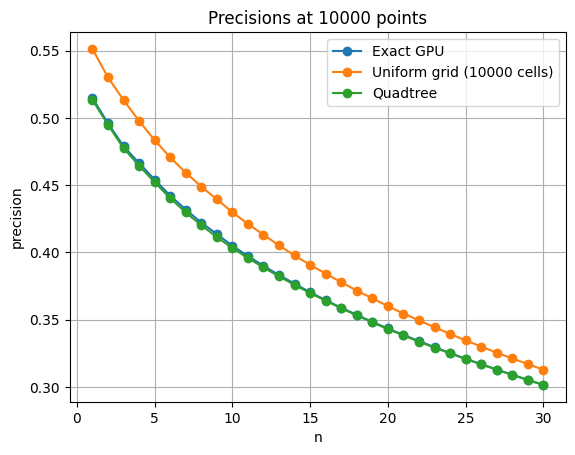

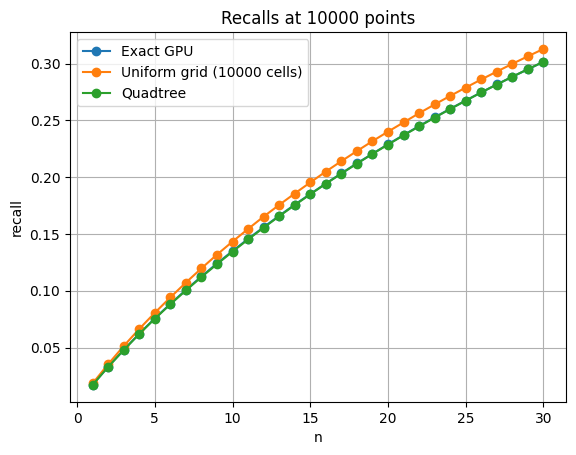

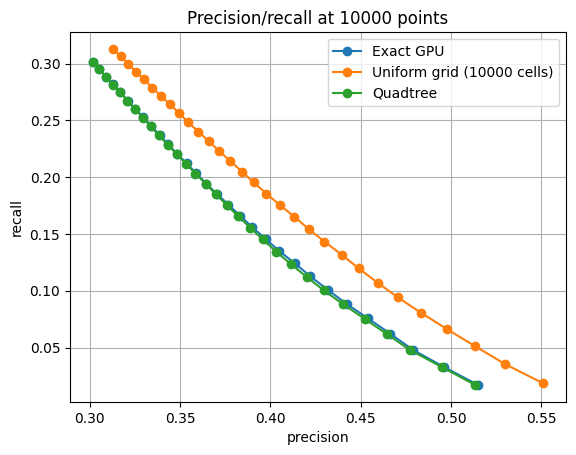

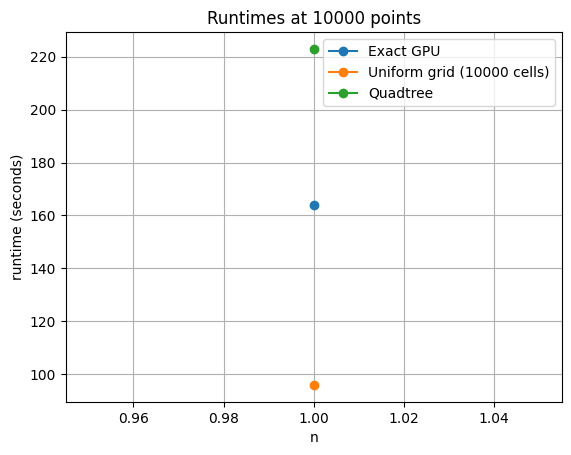

In [27]:
data = [exact_gpu_precisions[0], ugrid_gpu_precisions[0], qtree_cpu_precisions[0]]
labels = ["Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Precisions at {point_counts[0]} points", "n", "precision")

data = [exact_gpu_recalls[0], ugrid_gpu_recalls[0], qtree_cpu_recalls[0]]
labels = ["Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Recalls at {point_counts[0]} points", "n", "recall")

data = [exact_gpu_recalls[0], ugrid_gpu_recalls[0], qtree_cpu_recalls[0]]
x_axis = [exact_gpu_precisions[0], ugrid_gpu_precisions[0], qtree_cpu_precisions[0]]
labels = ["Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points_separate(data, labels, f"Precision/recall at {point_counts[0]} points", "precision", "recall", x_axis)

data = [exact_gpu_runtimes, ugrid_gpu_runtimes, qtree_cpu_runtimes]
labels = ["Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Runtimes at {point_counts[0]} points", "n", "runtime (seconds)")

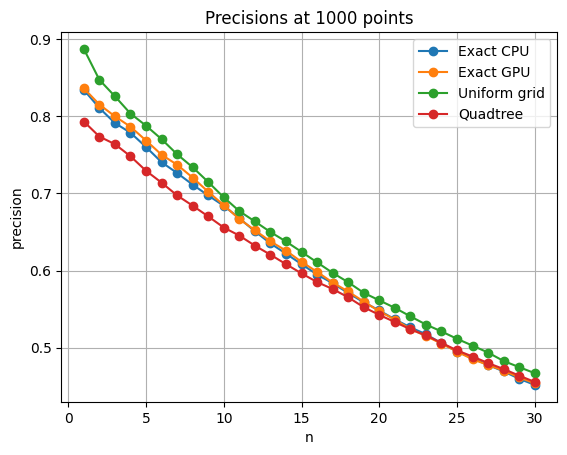

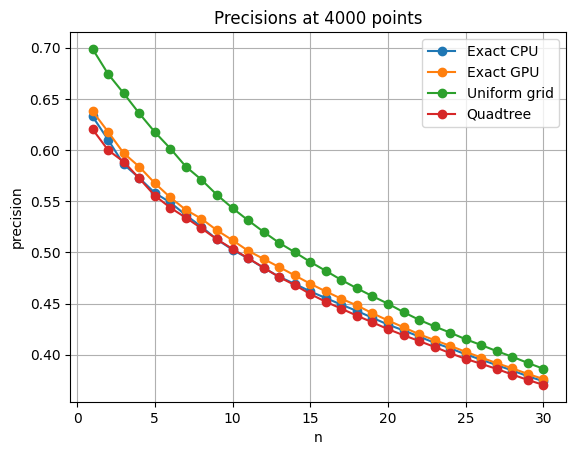

In [12]:
data = [exact_cpu_precisions[0], exact_gpu_precisions[0], ugrid_gpu_precisions[0], qtree_cpu_precisions[0]]
labels = ["Exact CPU", "Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Precisions at {point_counts[0]} points", "n", "precision")

data = [exact_cpu_precisions[1], exact_gpu_precisions[1], ugrid_gpu_precisions[1], qtree_cpu_precisions[1]]
labels = ["Exact CPU", "Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Precisions at {point_counts[1]} points", "n", "precision")

Exact CPU:
Precisions: [[0.838, 0.811, 0.7943333333333332, 0.77925, 0.7614000000000001, 0.7435, 0.7237142857142858, 0.710875, 0.6983333333333335, 0.6832999999999999, 0.6683636363636363, 0.6534166666666665, 0.6380769230769231, 0.6255, 0.6106666666666667, 0.5976875, 0.5871176470588234, 0.5768333333333333, 0.566, 0.55325, 0.5435238095238095, 0.5325454545454545, 0.5233478260869565, 0.5132083333333333, 0.504, 0.49369230769230765, 0.48566666666666664, 0.478, 0.4690689655172414, 0.4602333333333333], [0.6455, 0.61525, 0.5929166666666668, 0.578125, 0.5656, 0.5534166666666667, 0.5413214285714285, 0.529, 0.51725, 0.506275, 0.49720454545454545, 0.4886041666666667, 0.48063461538461544, 0.47280357142857143, 0.46545, 0.457734375, 0.4508529411764706, 0.4443888888888889, 0.43805263157894736, 0.43170000000000003, 0.4256428571428571, 0.4194090909090909, 0.41341304347826086, 0.4083020833333333, 0.40248, 0.39749038461538466, 0.39225925925925925, 0.3866160714285714, 0.3815948275862069, 0.3765833333333334]]


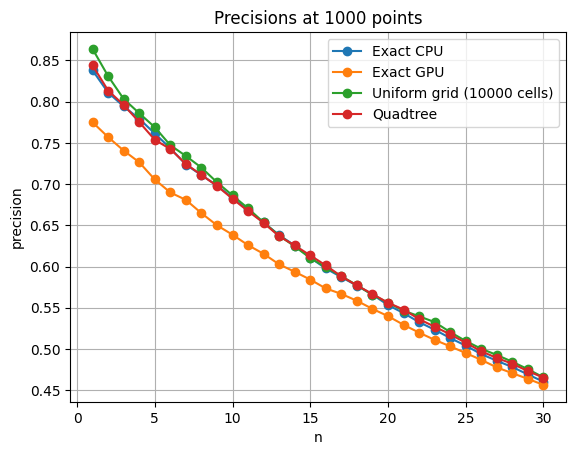

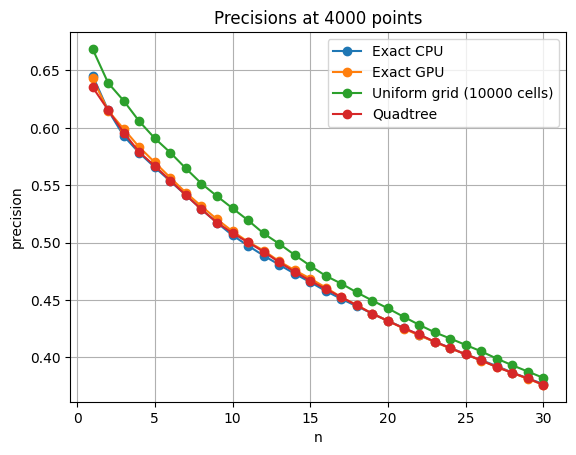

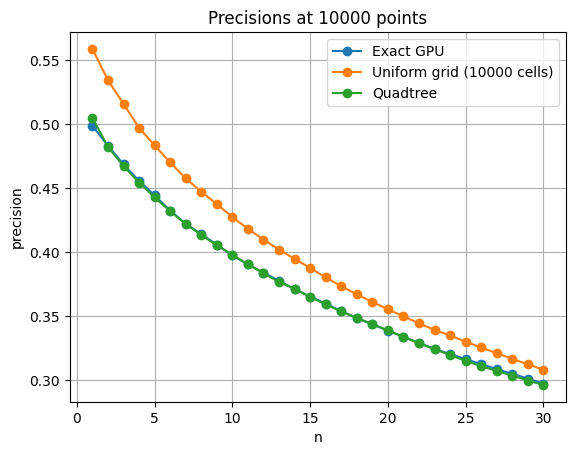

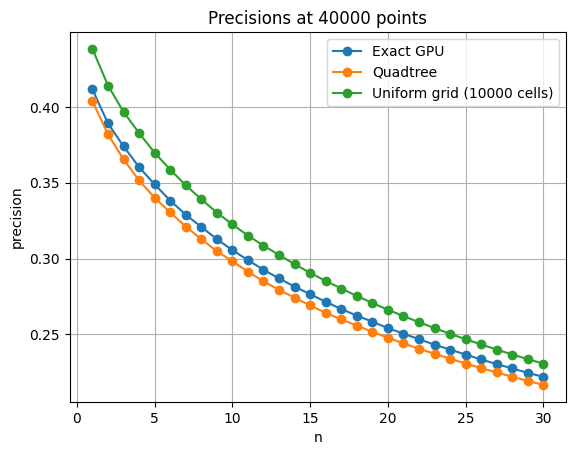

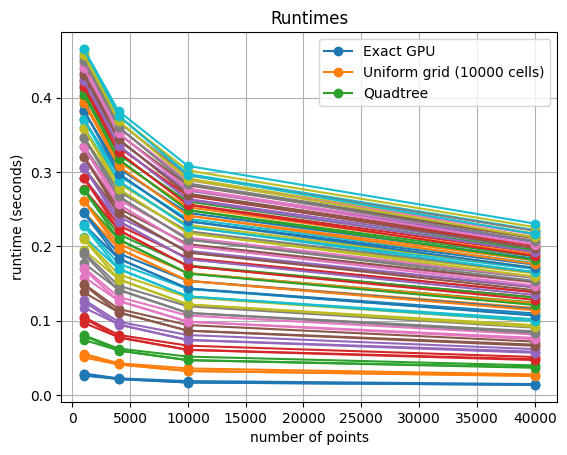

In [12]:
print("Exact CPU:")
print(f"Precisions: {exact_cpu_precisions}")
print(f"Recalls: {exact_cpu_recalls}")

print("Exact GPU:")
print(f"Precisions: {exact_gpu_precisions}")
print(f"Recalls: {exact_gpu_recalls}")
print(f"Runtimes: {exact_gpu_runtimes}")

print("Uniform grid:")
print(f"Precisions: {ugrid_gpu_precisions}")
print(f"Recalls: {ugrid_gpu_recalls}")
print(f"Runtimes: {ugrid_gpu_runtimes}")

print("Quadtree:")
print(f"Precisions: {qtree_cpu_precisions}")
print(f"Recalls: {qtree_cpu_recalls}")
print(f"Runtimes: {qtree_cpu_runtimes}")

grid_n = 100

data = [exact_cpu_precisions[0], exact_gpu_precisions[0], ugrid_gpu_precisions[0], qtree_cpu_precisions[0]]
labels = ["Exact CPU", "Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Precisions at {point_counts[0]} points", "n", "precision")

data = [exact_cpu_precisions[1], exact_gpu_precisions[1], ugrid_gpu_precisions[1], qtree_cpu_precisions[1]]
labels = ["Exact CPU", "Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Precisions at {point_counts[1]} points", "n", "precision")

data = [exact_gpu_precisions[2], ugrid_gpu_precisions[2], qtree_cpu_precisions[2]]
labels = ["Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Precisions at {point_counts[2]} points", "n", "precision")

data = [exact_gpu_precisions[3], qtree_cpu_precisions[3], ugrid_gpu_precisions[3]]
labels = ["Exact GPU", "Quadtree", f"Uniform grid ({grid_n*grid_n} cells)"]
plot_points(data, labels, f"Precisions at {point_counts[3]} points", "n", "precision")

data = [exact_gpu_runtimes, ugrid_gpu_runtimes, qtree_cpu_runtimes]
labels = ["Exact GPU", f"Uniform grid ({grid_n*grid_n} cells)", "Quadtree"]
plot_points(data, labels, f"Runtimes", "number of points", "runtime (seconds)", point_counts)

Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22820 grad_norm: 5.08749e-01: 100%|██████████| 250/250 [00:27<00:00,  8.98it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.66550 grad_norm: 3.76373e-01:  24%|██▍       | 179/750 [00:20<01:04,  8.79it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=10, seed=1] Execution time: 48.22499942779541 seconds
Precision: [0.26975, 0.259025, 0.2489, 0.2402125, 0.23323000000000002, 0.2276083333333333, 0.2223142857142857, 0.21814375, 0.21370555555555557, 0.20951999999999998, 0.20593181818181816, 0.2022875, 0.19908076923076923, 0.19608571428571428, 0.1933766666666667, 0.19088125, 0.18821764705882352, 0.18585277777777778, 0.18351052631578946, 0.1813025, 0.17905476190476188, 0.17714090909090907, 0.1752913043478261, 0.1733375, 0.17162400000000003, 0.1699576923076923, 0.1683222222222222, 0.16666964285714284, 0.16510689655172414, 0.16364166666666669], recall: [0.008991666666666665, 0.017268333333333333, 0.02489, 0.03202833333333333, 0.038871666666666665, 0.04552166666666666, 0.051873333333333334, 0.058171666666666656, 0.06411166666666666, 0.06984000000000001, 0.07550833333333333, 0.08091500000000001, 0.08626833333333332, 0.09150666666666668, 0.09668833333333335, 0.10180333333333336, 0.10665666666666668, 

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.21747 grad_norm: 5.10736e-01: 100%|██████████| 250/250 [00:26<00:00,  9.33it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.63475 grad_norm: 3.96604e-01:  24%|██▍       | 179/750 [00:19<01:03,  8.96it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=10, seed=20] Execution time: 46.78350067138672 seconds
Precision: [0.24625, 0.233725, 0.2244, 0.2173625, 0.21133000000000002, 0.20629166666666665, 0.20257142857142854, 0.19810625, 0.1943666666666667, 0.191065, 0.18788181818181815, 0.18488333333333334, 0.18228461538461538, 0.1795142857142857, 0.17729, 0.175096875, 0.17309411764705884, 0.17116944444444443, 0.16943684210526314, 0.1676725, 0.1660190476190476, 0.1645931818181818, 0.1630217391304348, 0.16162916666666666, 0.16026600000000002, 0.15886346153846154, 0.15751666666666667, 0.15622142857142857, 0.1549603448275862, 0.15366000000000005], recall: [0.008208333333333333, 0.015581666666666666, 0.022440000000000005, 0.028981666666666666, 0.03522166666666666, 0.04125833333333333, 0.047266666666666665, 0.05282833333333333, 0.05831, 0.06368833333333333, 0.06889, 0.07395333333333333, 0.07899, 0.08377333333333334, 0.088645, 0.093385, 0.09808666666666667, 0.10270166666666669, 0.10731000000000002, 0.111

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.25406 grad_norm: 5.10802e-01: 100%|██████████| 250/250 [00:31<00:00,  7.84it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.64218 grad_norm: 7.10153e-01:  25%|██▌       | 189/750 [00:23<01:10,  7.96it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=20, seed=12] Execution time: 55.639503479003906 seconds
Precision: [0.38465, 0.367025, 0.3514833333333333, 0.33885, 0.3273, 0.31701666666666667, 0.30762142857142855, 0.2999875, 0.29258333333333336, 0.28624499999999997, 0.2799954545454545, 0.2743499999999999, 0.2689153846153846, 0.2638107142857143, 0.25908333333333333, 0.254803125, 0.2504147058823529, 0.24657222222222222, 0.24277894736842104, 0.23940250000000002, 0.23612380952380954, 0.23290681818181816, 0.22995, 0.22707708333333335, 0.22431200000000004, 0.22146923076923075, 0.21873703703703704, 0.21628928571428568, 0.21370344827586205, 0.21116333333333337], recall: [0.012821666666666664, 0.02446833333333333, 0.03514833333333333, 0.04518, 0.05455, 0.06340333333333333, 0.07177833333333333, 0.07999666666666667, 0.087775, 0.09541500000000001, 0.102665, 0.10974, 0.11653, 0.12311166666666667, 0.12954166666666667, 0.13589500000000002, 0.14190166666666668, 0.14794333333333334, 0.15375999999999998, 0.

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22460 grad_norm: 5.11078e-01: 100%|██████████| 250/250 [00:28<00:00,  8.65it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.54603 grad_norm: 1.36297e+00:  28%|██▊       | 209/750 [00:24<01:03,  8.52it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=20, seed=45] Execution time: 53.44849967956543 seconds
Precision: [0.37175, 0.357075, 0.34125, 0.3289, 0.31861000000000006, 0.30995, 0.30305, 0.29543125, 0.28859444444444443, 0.28236999999999995, 0.2767363636363636, 0.271325, 0.2667038461538461, 0.26219642857142855, 0.2579633333333333, 0.253784375, 0.24966176470588233, 0.24618611111111113, 0.24278684210526316, 0.2394825, 0.23638809523809523, 0.2334681818181818, 0.2305173913043478, 0.22791666666666666, 0.22516800000000003, 0.22264038461538463, 0.22028148148148147, 0.2177035714285714, 0.2154620689655172, 0.2131883333333333], recall: [0.012391666666666667, 0.023805, 0.034125, 0.04385333333333333, 0.053101666666666665, 0.061989999999999996, 0.07071166666666667, 0.07878166666666667, 0.08657833333333333, 0.09412333333333334, 0.10147, 0.10853, 0.11557166666666667, 0.12235833333333332, 0.12898166666666666, 0.13535166666666668, 0.141475, 0.14771166666666669, 0.153765, 0.15965499999999996, 0.1654716666

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.24535 grad_norm: 5.11597e-01: 100%|██████████| 250/250 [00:35<00:00,  7.14it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.36216 grad_norm: 1.16657e+00:  35%|███▍      | 259/750 [00:33<01:04,  7.64it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=40, seed=44] Execution time: 68.97250032424927 seconds
Precision: [0.4667, 0.442625, 0.4242666666666667, 0.4081125, 0.39545, 0.3839833333333333, 0.3727071428571428, 0.36325625, 0.3544777777777778, 0.34625, 0.33886818181818174, 0.331775, 0.32509230769230774, 0.31905, 0.31296666666666667, 0.307178125, 0.3020470588235294, 0.29735277777777774, 0.29266315789473685, 0.28830750000000005, 0.2843833333333333, 0.2801863636363636, 0.27631304347826086, 0.27238541666666666, 0.26872, 0.26514615384615386, 0.26173888888888885, 0.2583214285714286, 0.2550793103448276, 0.2517333333333334], recall: [0.015556666666666667, 0.02950833333333333, 0.04242666666666667, 0.054415, 0.06590833333333333, 0.07679666666666667, 0.08696500000000001, 0.09686833333333333, 0.10634333333333335, 0.11541666666666667, 0.12425166666666666, 0.13271000000000002, 0.14087333333333335, 0.14889000000000002, 0.15648333333333334, 0.16382833333333333, 0.17116, 0.1784116666666667, 0.185353333333

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.25181 grad_norm: 5.11458e-01: 100%|██████████| 250/250 [00:36<00:00,  6.91it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.22707 grad_norm: 1.88459e-01:  39%|███▊      | 289/750 [00:38<01:01,  7.45it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=40, seed=67] Execution time: 75.01799869537354 seconds
Precision: [0.43585, 0.41435, 0.39915, 0.38505, 0.37288999999999994, 0.3619583333333333, 0.3528142857142857, 0.343775, 0.33552777777777776, 0.32902, 0.3221363636363636, 0.31592916666666665, 0.3099, 0.3043357142857143, 0.29887, 0.29384375, 0.2888029411764706, 0.2842527777777778, 0.2799842105263158, 0.2761225, 0.27213809523809523, 0.2682795454545454, 0.26478695652173917, 0.2614666666666666, 0.25844600000000006, 0.255425, 0.2525148148148148, 0.24968571428571432, 0.24684827586206898, 0.24403166666666665], recall: [0.014528333333333332, 0.02762333333333333, 0.039915000000000006, 0.05133999999999999, 0.062148333333333326, 0.07239166666666665, 0.08232333333333332, 0.09167333333333333, 0.10065833333333332, 0.10967333333333333, 0.1181166666666667, 0.1263716666666667, 0.13429000000000002, 0.14202333333333333, 0.149435, 0.15671666666666667, 0.16365500000000002, 0.17055166666666663, 0.177323333333333

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.23186 grad_norm: 5.12482e-01: 100%|██████████| 250/250 [00:43<00:00,  5.76it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.22795 grad_norm: 3.17648e-01:  40%|███▉      | 299/750 [00:44<01:06,  6.77it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=60, seed=18] Execution time: 87.60050201416016 seconds
Precision: [0.48555, 0.463525, 0.4428, 0.427025, 0.41268, 0.40022499999999994, 0.38842142857142853, 0.3786625, 0.36964444444444444, 0.36136499999999994, 0.35259090909090907, 0.34518333333333334, 0.33807692307692316, 0.33147142857142853, 0.32571333333333335, 0.320228125, 0.3146176470588235, 0.3095861111111111, 0.30492631578947366, 0.3002, 0.2953904761904762, 0.29110909090909093, 0.2868978260869565, 0.2827583333333333, 0.27894800000000003, 0.2754384615384616, 0.2719314814814815, 0.2684053571428571, 0.2649448275862069, 0.26172666666666666], recall: [0.016185, 0.03090166666666666, 0.04427999999999999, 0.05693666666666667, 0.06878000000000001, 0.080045, 0.09063166666666667, 0.10097666666666667, 0.11089333333333334, 0.12045500000000002, 0.12928333333333336, 0.13807333333333335, 0.14650000000000002, 0.15468666666666667, 0.16285666666666668, 0.17078833333333335, 0.17828333333333335, 0.18575166666

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.24564 grad_norm: 5.11405e-01: 100%|██████████| 250/250 [00:44<00:00,  5.66it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.45908 grad_norm: 2.93205e-01:  32%|███▏      | 239/750 [00:35<01:15,  6.76it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=60, seed=78] Execution time: 79.54500460624695 seconds
Precision: [0.45065, 0.427325, 0.41176666666666667, 0.3963, 0.3839, 0.37249166666666667, 0.3623, 0.3521875, 0.3440388888888889, 0.33616, 0.3292818181818181, 0.32269583333333335, 0.31671923076923075, 0.3109607142857142, 0.3054866666666667, 0.30025625, 0.29554411764705885, 0.290625, 0.28608947368421056, 0.28191750000000004, 0.277752380952381, 0.2738227272727273, 0.27001304347826083, 0.26628125, 0.262612, 0.2591807692307692, 0.2558759259259259, 0.2526375, 0.24962586206896548, 0.24663166666666667], recall: [0.015021666666666668, 0.028488333333333334, 0.04117666666666667, 0.05284, 0.06398333333333332, 0.07449833333333333, 0.08453666666666666, 0.09391666666666668, 0.10321166666666667, 0.11205333333333332, 0.12073666666666667, 0.12907833333333332, 0.13724500000000003, 0.14511500000000002, 0.15274333333333334, 0.16013666666666668, 0.167475, 0.174375, 0.18119000000000002, 0.187945, 0.1944266666666

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22130 grad_norm: 5.11868e-01: 100%|██████████| 250/250 [00:54<00:00,  4.58it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.09880 grad_norm: 4.24993e-01:  45%|████▌     | 339/750 [00:56<01:08,  6.01it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=80, seed=93] Execution time: 111.07499957084656 seconds
Precision: [0.48605, 0.462325, 0.4448333333333333, 0.4288375, 0.41555, 0.40391666666666665, 0.39324999999999993, 0.3829875, 0.37436111111111114, 0.36641500000000005, 0.358740909090909, 0.3514, 0.3449115384615385, 0.3388642857142857, 0.33276, 0.32656875, 0.3212235294117647, 0.31569444444444444, 0.31056052631578945, 0.3057175, 0.30100476190476194, 0.2966113636363636, 0.29235000000000005, 0.288225, 0.284376, 0.28055, 0.276787037037037, 0.27336785714285716, 0.27006206896551727, 0.26676166666666673], recall: [0.016201666666666666, 0.030821666666666664, 0.044483333333333326, 0.05717833333333333, 0.06925833333333334, 0.08078333333333333, 0.09175833333333333, 0.10213, 0.11230833333333334, 0.12213833333333335, 0.1315383333333333, 0.14056, 0.1494616666666667, 0.15813666666666668, 0.16638, 0.17417, 0.1820266666666667, 0.1894166666666667, 0.19668833333333335, 0.20381166666666667, 0.21070333333333338

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.25563 grad_norm: 5.10587e-01: 100%|██████████| 250/250 [00:55<00:00,  4.50it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.17911 grad_norm: 5.68168e-01:  41%|████      | 309/750 [00:51<01:12,  6.05it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=80, seed=67] Execution time: 106.65149927139282 seconds
Precision: [0.5007, 0.47765, 0.4581833333333334, 0.44295, 0.42904, 0.4155333333333333, 0.40369999999999995, 0.393, 0.38251666666666667, 0.373205, 0.36442272727272723, 0.35655416666666667, 0.3493769230769231, 0.34320357142857144, 0.33653, 0.330278125, 0.3250323529411765, 0.3196222222222222, 0.31432894736842104, 0.30958, 0.30483809523809524, 0.3001636363636364, 0.2956891304347826, 0.29157916666666667, 0.287498, 0.2832057692307693, 0.2794574074074074, 0.2756714285714285, 0.2720844827586207, 0.26864], recall: [0.01669, 0.03184333333333333, 0.04581833333333333, 0.05905999999999999, 0.07150666666666666, 0.08310666666666669, 0.09419666666666666, 0.1048, 0.11475500000000002, 0.12440166666666666, 0.1336216666666667, 0.14262166666666667, 0.15139666666666668, 0.16016166666666667, 0.168265, 0.17614833333333335, 0.184185, 0.19177333333333332, 0.19907500000000003, 0.2063866666666667, 0.213386666666666

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22208 grad_norm: 5.12773e-01: 100%|██████████| 250/250 [01:01<00:00,  4.04it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.15665 grad_norm: 4.02112e-01:  43%|████▎     | 319/750 [00:54<01:13,  5.89it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=100, seed=18] Execution time: 115.99400353431702 seconds
Precision: [0.49825, 0.47375, 0.4556666666666667, 0.439775, 0.42722, 0.41411666666666663, 0.4029357142857143, 0.3928875, 0.38319999999999993, 0.374295, 0.3664772727272727, 0.3586, 0.35177307692307697, 0.34475, 0.33849666666666667, 0.33231875, 0.3267382352941176, 0.32126388888888885, 0.3160894736842105, 0.31121, 0.3065333333333333, 0.3018636363636363, 0.2973391304347826, 0.2929458333333333, 0.2888760000000001, 0.2848519230769231, 0.28100925925925924, 0.2771160714285714, 0.27363793103448275, 0.27014333333333335], recall: [0.016608333333333333, 0.03158333333333333, 0.04556666666666667, 0.058636666666666656, 0.07120333333333334, 0.08282333333333333, 0.09401833333333334, 0.10477, 0.11495999999999999, 0.12476500000000001, 0.13437500000000002, 0.14344, 0.15243500000000004, 0.16088333333333335, 0.16924833333333333, 0.17723666666666668, 0.18515166666666666, 0.19275833333333334, 0.20019, 0.207473

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22543 grad_norm: 5.12373e-01: 100%|██████████| 250/250 [01:04<00:00,  3.90it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.26989 grad_norm: 4.12505e-01:  39%|███▊      | 289/750 [00:49<01:18,  5.85it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=100, seed=78] Execution time: 113.46449875831604 seconds
Precision: [0.47325, 0.4542, 0.43475, 0.4183625, 0.40608, 0.39344999999999997, 0.3826285714285714, 0.3733125, 0.3648055555555555, 0.3565, 0.3485636363636363, 0.3412333333333334, 0.3348038461538462, 0.3283285714285714, 0.32231333333333334, 0.316725, 0.3116323529411764, 0.3064666666666667, 0.30135, 0.2968075, 0.29235, 0.2878068181818182, 0.28385652173913045, 0.27988541666666666, 0.27627999999999997, 0.2727288461538461, 0.2694111111111111, 0.26602857142857145, 0.2626086206896552, 0.25933999999999996], recall: [0.015775, 0.030279999999999994, 0.043475, 0.05578166666666666, 0.06768, 0.07869, 0.08928000000000001, 0.09955, 0.10944166666666667, 0.11883333333333335, 0.12780666666666665, 0.13649333333333333, 0.1450816666666667, 0.15322, 0.16115666666666667, 0.16892000000000001, 0.1765916666666667, 0.18388, 0.19085500000000002, 0.1978716666666667, 0.20464500000000002, 0.21105833333333335, 0.217623

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22414 grad_norm: 5.11938e-01: 100%|██████████| 250/250 [01:17<00:00,  3.23it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.23471 grad_norm: 5.22327e-01:  40%|███▉      | 299/750 [00:53<01:20,  5.61it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=120, seed=93] Execution time: 130.78550100326538 seconds
Precision: [0.472, 0.456325, 0.4392, 0.4238625, 0.41001000000000004, 0.3985083333333333, 0.3877642857142857, 0.37736875, 0.36798333333333333, 0.35995, 0.3524909090909091, 0.34549583333333334, 0.339, 0.33325357142857137, 0.32728333333333337, 0.321621875, 0.3161617647058823, 0.31073055555555557, 0.3058736842105263, 0.3011325, 0.2965809523809524, 0.2923818181818182, 0.2883130434782609, 0.2843708333333333, 0.28050600000000003, 0.2769634615384616, 0.27339814814814817, 0.2699589285714286, 0.26652586206896556, 0.26326166666666667], recall: [0.015733333333333332, 0.030421666666666663, 0.043919999999999994, 0.056514999999999996, 0.06833499999999999, 0.07970166666666666, 0.09047833333333334, 0.10063166666666667, 0.11039500000000001, 0.11998333333333334, 0.12924666666666668, 0.13819833333333337, 0.14690000000000003, 0.15551833333333334, 0.16364166666666669, 0.1715316666666667, 0.17915833333333334,

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.25066 grad_norm: 5.11290e-01: 100%|██████████| 250/250 [01:19<00:00,  3.14it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.74836 grad_norm: 4.71961e-02:  23%|██▎       | 169/750 [00:30<01:44,  5.54it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=120, seed=67] Execution time: 110.18350219726562 seconds
Precision: [0.4582, 0.43575, 0.4178166666666666, 0.402575, 0.38899, 0.37623333333333336, 0.3656, 0.35648125, 0.34781111111111107, 0.34010999999999997, 0.3325318181818181, 0.325725, 0.31907692307692315, 0.3132285714285714, 0.3075366666666667, 0.3021125, 0.29667941176470586, 0.2917694444444444, 0.28684473684210526, 0.28235, 0.27792619047619044, 0.2740090909090909, 0.2699913043478261, 0.26620000000000005, 0.262902, 0.259225, 0.25604074074074074, 0.2527857142857142, 0.24972241379310345, 0.24652833333333332], recall: [0.015273333333333331, 0.029049999999999996, 0.04178166666666666, 0.053676666666666664, 0.06483166666666666, 0.07524666666666664, 0.08530666666666666, 0.09506166666666668, 0.10434333333333334, 0.11337, 0.12192833333333333, 0.13029, 0.13826666666666668, 0.14617333333333332, 0.15376833333333334, 0.1611266666666667, 0.16811833333333334, 0.17506166666666664, 0.18166833333333335, 0.1

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22375 grad_norm: 5.13161e-01: 100%|██████████| 250/250 [01:27<00:00,  2.87it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.13264 grad_norm: 4.53679e-01:  44%|████▍     | 329/750 [01:01<01:19,  5.32it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=140, seed=18] Execution time: 148.9989995956421 seconds
Precision: [0.4917, 0.4719, 0.4569333333333333, 0.4431625, 0.42938000000000004, 0.4172333333333333, 0.40654285714285715, 0.3971875, 0.38773888888888886, 0.37973500000000004, 0.371090909090909, 0.3635333333333334, 0.3564615384615385, 0.34988214285714286, 0.3438366666666667, 0.33791875, 0.3323029411764706, 0.3267527777777778, 0.3216105263157894, 0.3167625, 0.31175476190476187, 0.3071545454545455, 0.30284565217391307, 0.2984229166666667, 0.29412800000000006, 0.2900692307692308, 0.2861037037037037, 0.2824464285714286, 0.27876724137931036, 0.2752166666666666], recall: [0.01639, 0.03146, 0.04569333333333333, 0.05908833333333333, 0.07156333333333333, 0.08344666666666667, 0.09486000000000001, 0.10591666666666667, 0.11632166666666667, 0.12657833333333332, 0.13606666666666667, 0.1454133333333333, 0.15446666666666667, 0.1632783333333334, 0.17191833333333334, 0.18022333333333335, 0.18830500000000003

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22859 grad_norm: 5.11411e-01: 100%|██████████| 250/250 [01:32<00:00,  2.69it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.23745 grad_norm: 8.79471e-01:  40%|███▉      | 299/750 [00:59<01:29,  5.07it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=140, seed=78] Execution time: 151.8904993534088 seconds
Precision: [0.48725, 0.467075, 0.4511833333333333, 0.433125, 0.41939000000000004, 0.40660833333333335, 0.3955, 0.3852125, 0.37601111111111113, 0.367145, 0.3589954545454545, 0.3516875, 0.34416153846153846, 0.33764285714285713, 0.3313666666666667, 0.32550625, 0.3200529411764706, 0.3148027777777778, 0.30971315789473686, 0.3048475, 0.30021666666666663, 0.29579545454545453, 0.2914369565217391, 0.28701458333333335, 0.283034, 0.27915, 0.2753222222222222, 0.2718232142857143, 0.26830344827586206, 0.26479833333333336], recall: [0.016241666666666668, 0.031138333333333334, 0.04511833333333333, 0.05774999999999999, 0.06989833333333333, 0.08132166666666667, 0.09228333333333334, 0.10272333333333333, 0.11280333333333332, 0.12238166666666668, 0.13163166666666667, 0.14067500000000002, 0.14913666666666667, 0.15756666666666666, 0.16568333333333335, 0.17360333333333333, 0.18136333333333335, 0.188881666666666

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.21702 grad_norm: 5.11614e-01: 100%|██████████| 250/250 [01:47<00:00,  2.32it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.90238 grad_norm: 1.08449e-01:  19%|█▊        | 139/750 [00:28<02:06,  4.83it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=160, seed=93] Execution time: 136.3970010280609 seconds
Precision: [0.4629, 0.434625, 0.4150166666666666, 0.3982375, 0.38364000000000004, 0.3727583333333333, 0.36280714285714283, 0.3531875, 0.3448222222222222, 0.337615, 0.33009999999999995, 0.3229083333333334, 0.31667307692307695, 0.3109714285714285, 0.3052533333333333, 0.299953125, 0.295035294117647, 0.2901138888888889, 0.28533157894736844, 0.2809475, 0.2766833333333334, 0.2726363636363636, 0.2686782608695652, 0.26479374999999994, 0.261306, 0.2577211538461539, 0.2543166666666667, 0.2510517857142857, 0.2476655172413793, 0.24463000000000001], recall: [0.015429999999999998, 0.028975, 0.041501666666666666, 0.05309833333333334, 0.06393999999999998, 0.07455166666666667, 0.084655, 0.09418333333333335, 0.10344666666666667, 0.11253833333333334, 0.12103666666666668, 0.12916333333333335, 0.137225, 0.14512, 0.15262666666666666, 0.15997500000000003, 0.16718666666666668, 0.17406833333333335, 0.18070999999

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.25589 grad_norm: 5.10514e-01: 100%|██████████| 250/250 [01:52<00:00,  2.23it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.12227 grad_norm: 9.89324e-01:  44%|████▍     | 329/750 [01:06<01:24,  4.98it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=160, seed=67] Execution time: 178.38549613952637 seconds
Precision: [0.50395, 0.481175, 0.4633166666666666, 0.4471, 0.4338700000000001, 0.4214666666666667, 0.41069285714285714, 0.39961875, 0.38996666666666663, 0.38126, 0.3728999999999999, 0.3651583333333333, 0.3579653846153847, 0.35120714285714283, 0.3446666666666667, 0.338403125, 0.33250294117647056, 0.3270138888888889, 0.32162894736842107, 0.31650750000000005, 0.31148095238095236, 0.3065363636363636, 0.3017978260869565, 0.2975458333333333, 0.293254, 0.2893826923076923, 0.28533148148148146, 0.2816607142857143, 0.27803620689655173, 0.27455166666666675], recall: [0.016798333333333332, 0.032078333333333334, 0.04633166666666666, 0.059613333333333324, 0.07231166666666666, 0.08429333333333335, 0.09582833333333333, 0.10656500000000001, 0.11699000000000001, 0.12708666666666668, 0.13673000000000002, 0.14606333333333338, 0.15511833333333333, 0.16389666666666666, 0.17233333333333334, 0.1804816666666666

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.21844 grad_norm: 5.11970e-01: 100%|██████████| 250/250 [01:51<00:00,  2.23it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.16077 grad_norm: 3.72583e-01:  43%|████▎     | 319/750 [01:07<01:31,  4.72it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=180, seed=18] Execution time: 179.4040014743805 seconds
Precision: [0.5027, 0.4833, 0.4635833333333333, 0.44755, 0.43309, 0.420275, 0.40959285714285715, 0.39874375, 0.38917777777777773, 0.380605, 0.37247727272727266, 0.36490833333333333, 0.3579384615384616, 0.35114285714285715, 0.3447033333333333, 0.338446875, 0.3325882352941177, 0.3270583333333333, 0.32168421052631585, 0.316855, 0.31197619047619046, 0.30705454545454547, 0.3025152173913043, 0.2981270833333334, 0.293866, 0.28966538461538466, 0.28582407407407406, 0.28185535714285714, 0.27801551724137935, 0.27432666666666666], recall: [0.016756666666666666, 0.03222, 0.046358333333333335, 0.059673333333333335, 0.07218166666666666, 0.08405499999999999, 0.09557166666666667, 0.10633166666666669, 0.11675333333333333, 0.12686833333333333, 0.136575, 0.14596333333333336, 0.15510666666666667, 0.16386666666666666, 0.17235166666666665, 0.180505, 0.18846666666666667, 0.196235, 0.20373333333333335, 0.2112366

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22785 grad_norm: 5.11014e-01: 100%|██████████| 250/250 [01:55<00:00,  2.17it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.24412 grad_norm: 7.08803e-01:  40%|███▉      | 299/750 [01:04<01:37,  4.61it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=180, seed=78] Execution time: 180.23950028419495 seconds
Precision: [0.48205, 0.46025, 0.443, 0.4288, 0.4146, 0.4018083333333333, 0.39152142857142863, 0.3812375, 0.3726555555555556, 0.36386999999999997, 0.35615909090909087, 0.3487166666666667, 0.34170000000000006, 0.3350285714285714, 0.32891333333333334, 0.323228125, 0.31785882352941175, 0.3126444444444445, 0.30788947368421055, 0.30299750000000003, 0.29849761904761907, 0.2942772727272727, 0.2899782608695652, 0.2859291666666667, 0.28214000000000006, 0.2782788461538461, 0.2747685185185185, 0.27132857142857136, 0.2677103448275862, 0.26430666666666663], recall: [0.01606833333333333, 0.03068333333333333, 0.0443, 0.05717333333333333, 0.0691, 0.08036166666666668, 0.091355, 0.10166333333333334, 0.11179666666666667, 0.12129000000000001, 0.1305916666666667, 0.13948666666666668, 0.14807, 0.15634666666666666, 0.16445666666666667, 0.1723883333333333, 0.18012, 0.18758666666666668, 0.19499666666666668, 0.20

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22046 grad_norm: 5.10874e-01: 100%|██████████| 250/250 [02:07<00:00,  1.95it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.10497 grad_norm: 3.80565e-01:  45%|████▌     | 339/750 [01:17<01:34,  4.37it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=200, seed=93] Execution time: 205.5800004005432 seconds
Precision: [0.47625, 0.458775, 0.4417666666666666, 0.4265125, 0.41383000000000003, 0.4022333333333333, 0.3916285714285714, 0.38175625, 0.37325, 0.36529, 0.3583272727272726, 0.35157499999999997, 0.3452576923076923, 0.3391642857142857, 0.3336233333333334, 0.327840625, 0.32285294117647056, 0.3179472222222222, 0.3131684210526316, 0.30829249999999997, 0.3039928571428571, 0.29958863636363636, 0.2953260869565217, 0.2913229166666667, 0.28768200000000005, 0.2838653846153847, 0.2801685185185185, 0.27645714285714285, 0.2728517241379311, 0.2695133333333333], recall: [0.015875, 0.030584999999999998, 0.04417666666666666, 0.056868333333333326, 0.06897166666666667, 0.08044666666666667, 0.09137999999999999, 0.1018016666666667, 0.111975, 0.12176333333333335, 0.13138666666666668, 0.14063, 0.14961166666666667, 0.15827666666666668, 0.1668116666666667, 0.17484833333333336, 0.18295000000000003, 0.1907683333333

c:\Git\hyperbolic-tsne\hyperbolicTSNE\visualization.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()
C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.25191 grad_norm: 5.10725e-01: 100%|██████████| 250/250 [02:09<00:00,  1.93it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.30199 grad_norm: 3.53168e-01:  37%|███▋      | 279/750 [01:03<01:47,  4.38it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=200, seed=67] Execution time: 193.0080029964447 seconds
Precision: [0.48485, 0.45905, 0.4431333333333333, 0.4256125, 0.41286999999999996, 0.401, 0.39007142857142857, 0.38086875, 0.37211111111111106, 0.363755, 0.35589999999999994, 0.3485916666666667, 0.34151923076923074, 0.3352392857142857, 0.32936333333333334, 0.32376875, 0.31859999999999994, 0.3136583333333334, 0.30853421052631574, 0.30389, 0.2995523809523809, 0.29517954545454544, 0.2909608695652174, 0.28686875, 0.28291200000000005, 0.27904230769230765, 0.2754925925925926, 0.2718839285714286, 0.268348275862069, 0.2649383333333334], recall: [0.016161666666666668, 0.03060333333333333, 0.04431333333333333, 0.056748333333333324, 0.06881166666666666, 0.0802, 0.09101666666666668, 0.101565, 0.11163333333333335, 0.12125166666666666, 0.1304966666666667, 0.13943666666666665, 0.1479916666666667, 0.15644499999999997, 0.16468166666666667, 0.1726766666666667, 0.18054, 0.188195, 0.19540499999999997, 0.2025

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.21909 grad_norm: 5.12386e-01: 100%|██████████| 250/250 [02:16<00:00,  1.83it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.16668 grad_norm: 4.48554e-01:  43%|████▎     | 319/750 [01:13<01:39,  4.34it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=220, seed=18] Execution time: 210.5629997253418 seconds
Precision: [0.49455, 0.472425, 0.4548166666666666, 0.439275, 0.42488000000000004, 0.4136666666666667, 0.4025357142857143, 0.39239375, 0.3829944444444444, 0.374725, 0.3665045454545454, 0.35911666666666664, 0.35222307692307697, 0.34610357142857145, 0.34020333333333336, 0.334265625, 0.3285176470588235, 0.3232027777777778, 0.3179763157894737, 0.31302, 0.3082190476190476, 0.3033772727272727, 0.29863260869565217, 0.29435, 0.2902200000000001, 0.2862192307692308, 0.2822444444444444, 0.2784589285714286, 0.27487758620689656, 0.2714383333333334], recall: [0.016485, 0.031495, 0.04548166666666666, 0.05856999999999999, 0.07081333333333334, 0.08273333333333334, 0.093925, 0.10463833333333335, 0.11489833333333334, 0.12490833333333334, 0.134385, 0.14364666666666667, 0.15263, 0.16151500000000002, 0.17010166666666668, 0.17827500000000002, 0.18616, 0.19392166666666666, 0.20138500000000004, 0.20868, 0.2157533

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.23158 grad_norm: 5.11491e-01: 100%|██████████| 250/250 [02:19<00:00,  1.79it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.28005 grad_norm: 8.06916e-01:  39%|███▊      | 289/750 [01:07<01:47,  4.30it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=220, seed=78] Execution time: 207.01697945594788 seconds
Precision: [0.48975, 0.468525, 0.45095, 0.433575, 0.41878000000000004, 0.4047916666666667, 0.39365, 0.38333125, 0.37365, 0.364625, 0.35635909090909085, 0.3486916666666667, 0.3418615384615385, 0.3353035714285714, 0.32933, 0.323709375, 0.3180441176470588, 0.31298888888888887, 0.3080131578947368, 0.3032125, 0.2986642857142857, 0.29432272727272724, 0.2900978260869566, 0.28590208333333333, 0.28219000000000005, 0.27847115384615384, 0.27463518518518515, 0.2710464285714286, 0.2674241379310345, 0.2640633333333333], recall: [0.016325, 0.031235000000000002, 0.045094999999999996, 0.05780999999999999, 0.06979666666666667, 0.08095833333333333, 0.09185166666666666, 0.10222166666666667, 0.112095, 0.12154166666666665, 0.130665, 0.1394766666666667, 0.14814000000000002, 0.15647500000000003, 0.164665, 0.17264500000000002, 0.180225, 0.18779333333333334, 0.19507500000000003, 0.20214166666666666, 0.209065, 0.

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.21457 grad_norm: 5.11764e-01: 100%|██████████| 250/250 [02:31<00:00,  1.65it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.21079 grad_norm: 4.19602e-01:  41%|████      | 309/750 [01:16<01:49,  4.02it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=240, seed=93] Execution time: 228.5914990901947 seconds
Precision: [0.4736, 0.4509, 0.4329666666666667, 0.41835, 0.40608, 0.3942583333333333, 0.3835357142857142, 0.37418125, 0.3651333333333333, 0.35777, 0.3504318181818182, 0.3435833333333333, 0.3371576923076924, 0.331275, 0.3258033333333333, 0.320309375, 0.31543529411764704, 0.3106333333333333, 0.3057447368421052, 0.3011849999999999, 0.2968190476190476, 0.2926477272727273, 0.28870434782608695, 0.2848020833333333, 0.28111800000000003, 0.2776480769230769, 0.27391481481481483, 0.27050892857142855, 0.26715862068965524, 0.263945], recall: [0.015786666666666664, 0.030059999999999996, 0.043296666666666664, 0.055779999999999996, 0.06767999999999999, 0.07885166666666667, 0.08949166666666668, 0.09978166666666669, 0.10954000000000001, 0.11925666666666668, 0.1284916666666667, 0.13743333333333332, 0.14610166666666669, 0.15459500000000004, 0.16290166666666664, 0.1708316666666667, 0.17874666666666666, 0.186

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.25107 grad_norm: 5.11215e-01: 100%|██████████| 250/250 [02:36<00:00,  1.60it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.14874 grad_norm: 4.54743e-01:  43%|████▎     | 319/750 [01:19<01:47,  4.03it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=240, seed=67] Execution time: 235.83650016784668 seconds
Precision: [0.50175, 0.477325, 0.4586666666666666, 0.4441375, 0.43073999999999996, 0.41831666666666667, 0.4074285714285714, 0.39655, 0.3869222222222222, 0.37888499999999997, 0.37083181818181815, 0.3631, 0.35619615384615383, 0.3496642857142857, 0.3431633333333334, 0.336915625, 0.33108529411764703, 0.325575, 0.3202973684210526, 0.31519250000000004, 0.3101690476190476, 0.30547272727272723, 0.3009869565217391, 0.2966666666666667, 0.29248, 0.2883596153846154, 0.2845333333333333, 0.2809178571428571, 0.27717931034482757, 0.273685], recall: [0.016725, 0.031821666666666665, 0.04586666666666666, 0.05921833333333333, 0.07179, 0.08366333333333333, 0.09506666666666667, 0.10574666666666667, 0.11607666666666669, 0.12629500000000002, 0.13597166666666666, 0.14524, 0.1543516666666667, 0.1631766666666667, 0.1715816666666667, 0.17968833333333337, 0.187615, 0.195345, 0.202855, 0.21012833333333333, 0.2171183

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22066 grad_norm: 5.11702e-01: 100%|██████████| 250/250 [02:40<00:00,  1.56it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.13881 grad_norm: 8.03084e-01:  44%|████▍     | 329/750 [01:23<01:46,  3.96it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=260, seed=18] Execution time: 243.62349772453308 seconds
Precision: [0.49145, 0.47235, 0.4536499999999999, 0.4394125, 0.42691, 0.414525, 0.40334285714285717, 0.39375625, 0.38445555555555555, 0.37667, 0.3682499999999999, 0.3606, 0.35337692307692303, 0.3467821428571428, 0.34060333333333337, 0.334490625, 0.3289264705882352, 0.3231916666666667, 0.31794210526315786, 0.3130875, 0.30832380952380956, 0.3038295454545454, 0.2993565217391305, 0.2948333333333333, 0.29081000000000007, 0.2870807692307692, 0.2833018518518518, 0.27969285714285713, 0.2762086206896552, 0.27263000000000004], recall: [0.016381666666666662, 0.03149, 0.04536499999999999, 0.05858833333333333, 0.07115166666666667, 0.08290499999999999, 0.09411333333333334, 0.10500166666666669, 0.11533666666666668, 0.12555666666666668, 0.135025, 0.14424, 0.15313000000000002, 0.16183166666666665, 0.17030166666666668, 0.17839500000000003, 0.18639166666666668, 0.193915, 0.20136333333333334, 0.208725, 0.2

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22389 grad_norm: 5.11824e-01: 100%|██████████| 250/250 [02:43<00:00,  1.53it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.24674 grad_norm: 6.37298e-01:  40%|███▉      | 299/750 [01:17<01:56,  3.86it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=260, seed=78] Execution time: 240.8210027217865 seconds
Precision: [0.4896, 0.464125, 0.44475, 0.428575, 0.41461000000000003, 0.401625, 0.39092142857142853, 0.37994375, 0.3706611111111111, 0.36249, 0.3547545454545454, 0.3479041666666666, 0.3410153846153846, 0.334325, 0.3279666666666667, 0.32228125, 0.31676176470588235, 0.31177499999999997, 0.30680789473684206, 0.30219750000000006, 0.29769047619047617, 0.2933454545454546, 0.28933695652173913, 0.28535, 0.2815120000000001, 0.2777903846153847, 0.27423148148148146, 0.2707517857142857, 0.26737413793103443, 0.26422666666666667], recall: [0.016319999999999998, 0.030941666666666662, 0.044475, 0.05714333333333333, 0.06910166666666666, 0.08032500000000001, 0.091215, 0.10131833333333333, 0.11119833333333333, 0.12083000000000002, 0.13007666666666667, 0.13916166666666668, 0.14777333333333337, 0.15601833333333334, 0.16398333333333334, 0.17188333333333336, 0.17949833333333334, 0.187065, 0.1943116666666667, 0

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.21327 grad_norm: 5.12451e-01: 100%|██████████| 250/250 [02:56<00:00,  1.42it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.14865 grad_norm: 8.03823e-01:  44%|████▍     | 329/750 [01:28<01:53,  3.71it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=280, seed=93] Execution time: 264.881498336792 seconds
Precision: [0.4747, 0.4534, 0.4354, 0.421825, 0.40931000000000006, 0.3976583333333333, 0.3869714285714285, 0.37754375, 0.3687944444444444, 0.360965, 0.3536999999999999, 0.3469375, 0.34035, 0.3343214285714286, 0.3285066666666667, 0.3229875, 0.31794117647058817, 0.3128833333333333, 0.30829736842105265, 0.30362, 0.29922380952380945, 0.2951295454545454, 0.29108695652173916, 0.2871125, 0.283394, 0.2795711538461539, 0.27603518518518516, 0.2724196428571428, 0.269103448275862, 0.2659833333333333], recall: [0.015823333333333335, 0.030226666666666666, 0.043539999999999995, 0.056243333333333326, 0.06821833333333333, 0.07953166666666667, 0.09029333333333334, 0.10067833333333336, 0.11063833333333334, 0.12032166666666667, 0.12969, 0.138775, 0.14748499999999998, 0.15601666666666666, 0.16425333333333336, 0.17226, 0.18016666666666664, 0.18773, 0.19525499999999998, 0.20241333333333333, 0.20945666666666665,

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.25324 grad_norm: 5.11255e-01: 100%|██████████| 250/250 [03:01<00:00,  1.38it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.12127 grad_norm: 3.80784e-01:  44%|████▍     | 329/750 [01:27<01:52,  3.74it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=280, seed=67] Execution time: 269.21348214149475 seconds
Precision: [0.49015, 0.469975, 0.4532666666666667, 0.4385875, 0.4247, 0.4123083333333333, 0.40127142857142856, 0.390625, 0.3817222222222222, 0.373425, 0.36545909090909084, 0.3576166666666667, 0.35043846153846164, 0.34383928571428574, 0.3377633333333333, 0.331740625, 0.3258941176470588, 0.320225, 0.31513157894736843, 0.31022, 0.305452380952381, 0.301, 0.2964195652173913, 0.29199583333333334, 0.28790200000000005, 0.2839865384615385, 0.2804203703703703, 0.27670535714285716, 0.2731896551724138, 0.26971833333333334], recall: [0.016338333333333333, 0.03133166666666666, 0.04532666666666667, 0.058478333333333334, 0.07078333333333332, 0.08246166666666666, 0.09363, 0.10416666666666667, 0.11451666666666667, 0.124475, 0.13400166666666669, 0.14304666666666668, 0.1518566666666667, 0.16045833333333334, 0.16888166666666665, 0.17692833333333333, 0.18467333333333333, 0.192135, 0.19958333333333333, 0.2068

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22425 grad_norm: 5.12036e-01: 100%|██████████| 250/250 [03:05<00:00,  1.35it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.10250 grad_norm: 6.83444e-01:  45%|████▌     | 339/750 [01:32<01:52,  3.66it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=300, seed=18] Execution time: 278.06700253486633 seconds
Precision: [0.4932, 0.470325, 0.4546666666666667, 0.43815, 0.42341000000000006, 0.41148333333333337, 0.40078571428571425, 0.3918875, 0.3834611111111111, 0.375545, 0.3681818181818181, 0.3612083333333333, 0.3542153846153846, 0.34788214285714286, 0.34176, 0.335628125, 0.33034117647058825, 0.3249944444444444, 0.31967631578947364, 0.3145675, 0.3096785714285714, 0.3053954545454545, 0.3010804347826087, 0.2969145833333333, 0.293032, 0.28906923076923075, 0.28525185185185187, 0.2815303571428572, 0.2779068965517241, 0.2744083333333334], recall: [0.01644, 0.031355, 0.04546666666666667, 0.05841999999999999, 0.07056833333333333, 0.08229666666666667, 0.09351666666666668, 0.10450333333333334, 0.11503833333333334, 0.12518166666666666, 0.135, 0.14448333333333335, 0.15349333333333337, 0.162345, 0.17088, 0.1790016666666667, 0.18719333333333335, 0.19499666666666668, 0.20246166666666668, 0.20971166666666669,

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


Loading data
Data loading: 0.0 seconds
Please note that `empty_sequence` uses the KL divergence with Barnes-Hut approximation (angle=0.5) by default.
[HyperbolicTSNE] Received iterable as input. It should have len=2 and contain (D=None, V=None)
[hd_mat] Warning: There is nothing to do with given parameters. Returning given D and V


Gradient Descent error: 113.22891 grad_norm: 5.11678e-01: 100%|██████████| 250/250 [03:08<00:00,  1.33it/s]                                                                                                                                                                                                                                                                                                                
Gradient Descent error: 5.25507 grad_norm: 4.82866e-01:  40%|███▉      | 299/750 [01:22<02:04,  3.61it/s]                                                                                                                                                                                                                                                                                                                  


4
[UGrid, d=Datasets.MNIST, n=20000, grid_n=300, seed=78] Execution time: 271.3330023288727 seconds
Precision: [0.46555, 0.4446, 0.4308, 0.4160375, 0.40247000000000005, 0.3912083333333333, 0.38083571428571433, 0.371875, 0.36257222222222224, 0.35528499999999996, 0.3477954545454545, 0.3414333333333333, 0.33514230769230774, 0.328975, 0.32359333333333334, 0.318259375, 0.312735294117647, 0.30778055555555556, 0.30314210526315793, 0.2984675, 0.29417380952380956, 0.2897977272727272, 0.2859586956521739, 0.28210625, 0.27861600000000003, 0.27498461538461544, 0.27154074074074075, 0.2680446428571429, 0.26468965517241383, 0.26138333333333336], recall: [0.01551833333333333, 0.029639999999999996, 0.04307999999999999, 0.055471666666666655, 0.06707833333333334, 0.07824166666666665, 0.08886166666666666, 0.09916666666666668, 0.10877166666666667, 0.11842833333333333, 0.12752500000000003, 0.13657333333333332, 0.14522833333333332, 0.15352166666666667, 0.16179666666666667, 0.16973833333333335, 0.1772166666666

C:\Users\Milan\AppData\Local\Temp\ipykernel_1648\1815322067.py:147: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


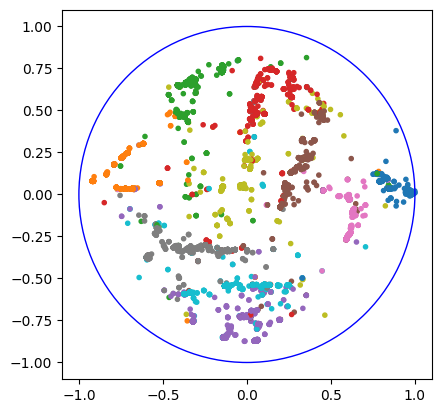

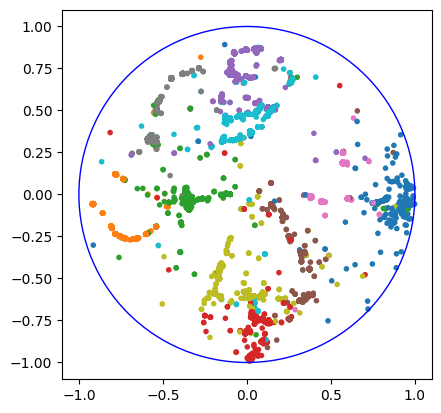

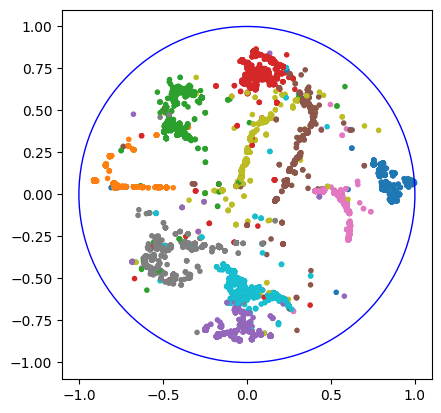

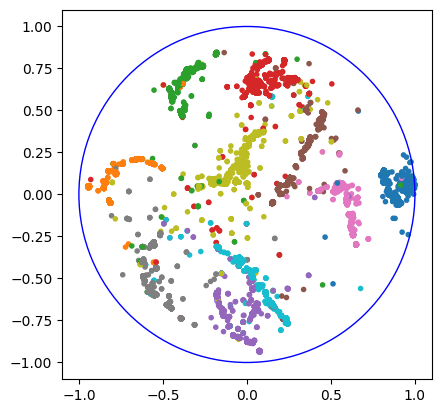

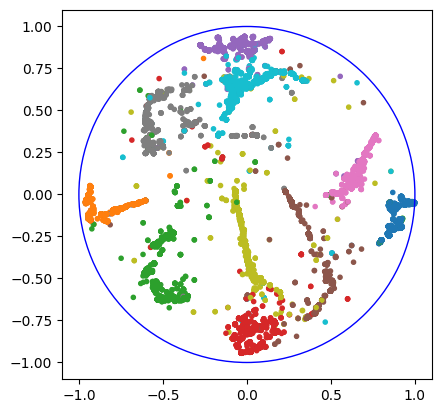

...

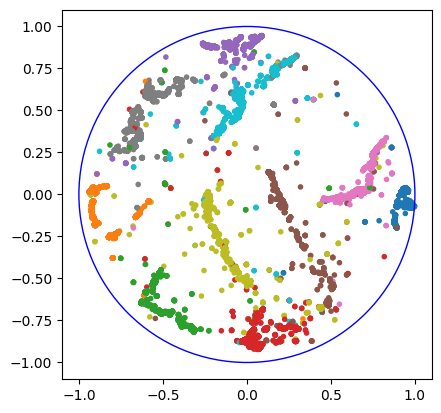

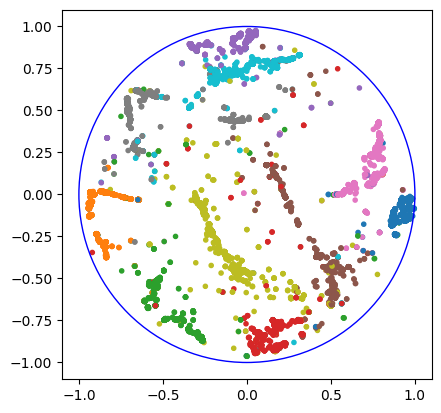

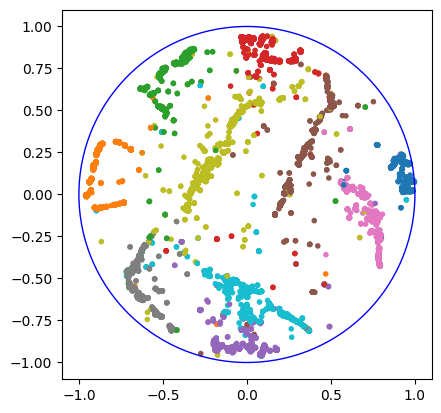

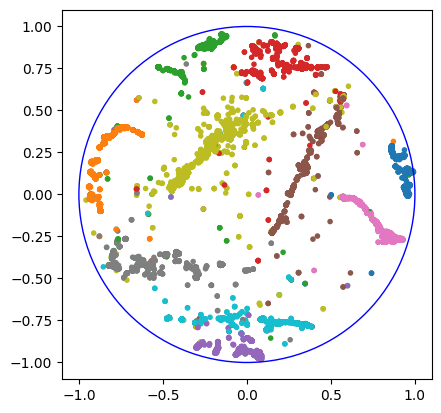

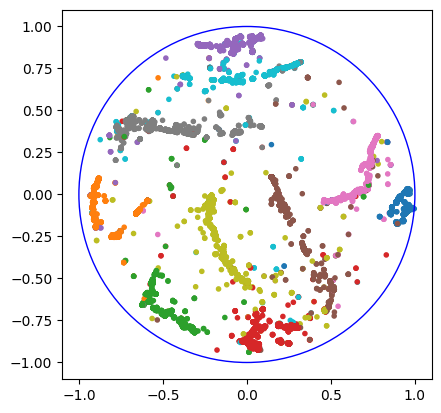

In [9]:
# TEST FOR DIFFERENT GRID_N VALUES
u_grid_ns = [10, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280, 300]
num_points = 20000
dataset = Datasets.MNIST  # the Datasets handler provides access to several data sets used throughout the repository
logging = False

ugrid_gpu_precisions = []
ugrid_gpu_recalls = []
ugrid_gpu_runtimes = []

#for i, u_grid_n in enumerate(u_grid_ns):
#    ugrid_gpu_precisions.append([])
#    ugrid_gpu_recalls.append([])
#    ugrid_gpu_runtimes.append([])

for i, u_grid_n in enumerate(u_grid_ns):
    p, r, t = run_mult(2, num_points, False, True, u_grid_n) # Running approx. using uniform grid
    ugrid_gpu_precisions.append(p)
    ugrid_gpu_recalls.append(r)
    ugrid_gpu_runtimes.append(t)

#for j in range(2):
#    for i, u_grid_n in enumerate(u_grid_ns):
#        p, r, t = run_mult(2, num_points, False, True, u_grid_n) # Running approx. using uniform grid
#        ugrid_gpu_precisions[i] += p
#        ugrid_gpu_recalls[i] += r
#        ugrid_gpu_runtimes[i] += t

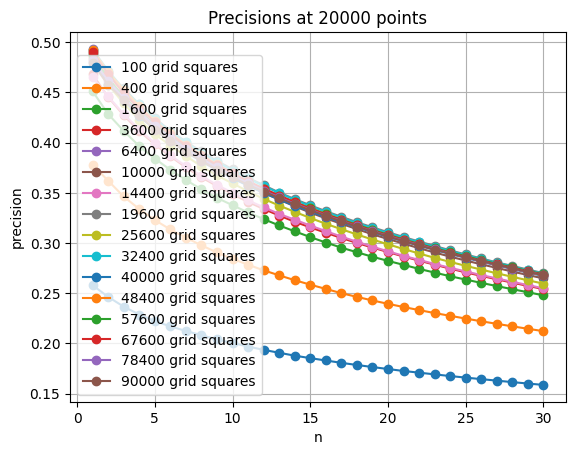

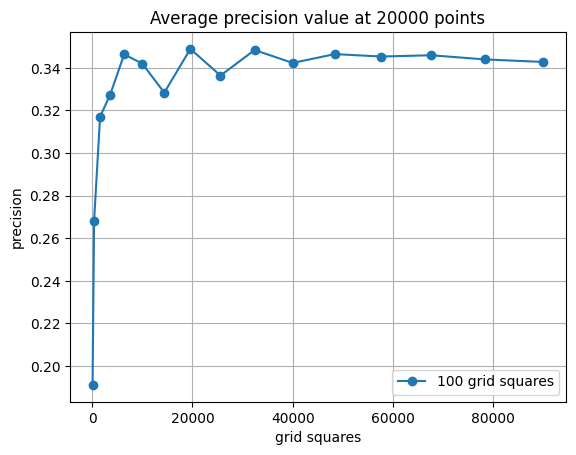

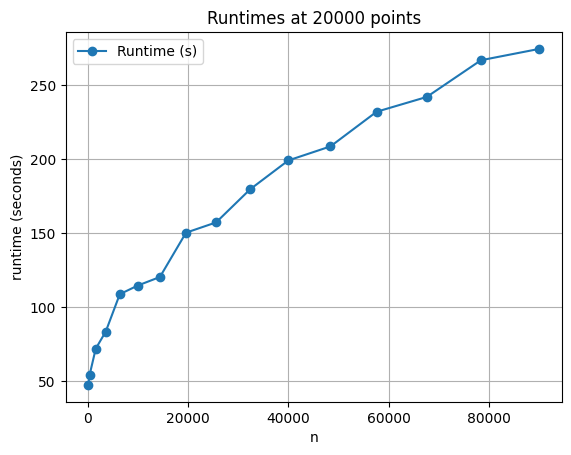

In [12]:
# RESULT DISPLAYING FOR DIFFERENT GRID_N_VALUES_TEST

data = ugrid_gpu_precisions
labels = [str(u_grid_n*u_grid_n) + " grid squares" for u_grid_n in u_grid_ns]
plot_points(data, labels, f"Precisions at {num_points} points", "n", "precision")

data = [np.mean(precisions) for precisions in ugrid_gpu_precisions]
plot_points([data], labels, f"Average precision value at {num_points} points", "grid squares", "precision", [u_grid_n*u_grid_n for u_grid_n in u_grid_ns])

data = [ugrid_gpu_runtimes]
#labels = [str(u_grid_n*u_grid_n) + " grid squares" for u_grid_n in u_grid_ns]
plot_points(data, ["Runtime (s)"], f"Runtimes at {num_points} points", "n", "runtime (seconds)", [u_grid_n*u_grid_n for u_grid_n in u_grid_ns])